In [1]:
import numpy as np
import pandas as pd
import datetime
import random
import pickle
import matplotlib.pyplot as plt
import time as tim
from IPython.display import clear_output
import copy

In [2]:
# 한시간 간격으로 전체 bss에서 호출 나머지는 1과 동일

In [3]:
# # 피클 저장, 로드
# # save
# with open('data.pickle', 'wb') as f:
#     pickle.dump(data, f, pickle.HIGHEST_PROTOCOL)

# # load
# with open('data.pickle', 'rb') as f:
#     data = pickle.load(f)

In [4]:
day_n = 2

bike_n = 300
D_size = 42*bike_n*10
# D_terminal_size = 42*bike_n*10


qrate = 0.99
exploration_rate = 0.01
max_w_i = 1
beta = 0.4
beta_zero = 1

base_freq=[3,12,13,10,8,6,6,10,16,16,9,3] # 주문발생빈도 쌍봉형
day_avg = [60, 56, 52, 48, 44, 40, 35, 31, 27, 23] # 하루 평균 주문건수 n그룹
char_rule=[30, 24, 20, 15, 12] # 배터리 교환 규칙
# 10 25 50 85 100

fit_count=0

time_char_rule=[]

hochool_gijoon = 50 # 호출하는 바이크 배터리 기준
gaa = 0.4
order_limit_r=1500

bss_n = 30 # 고정
interval_sigma = 300 # 배달간격 표준편차 (초단위)
dist_sigma = 300 # 미터단위 배달거리의 표준편차
velo = 40000/3600 # 이륜차 평균속도
velo_sigma = 2 # 이륜차 속도의 표준편차
gene_hyper = 3100
bat_max_wh = 1850 # 배터리 1팩 기준 wh / 1 cycle => 247 감소
bat_max_dist = 35000 # 한 팩 당 총 이동거리
bat_somo = bat_max_wh/bat_max_dist
cycle_loss = 0.247
best_episode_reward=0
TD_error_list=np.array([])
TD_max=1
epsilon = 0.0001

delivery_reward = 10000
n_sample = 48

history = []
pred_ub = []
pred_lb = []

In [5]:
# from keras.callbacks import Callback
# class CustomHistory(Callback):
#     def init(self):
#         self.losses = []
#         self.vol_losses = []
#         self.accs = []
#         self.vol_accs = []        
        
#     def on_epoch_end(self, batch, logs={}):
#         self.losses.append(logs.get('loss'))
# #         self.vol_losses.append(logs.get('vol_loss'))
# #         self.accs.append(logs.get('acc'))
# #         self.vol_accs.append(logs.get('acc_loss'))

## MLP

In [6]:
# ############ CNN
# from keras import backend as K
# from keras.backend import expand_dims
# import tensorflow as tf
# from keras.models import Model
# from keras.layers import LSTM,Reshape,Embedding, LSTM, Dense,Embedding, concatenate, LSTM,Conv1D, MaxPooling1D, Flatten, Dropout, Lambda, BatchNormalization, Activation
# from keras.layers import merge
# from keras import optimizers
# from keras import Input

# from keras.optimizers import RMSprop
# from keras.optimizers import Adam
# tf.device("/device:GPU:0")
# def make_model():
#     def custom_loss(y_true, y_pred):
#         out =  ((y_pred-delta)*y_true)**2
#         return K.sum(out)
#     # 딥러닝 모델
#     #         시간(1), 좌표(2), 충전량(1), 충전소별 큐 길이(30), 충전소별잔여 배터리량(180)
#     delta = Input(shape=(1,))
#     q_freq = Input(shape=(2,),name='freq')


#     q_distance = Input(shape=(30,),name='distance')


#     q_soc = Input(shape=(1,),name='soc')


#     q_bss_queue = Input(shape=(30,),name='bss_queue')


#     q_bss_soc = Input(shape=(90,),name='bss_soc')
#     q_time = Input(shape=(1,),name='time')


#     concatenated = concatenate([q_freq, q_distance, q_soc, q_bss_queue,q_bss_soc,q_time])


#     x = Dense(200,activation='relu')(concatenated)
#     x = Lambda(lambda x: K.expand_dims(x,axis=2))(x)
#     x = LSTM(50,activation = 'relu', input_shape=(200,1))(x)
#     x = concatenate([x,q_distance,q_soc,q_bss_queue,q_time])
#     x = Dense(112,activation='relu')(x)  

#     advantage = Dense(31, activation = 'linear')(x)
# #     fc2 = Dense(384,activation='relu')(x)
#     value = Dense(1, activation = 'linear')(x)
#     policy = Lambda(lambda x: x[0]-K.mean(x[0],keepdims=True)+x[1])([advantage, value])

#     model = Model([q_freq, q_distance, q_soc, q_bss_queue, q_bss_soc, q_time],[policy])
#     train_model = Model([q_freq, q_distance, q_soc, q_bss_queue, q_bss_soc,q_time,delta],[policy])
#     train_model.compile(optimizer = Adam(lr=0.00005), loss=custom_loss)

#     # # opti =  RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.0)

#     model.compile(optimizer='rmsprop',loss=['mse'])
#     return model, train_model
# model, train_model = make_model()
# model2, train_model2 = make_model()

# model.summary()



## CNN

In [7]:
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv1D, Flatten, concatenate, Lambda, Add, Activation, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def resnet_block(input_tensor, filters, kernel_size=3, strides=1):
    x = Conv1D(filters, kernel_size, strides=strides, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv1D(filters, kernel_size, strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    shortcut = Conv1D(filters, 1, strides=strides, padding='same')(input_tensor)
    shortcut = BatchNormalization()(shortcut)
    
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

def make_model():

    def custom_loss(y_true, y_pred):

        c = tf.math.multiply(y_pred, y_true)
        d = tf.math.square(c)
        out = tf.math.reduce_mean(d, axis=None)
        # out =  tf.math.square(tf.math.multiply(tf.math.add(y_pred, tf.math.negative(delta)), y_true))
        return out
    # 딥러닝 모델
    #         시간(1), 좌표(2), 충전량(1), 충전소별 큐 길이(30), 충전소별잔여 배터리량(180)
    delta = Input(shape=(1,))
    mask = Input(shape=(2,))

    important_state = Input(shape=(34,),name='important_state')

    bss_state = Input(shape=(120,),name='bss_state')

    other_bike_state = Input(shape=(1,),name='other_bike_state')


    concatenated = concatenate([important_state,bss_state,other_bike_state])

    # concatenated = Lambda(lambda x: K.expand_dims(x,axis=2))(concatenated)
    concatenated = tf.keras.layers.Reshape((155, 1), input_shape = (155,))(concatenated)


    x = resnet_block(concatenated, filters=32, kernel_size=4, strides=1)
    x = resnet_block(x, filters=64, kernel_size=4, strides=1)
    x = resnet_block(x, filters=64, kernel_size=4, strides=1)
    x1 = Conv1D(filters=2,kernel_size=4, strides=1, activation = 'relu')(x)
    x1 = Flatten()(x1)
#         x = concatenate([x,important_state])

    x1 = Dense(100,activation='relu')(x1)
    x2 = Conv1D(filters=2,kernel_size=4, strides=1, activation = 'relu')(x)
    x2 = Flatten()(x2)
    x2 = Dense(100,activation='relu')(x2)

    advantage = Dense(2)(x1)
    value = Dense(1)(x2)

    policy = Lambda(lambda x: x[0]-K.mean(x[0],keepdims=True)+x[1])([advantage, value])
    policy = Lambda(lambda x: x[0]+x[1])([policy, mask])
    a = tf.math.negative(delta)
    b = tf.math.add(policy, a)


    model = Model([important_state,bss_state,other_bike_state, mask],[policy])
    train_model = Model([important_state,bss_state,other_bike_state,mask,delta],[b])
    train_model.compile(optimizer = Adam(learning_rate=0.00005), loss=[custom_loss])

    # # opti =  RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.0)

    model.compile(optimizer='rmsprop',loss=['mse'])
    return model, train_model
model, train_model = make_model()
model2, train_model2 = make_model()

model.summary()

2024-07-18 16:54:17.983381: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-18 16:54:17.989964: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-07-18 16:54:17.989990: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-07-18 16:54:20.740001: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could not open file to read NUMA node: /sys/bus/pci/devices/0000:3b:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-18 16:54:20.740302: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 important_state (InputLayer)   [(None, 34)]         0           []                               
                                                                                                  
 bss_state (InputLayer)         [(None, 120)]        0           []                               
                                                                                                  
 other_bike_state (InputLayer)  [(None, 1)]          0           []                               
                                                                                                  
 concatenate (Concatenate)      (None, 155)          0           ['important_state[0][0]',        
                                                                  'bss_state[0][0]',          

In [8]:
# class ReplayBuffer():
#     def __init__(self, size):
#         self._storage = []
#         self._maxsize = size
#         self._next_idx = 0
        
#         it_capacity = 1
#         while it_capacity < size:
#             it_capacity *= 2
#         self._it_sum = SumSegmentTree(it_capacity)
#         self._it_min = MinSegmentTree(it_capacity)
#         self._max_priority = 1.0
        
#     def add(self, s1, a, r, s2, terminal):
        
#         self._it_sum[self._next_idx] = self._max_priority ** self._alpha
#         self._it_min[self._next_idx] = self._max_priority ** self._alpha
        
#         self._next_idx = (self._next_idx + 1) % self._maxsize
        
#     def _sample_proportional(self, batch_size):
#         mass = []
#         total = self._it_sum.sum(0, len(self._storage)-1)
#         mass = np.random.random(size=batch_size)*total
#         idx = self._it_sum.find_prefixsum_idx(mass)
#         return idx
    
#     def sample(self, batch_size, beta = 0, env: Optional[VecNormalize] = None):

#         idxes = self._sample_proportional(batch_size)
        
#         weights = []
#         p_min = self._it_min.min() / self._it_sum.sum()
#         max_weight = (p_min * len(self._storage)) ** (-beta)
#         p_sample = self._it_sum[idxes] / self._it_sum.sum()
#         weights = (p_sample * len(self._storage)) ** (-beta) / max_weight
#         return weights, idxes

#     def update_priorities(self, idxes, priorities):

#         self._it_sum[idxes] = priorities ** self._alpha
#         self._it_min[idxes] = priorities ** self._alpha

#         self._max_priority = max(self._max_priority, np.max(priorities))

In [9]:
from tensorflow.keras.models import load_model


def model_fit():
    global fit_count, model2, beta
#         시간(1), 좌표(2), 충전량(1), 충전소별 큐 길이(30), 충전소별잔여 배터리량(180)

#     if fit_count%10000==0:
#         if fit_count < 1000000:
#             print('model updated')
#             model2.set_weights(model.get_weights())
#         if fit_count%100000==0:
#             with open('D_memory(230).pickle', 'wb') as f:
#                 pickle.dump(D_memory, f)
#             with open('D_terminal.pickle', 'wb') as f:
#                 pickle.dump(D_terminal, f)

#         print('model updated')
    global best_episode_reward
#         fit_count += 1
# #         model2 = load_model('best_model.h5')
# #         model2.compile(optimizer='rmsprop',loss=['mse'])
#         model2.set_weights(model.get_weights())
#         best_episode_reward=0
    if fit_count%8==0:
        if (len(D_memory)>1000):
            train_x = []
            train_y = []
            tmp1=[]
            tmp2=[]
            tmp3=[]
            temp=[]
            tmp_mask=[]
            delt=[]
            sample_weight=[]
            
            choices = random.choices(TD_index, weights = TD_error_list, k=n_sample)
            for choice in choices:
                # 비복원추출

                train=D_memory[choice]

                tmp1.append(train[0][0:34])
                tmp2.append(train[0][34:154])
                tmp3.append(train[0][154:155])
                mask = masking(train[0])
                tmp_mask.append(mask)



                tmp=[]
                tmp.append(np.array([train[3][0:34]]))
                tmp.append(np.array([train[3][34:154]]))
                tmp.append(np.array([train[3][154:155]]))
                
                mask = masking(train[3])

                tmp.append(np.array([mask]))
                
                
                
                with tf.device('/device:CPU:0'):
                    predicted1 = model2.predict_on_batch(tmp)[0][np.argmax(model.predict_on_batch(tmp).copy())]
#                 print(np.argmax(model.predict_on_batch(tmp).copy()))
                
                tmp_max = qrate*predicted1

                tmp=np.zeros(2)
                tmp[train[1]]=1.0

                temp.append(tmp)
                
                w_i = ((len(D_memory)*TD_error_list[choice]/np.sum(TD_error_list))**(-beta))/max_w_i
                
                sample_weight.append(w_i)
                
                delt.append((train[2] + tmp_max*(1-train[4])))
#                 print(train[1], delt[-1])
                
                
                
                tmp=[]
                tmp.append(np.array([train[0][0:34]]))
                tmp.append(np.array([train[0][34:154]]))
                tmp.append(np.array([train[0][154:155]]))
                mask = masking(train[0])
                tmp.append(np.array([mask]))
                with tf.device('/device:CPU:0'):
                    TD_error_list[choice] = np.abs(train[2] + tmp_max*(1-train[4])-model.predict_on_batch(tmp)[0][train[1]]) + epsilon
                
#             if len(D_terminal)>100:
#                 for i in range(15):

#                     train=D_terminal[random.randint(0,len(D_terminal)-1)]

#                     tmp1.append([train[0][0]])
#                     tmp2.append(train[0][1:3])
#                     tmp3.append([train[0][3]])
#                     tmp4.append(train[0][4:34])
#                     tmp5.append(train[0][34:124])


#                     tmp=[]
#                     tmp.append(np.array([[train[3][0]]]))
#                     tmp.append(np.array([train[3][1:3]]))
#                     tmp.append(np.array([[train[3][3]]]))
#                     tmp.append(np.array([train[3][4:34]]))
#                     tmp.append(np.array([train[3][34:124]]))
#                     predicted1 = model2.predict_on_batch(tmp).copy()
#                     tmp_max = qrate*np.max(predicted1)

#                     tmp=np.zeros(31)
#                     tmp[train[1]]=1.0

#                     temp.append(tmp)
#                     delt.append(train[2] + tmp_max*(1-train[4]))

# #                     tmp1,tmp2,tmp3,tmp4,tmp5 = copy.deepcopy(tmp1),copy.deepcopy(tmp2),copy.deepcopy(tmp3),copy.deepcopy(tmp4),copy.deepcopy(tmp5)
# #                     temp = copy.deepcopy(temp)

# #                 tmp1,tmp2,tmp3,tmp4,tmp5 = copy.deepcopy(tmp1),copy.deepcopy(tmp2),copy.deepcopy(tmp3),copy.deepcopy(tmp4),copy.deepcopy(tmp5)
# #                 temp = copy.deepcopy(temp)



            train_y=[np.array(temp)]
            train_x=[np.array(tmp1),np.array(tmp2),np.array(tmp3),np.array(tmp_mask),np.array(delt)]
            sample_weight = np.asarray(sample_weight)
            with tf.device('/device:CPU:0'):
                train_model.train_on_batch(train_x,train_y, sample_weight = sample_weight)
            
            beta = beta_zero + (1-beta_zero)*(fit_count/1000000)
            if beta > 1:
                beta = 1
#         elif len(D_sparse_order)<2:
#             D_sparse_order.append(D_often_order[0])

#     fit_count +=1


In [10]:
######### MLP
# import tensorflow as tf
# from keras import models, layers
# from keras.models import load_model
# # 딥러닝 모델
# model = models.Sequential()
# model.add(layers.Dense(214,activation='relu',input_shape=(214,)))
# model.add(layers.Dropout(0.1))
# model.add(layers.Dense(100,activation='relu'))
# model.add(layers.Dropout(0.1))
# model.add(layers.Dense(50,activation='relu'))
# model.add(layers.Dropout(0.1))
# model.add(layers.Dense(31,activation='linear'))
# model.compile(optimizer = 'rmsprop', loss='mse', metrics=['mae','mse'])
# model.summary()

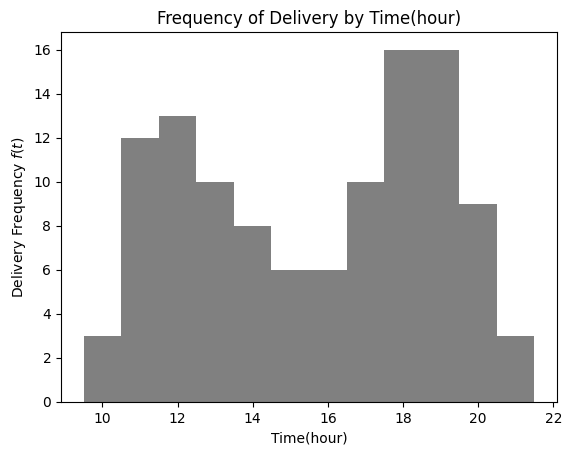

In [11]:
import matplotlib.pyplot as plt
base_freq=[3,12,13,10,8,6,6,10,16,16,9,3]
a = [10,11,12,13,14,15,16,17,18,19,20,21]
plt.bar(a, base_freq, color='gray'
        , width = 1
       )
plt.xlabel('Time(hour)')
plt.ylabel('Delivery Frequency $f(t)$')
plt.title('Frequency of Delivery by Time(hour)')
plt.savefig('delivery_frequency.png')
plt.show()


In [12]:
# import pandas as pd
# data = pd.read_csv(r'kt배달데이터1.csv')
# a = data.iloc[:,-1].sum()
# print(a)
# data2 = pd.read_csv(r'kt배달데이터2.csv')
# b=data2.iloc[:,-1].sum()
# print(b)
# a+b

In [13]:
# print(data.iloc[:,-1].sum())

In [14]:
# data = data[data['강원도']=='서울특별시']

In [15]:
# i=0
# data[data['00']==i]['1']

In [16]:
# import numpy as np
# import matplotlib.pyplot as plt
# %matplotlib inline
# tmp=[]
# for i in range(24):
#     tmp.append(sum(data[data['00']==i]['1']))
# plt.xlabel('Time(hour)')
# plt.ylabel('Number of Hourly Delivery Orders')
# plt.title('Hourly Delivery Orders for One Year in Seoul')

# plt.bar(np.arange(0,24), tmp, color = 'gray')
# plt.tight_layout()
# # plt.savefig('hourly_orders.png')
# plt.show()

In [17]:
# a = tmp[10:22]
# tmp = sum(a)
# for i in range(len(a)):
#     a[i] = a[i]*100/tmp

In [18]:
# for i in range(len(a)):
#     a[i] = round(a[i],3)

In [19]:
# import numpy as np
# import matplotlib.pyplot as plt
# %matplotlib inline
# tmp=[]
# for i in range(24):
#     tmp.append(sum(data2[data2['00']==i]['1']))
# plt.xlabel('Time(hour)')
# plt.ylabel('Number of Hourly Delivery Orders')
# plt.title('Hourly Delivery Orders for One Year in Seoul')

# plt.bar(np.arange(0,24), tmp, color = 'gray')
# plt.tight_layout()
# # plt.savefig('hourly_orders.png')
# plt.show()

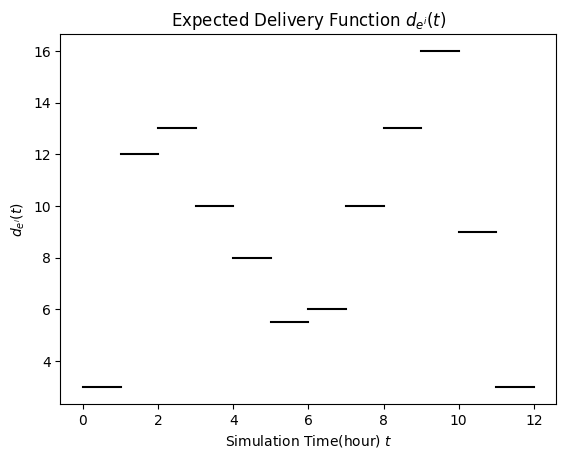

In [20]:
base_freq=[3,12,13,10,8,5.5,6,11,13.5,16,9,3]
a = [[10,11,11,12,12,13,13,14,14,15,15,16,16,17,17,18,18,19,19,20,20,21,21,22],[3,3,12,12,13,13,10,10,8,8,6,6,6,6,10,10,16,16,16,16,9,9,3,3]]
plt.plot([0,1], [3,3], color = 'black')
plt.plot([1,2], [12,12], color = 'black')
plt.plot([2,3], [13,13], color = 'black')
plt.plot([3,4], [10,10], color = 'black')
plt.plot([4,5], [8,8], color = 'black')
plt.plot([5,6], [5.5,5.5], color = 'black')
plt.plot([6,7], [6,6], color = 'black')
plt.plot([7,8], [10,10], color = 'black')
plt.plot([8,9], [13,13], color = 'black')
plt.plot([9,10], [16,16], color = 'black')

plt.plot([10,11], [9,9], color = 'black')
plt.plot([11,12], [3,3], color = 'black')
plt.xlabel('Simulation Time(hour) $t$')
plt.ylabel('$d_{e^{i}}(t)$')
plt.title('Expected Delivery Function $d_{e^{i}}(t)$')
# plt.savefig('expecteddelivery.png')
plt.show()

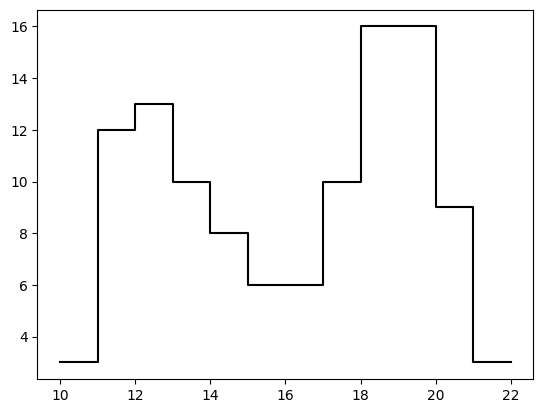

In [21]:
a = [[10,11,11,12,12,13,13,14,14,15,15,16,16,17,17,18,18,19,19,20,20,21,21,22],[3,3,12,12,13,13,10,10,8,8,6,6,6,6,10,10,16,16,16,16,9,9,3,3]]
plt.plot(a[0], a[1], color = 'black')
plt.show()

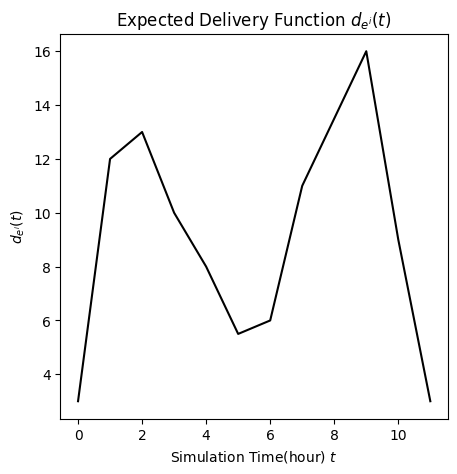

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline
#          10 11 12 13 14 15 16 17 18 19 20 21
# base_freq=[2, 10,13,12, 5, 2, 2,10,16,16,9, 3]
plt.figure(figsize=(5, 5))
plt.plot(range(0,12),base_freq, color = 'black')
plt.xlabel('Simulation Time(hour) $t$')
plt.ylabel('$d_{e^{i}}(t)$')
plt.title('Expected Delivery Function $d_{e^{i}}(t)$')
# plt.savefig('expected_delivery.png')
plt.show()

In [23]:
def update_memory(s1,a,r,s2,time):
#     print(a, r, time)
    global fit_count, episode_reward, D_often, D_sparse, TD_error_list, TD_index, TD_max, terminal
    fit_count +=1
    if fit_count%10000==0:
        temp = []
        for i in range(len(initial_states)):
            tmp=[]
            tmp.append(np.array([initial_states[i][0:34]]))
            tmp.append(np.array([initial_states[i][34:154]]))
            tmp.append(np.array([initial_states[i][154:184]]))
            mask = masking(initial_states[i])
            tmp.append(np.array([mask]))
            with tf.device('/device:CPU:0'):
                predicted1 = model.predict_on_batch(tmp).copy()
            temp.append(np.max(predicted1))
        history.append(np.mean(temp))
        pred_ub.append(np.max(temp))
        pred_lb.append(np.min(temp))
        tmp_dic = {}
        tmp_dic['history'] = history
        tmp_dic['pred_ub'] = pred_ub
        tmp_dic['pred_lb'] = pred_lb
        with open('convergence_CDQN4EM_G(300).pickle', 'wb') as f:
            pickle.dump(tmp_dic, f)
        # plt.title('Average Q at Initial')
        plt.plot(np.arange(1,len(history)+1),history)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.ylabel('Average Q-value', fontsize=18)
        plt.xlabel('Learning steps ($\\times 10^6$)', fontsize=18)
        plt.fill_between(np.arange(1,len(history)+1),pred_ub, pred_lb, color = 'k', alpha = 0.1, label = 'Standard Deviation')
        plt.legend()
        plt.savefig('CDQN4EM_G.png', dpi=300)
        plt.show()
        if fit_count < 1000000:
            print('model updated')
            model2.set_weights(model.get_weights())
        if fit_count%100000==0:
            with open('D_memory(210).pickle', 'wb') as f:
                pickle.dump(D_memory, f)

    if tmp_terminal == False:
        r = r/(delivery_reward)
        episode_reward += r
        
        if time<=43200:
            D_memory.append([s1, a, r, s2,0])

        elif time>43200:
            D_memory.append([s1, a, r, s2,1])

        if len(D_memory)>D_size:
                D_memory.pop(0)

    elif tmp_terminal == True:

        r = r/(delivery_reward)
        episode_reward += r
        
        D_memory.append([s1, a, r, s2,1])

        if len(D_memory)>D_size:
                D_memory.pop(0)

    TD_error = TD_max
    if len(TD_error_list)<D_size:
        TD_index = np.arange(0,len(TD_error_list)+1)
    else:

        TD_error_list = np.delete(TD_error_list,0)
    TD_error_list = np.append(TD_error_list, TD_error)
        

In [24]:
# 일초기화에서 위치, status, bat, charge_num, order_freq, order_list, order

class Bike():
    def __init__(self):
        self.key=0
        self.cur_time = 0
        self.loc = (0,0)
        self.fu_loc = (0,0)
        self.ploc=(0,0)
        self.status = 'daegi'
        self.bat = [0,1]
        self.charge_count = 0
        self.order_freq = 2
        self.acc_dist=0
        self.order_list = []
        self.bss_list=[] # [충전소로 출발하는 시간, 충전소 도착할시간, 충전소index, 충전소로 출발할 때 오토바이 위치]
        self.order_count = 0
        self.charge_rule = 50
        self.sooneung = 100
        self.cur_state=[]
        self.action=1
        self.reward=0
        self.fu_state=np.ones(155)
        self.moving_queue_time = 0
        self.stay_queue_time = 0
  
        self.history = [[self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count]] # 
        self.moving_queue = 0 # time
    def __lt__(self, other):
        return self.key < other.key
    
    def decide(self):
        
        self.ploc = self.loc
        global event_list, state, fubike_idx, exploration_rate
        event_list.pop(0)
        if time < 43200:
            self.reward = 0
    #         현주문빈도(1), 다음주문빈도(1), 배터리(1), 시간(1), 충전소까지거리(30), 큐길이, 충전량(120), 타밬정보(1)
            cur_state=[]
            # 현재 시간 주문빈도
            if time < 43200:
                cur_state.append(base_freq[int(time/3600)]/16)
            else:
                cur_state.append(base_freq[-1]/16)
            # 다음 시간 주문 빈도
            if int(time/3600) >=11:
                cur_state.append(base_freq[-1]/16)
            # 일종료시점이면 현재시간으로
            else:
                cur_state.append(base_freq[int(time/3600)+1]/16)
            # 본인 배터리 용량
            cur_state.append(battery[self.bat[0]].soc/100)
            # 시간
            cur_state.append(time/43200)
            for i in range(len(bss)):
                # 각 bss 까지의 상대거리 (30)
                cur_state.append(distance(self.loc, bss[i].loc)/5000)


            # bss 정보(90)
            for i in range(len(bss)):
                # 충전소별 큐 길이 (30)
                cur_state.append(len(bss[i].queue)/3)
                # 충전소별 배터리 충전량 (높은 순)(90)
                tmp=[]
                for j in range(2,8,1):
                    battery[bss[i].slot[j]].bat_charge()
                for j in range(2,8,2):
                    tmp.append(battery[bss[i].slot[j]].soc)
                tmp = sorted(tmp,reverse = True)
                for j in range(len(tmp)):
                    cur_state.append(tmp[j]/100)


            # 다른 바이크 정보 (배터리)(1)
            count=0
            for i in range(len(bike)):
                if battery[bike[i].bat[0]].soc < 50:
                    count +=1
            cur_state.append(count)


            self.reward = 0
            self.cur_state = copy.deepcopy(cur_state)

    #         state = copy.deepcopy(cur_state)
            if (len(D_memory)>0)&(fubike_idx == self.key):
                D_memory[-1][3] = cur_state
            model_fit()
            bike[fubike_idx].fu_state = cur_state
            fubike_idx = self.key
            if exploration_rate < 0:
                exploration_rate = 0
            if random.randint(0,100)/100<1-exploration_rate:
                tmp=[]
                tmp.append(np.array([cur_state[0:34]]))
                tmp.append(np.array([cur_state[34:154]]))
                tmp.append(np.array([cur_state[154:155]]))
                mask = masking(cur_state)
                tmp.append(np.array([mask]))
                with tf.device('/device:CPU:0'):
                    qvalue = model.predict_on_batch(tmp)
                action = np.argmax(qvalue)
            else:
                mask = masking(cur_state)
                aa=False
                count = 0
                while aa==False:
                    count += 1
                    action = random.randint(0,1)
                    if mask[action]==0:
                        aa=True
                    if count > 50:
                        aa=True
                        action = 1
            self.action = action

            if action==1:
                event_list.insert(0,[time, self, 'order_generate'])
            else:     
                # tmp: 가까운 순 정렬
                tmp = []
                for i in range(len(bss)):
                    tmp.append([distance(self.loc, bss[i].loc), i])
                tmp = sorted(tmp)
                
                action = len(bss)+1
                # 가까운 순 정렬된거로 for문 돌리면서, 교체가능 배터리 있으면 글루 ㄱㄱ, break
                k=0
                while action ==len(bss)+1:
                    for i in range(len(bss)):
                        idx = tmp[i][1]

                        tmp_bss=[]
                        for j in range(2,8,1):
                            battery[bss[idx].slot[j]].bat_charge()
                        for j in range(2,8,2):
                            tmp_bss.append(-battery[bss[idx].slot[j]].soc)
                        tmp_bss = sorted(tmp_bss)
                        if len(bss[idx].queue) < 3:
                            if -tmp_bss[len(bss[idx].queue)] > 95-k:
                                action = idx
    #                             print(1, action)
                                break
                    k+=1
                    if k > 50:
                        action = random.randint(0,29)
                event_list.insert(0,[time, self, 'go_bss',action])



        

        
        


            
    def order_generate(self):
        global event_list
#         self.status='daegi'
        interval = gene_hyper/self.order_freq[int(time/3600)]
        gen_inter = np.random.normal(interval,interval_sigma)    
        while gen_inter < 0:
            gen_inter = np.random.normal(interval,interval_sigma)
        if time//3600 != (time+gen_inter)//3600:
            if time//3600 != 11:
                interval = gene_hyper/((self.order_freq[int(time/3600)]+self.order_freq[int(time/3600)+1])/2)
            gen_inter = np.random.normal(interval,interval_sigma)
            while gen_inter < 0:
                gen_inter = np.random.normal(interval,interval_sigma)
        max_dist = distance((0,0), self.loc)

        tt=False
        while tt==False:
            gen_dist = np.random.normal(2400,dist_sigma)
            while (gen_dist > 3465)|(gen_dist <max_dist):
                gen_dist = np.random.normal(2400,dist_sigma)

            food_list=[]
            for i in range(len(food_loc)):
                if distance(food_loc[i],self.loc) < gen_dist:
                    food_list.append(i)
            idx = food_list[np.random.randint(len(food_list))]
            
            x=np.random.random()
            theta = np.random.random()*2*np.pi
            r=gen_dist - distance(food_loc[idx],self.loc)
            house_loc = (food_loc[idx][0]+r*np.cos(theta), food_loc[idx][1]+r*np.sin(theta))

            tt=discri(house_loc)



        tmp_time = gen_inter + time
        self.fu_loc = food_loc[idx]
        event_list.pop(0)
        pickuptime = distance(food_loc[idx],self.loc)/velo
        if tmp_time < 43200:
            if tmp_time - pickuptime <time:
                self.status = 'pickup'
            else:
                for i in range(len(event_list)):
                    if event_list[i][0] > tmp_time-pickuptime:
                        event_list.insert(i,[tmp_time-pickuptime, self, 'change_status_pickup'])
                        break
                    elif i == len(event_list)-1 :
                        event_list.append([tmp_time-pickuptime, self, 'change_status_pickup'])


            for i in range(len(event_list)):
                if event_list[i][0] > tmp_time:
                    event_list.insert(i,[tmp_time, self, 'pickup'])
                    break
                if i == (len(event_list)-1):
                    event_list.append([tmp_time, self, 'pickup'])

            self.order_list.append([tmp_time, food_loc[idx], house_loc, self.loc])
        else:
#             self.terminal = True
            self.reward += delivery_reward
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, 1000000)
        
    def pickup(self):
        global event_list
        order = self.order_list[len(self.order_list)-1]
        
        self.status='delivery'
        self.cur_time= time
        self.loc=order[1]
        self.acc_dist=self.acc_dist+ distance(order[3], order[1])
        self.history.append([self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count])
    #     self.soc=self.soc-(self.dist(self.order_list[3], self.order_list[1])/2*bat_somo/bat_max_dist
        tmp_velo = np.random.normal(velo,velo_sigma)
        while (tmp_velo > velo*1.2)|(tmp_velo <velo*0.8):
            tmp_velo = np.random.normal(velo,velo_sigma)
      
        tmp_time = time + distance(order[1],order[2])/tmp_velo
        self.fu_loc = order[2]
        event_list.pop(0)
        battery[self.bat[0]].bat_consume()
        battery[self.bat[1]].bat_consume()
        
        for i in range(len(event_list)):
            if event_list[i][0] > tmp_time:
                event_list.insert(i, [tmp_time, self, 'delivery'])
                break        
            if i == (len(event_list)-1):
                event_list.append([tmp_time, self, 'delivery'])   
    def change_status_pickup(self):
        self.status = 'pickup'
        event_list.pop(0)

        
    def delivery(self):
        global event_list
        
        self.ploc = self.loc
        order = self.order_list[len(self.order_list)-1]
        self.status='delivery'
        self.cur_time= time
        self.loc=order[2]
        self.order_count=self.order_count+1
        self.acc_dist=self.acc_dist+ distance(order[1], order[2])
        self.history.append([self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count])
        battery[self.bat[0]].bat_consume()
        battery[self.bat[1]].bat_consume()
        
#         self.reward += delivery_reward
        
        

        
#         print(round(time,1),round(battery[self.bat[0]].soc,1),round(battery[self.bat[1]].soc,1))
        if battery[self.bat[0]].soc < 0:
            global terminal, tmp_terminal
#             bike[self.bik].reward = bike[self.bik].reward -2000
            print('oring occured')
            print('day start to termianl : %.1f'%time)
            terminal = True
            tmp_terminal = True
             
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, 1000000)
           
        else:
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, time)
          

    
        
 

        event_list.pop(0)
        event_list.insert(0, [time, self, 'decide'])
 


    def go_bss(self,tmp_idx):
        global event_list
        if self.status=='queue':
            self.reward = self.reward-10000
        if len(bss[tmp_idx].queue)>=3:
            self.reward = self.reward-delivery_reward
        self.status='go_bss'

        tmp_velo = np.random.normal(velo,velo_sigma)
        while (tmp_velo > velo*1.2)|(tmp_velo <velo*0.8):
            tmp_velo = np.random.normal(velo,velo_sigma)

        tmp_dist = distance(bss[tmp_idx].loc, self.loc)
        tmp_time = time + tmp_dist/tmp_velo
        self.fu_loc = bss[tmp_idx].loc

        self.bss_list.append([time, tmp_time, tmp_idx, self.loc])



        if tmp_time <=43200: 
            if int(tmp_time/3600)==int(time/3600):
                self.reward = self.reward - (tmp_time-time)*base_freq[int(tmp_time/3600)]
            else:
                if tmp_time <=43200: 
                    self.reward = self.reward - (int(tmp_time/3600)*3600-time)*base_freq[int(time/3600)] - (tmp_time-int(tmp_time/3600)*3600)*base_freq[int(tmp_time/3600)]

        self.moving_queue_time += tmp_time-time
        event_list.pop(0)
        for i in range(len(event_list)):
            if event_list[i][0]>tmp_time:
                event_list.insert(i,[tmp_time, self, 'arrived_bss', tmp_idx])
                break
            elif i == len(event_list)-1 :
                event_list.append([tmp_time, self, 'arrived_bss', tmp_idx])
        bss[tmp_idx].queue.append([tmp_time,self.key])
#         bss[tmp_idx].queue = sorted(bss[tmp_idx].queue)

        
    def arrived_bss(self,tmp_idx):
        ######큐 추가#####
        global episode_reward, event_list
        
        
        
        self.status='queue'
        self.cur_time = time
        tmp_bss = self.bss_list[-1]
        
        
        self.acc_dist = self.acc_dist + distance(self.loc, bss[tmp_idx].loc)
        self.loc = bss[tmp_idx].loc
        self.history.append([self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count])
                    
        battery[self.bat[0]].bat_consume()
        battery[self.bat[1]].bat_consume() 

#         print(round(time,1),round(battery[self.bat[0]].soc,1),round(battery[self.bat[1]].soc,1))


#         cur_state=[]
#         cur_state.append(time/43200)
#         cur_state.append(self.loc[0]/3000)
#         cur_state.append(self.loc[1]/3000)
#         cur_state.append(battery[self.bat[0]].soc/100)
#         for i in range(len(bss)):
#             cur_state.append(len(bss[i].queue)/3)
#         for i in range(len(bss)):
#             for j in range(2,8,2):
#                 battery[bss[i].slot[j]].bat_charge()
#                 cur_state.append(battery[bss[i].slot[j]].soc/100)
#         self.fu_state = cur_state
#         self.fu_state = copy.deepcopy(state)
        if battery[self.bat[0]].soc < 0:
            global terminal, tmp_terminal
#             bike[self.bik].reward = bike[self.bik].reward -2000
            print('oring occured')
            print('day start to termianl : %.1f'%time)
            terminal = True
            tmp_terminal = True

             
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, 1000000)
         

#         print(self.reward, battery[self.bat[0]].soc)
        
        
        
        event_list.pop(0)
        tmp=False
        for i in range(len(event_list)):
            if (event_list[i][1]== bss[tmp_idx])&(event_list[i][2]=='swap'):
                tmp=True
                break
        if tmp==False:    
            event_list.insert(0, [time+0.00001, bss[tmp_idx], 'swap'])
        
        bss[tmp_idx].count += 1



In [25]:
class Bss():
    def __init__(self):
        self.key=0
        self.queue = []
        self.loc = (0,0)
        self.slot = [None, None, 2,3,4,5,6,7]
        self.bss_history=[]
        self.min_his = []
        self.count=0
        
    def __lt__(self, other):
        return self.key < other.key
    
    def swap(self):
        global event_list
        
#         [status, time, bike[i] or bss[i], self.soc, charge_count]
        for i in range(6):
            idx = i+2
            bat_idx = self.slot[idx]
            battery[bat_idx].bat_charge()
            
#         if len(self.queue)>1: # 큐 이미 있으면 패스
#             event_list.pop(0)
#         else: #교환가능한거 있으면 교환, 없으면 대기
        tmp_soc = 10
        idx_list=[]
        if len(self.queue)<1:
            event_list.pop(0)
        elif self.queue[0][0]+0.0001>=time:
            event_list.pop(0)
            
            event_list.insert(0,[self.queue[0][0]+0.001, self, 'swap'])
            event_list = sorted(event_list)

        else:
            
            for i in range(6):
                idx = i+2
                if tmp_soc*0.99 <= battery[self.slot[idx]].soc:
                    tmp_soc = battery[self.slot[idx]].soc
                    idx_list.insert(0,idx)
                
            if tmp_soc >= 95:
                bike_idx = self.queue[0][1] # 바이크 인덱스
                idx_list# 배터리 슬롯 인덱스(앞에잇을수록 용량 많음)
                bike_bat = [bike[self.queue[0][1]].bat[0], bike[self.queue[0][1]].bat[1]]#넣은배터리index 2 리스트형
                bat_idx = [self.slot[idx_list[0]],self.slot[idx_list[1]]] # 뺀배터리 index 2 리스트형
                #히스토리업데이트
                #[bike index, bike 도착시간, bike나가는시간, 배터리슬롯index, 넣은배터리index, 뺀배터리index]
                self.bss_history.append([bike_idx, self.queue[0][0], time, [idx_list[0],idx_list[1]], bike_bat, bat_idx])
                #교환
#                 print(self.queue[0][0], time)
                arrived_time = self.queue[0][0]
                self.min_his.append([self.key, bike_idx,day, self.queue[0][0], time - self.queue[0][0]])


                if int((time+60)/3600) == int(arrived_time/3600):
                    if arrived_time > 43200:
                        bike[bike_idx].reward = delivery_reward
                    else:
                        bike[bike_idx].reward = bike[bike_idx].reward - ((time - arrived_time)+60)*base_freq[int((time+60)/3600)]
                else:
                    if time+60 <= 43200:
                        bike[bike_idx].reward = bike[bike_idx].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)] - (time+60 - int((time+60)/3600)*3600)*base_freq[int((time+60)/3600)]
                    else:
                        bike[bike_idx].reward = bike[bike_idx].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)-1] - (43200 - int((time+60)/3600)*3600)*base_freq[-1]

                
                bike[bike_idx].stay_queue_time += time - self.queue[0][0]

#                     global terminal, tmp_terminal
#                     tmp_terminal = True
                if time + 60 < 43200:
                    daegitime = time+60 - self.queue[0][0]
                else:
                    daegitime = 43200 - self.queue[0][0]
                if daegitime >3600:
                    global terminal
                    terminal = True
                    print('so long waited in ', self.key)
                    print('day start to termianl : %.1f'%time)

                self.slot[idx_list[0]]= bike_bat[0]
                self.slot[idx_list[1]]= bike_bat[1]
                
                bike[bike_idx].bat = bat_idx
                bike[bike_idx].charge_count += 1
                bike[bike_idx].history.append([bike[bike_idx].status, time, bike[bike_idx].loc, bike[bike_idx].acc_dist, bike[bike_idx].bat, bike[bike_idx].charge_count, bike[bike_idx].order_count])
                battery[bat_idx[0]].bik= bike_idx
                battery[bat_idx[0]].bss= None
                battery[bat_idx[0]].charge_count +=1 
                battery[bat_idx[1]].bik= bike_idx
                battery[bat_idx[1]].charge_count +=1
                battery[bat_idx[1]].bss= None
                battery[bat_idx[0]].status='on_bike'
                battery[bat_idx[0]].time = time
                battery[bat_idx[1]].time = time
                battery[bat_idx[1]].status='on_bike'
                battery[bat_idx[0]].bat_history.append([battery[bat_idx[0]].status, time, battery[bat_idx[0]].soc,battery[bat_idx[0]].bik,  battery[bat_idx[0]].charge_count])
                battery[bat_idx[1]].bat_history.append([battery[bat_idx[1]].status, time,battery[bat_idx[1]].soc, battery[bat_idx[1]].bik,  battery[bat_idx[1]].charge_count])

                battery[bike_bat[0]].bss = self.key
                battery[bike_bat[0]].status = 'charge'
                battery[bike_bat[0]].time = time
                battery[bike_bat[1]].time = time
                battery[bike_bat[1]].status = 'charge'
                battery[bike_bat[1]].bss = self.key
                battery[bike_bat[0]].bat_history.append([battery[bike_bat[0]].status, time, battery[bike_bat[0]].soc,battery[bike_bat[0]].bik,  battery[bike_bat[0]].charge_count])
                battery[bike_bat[1]].bat_history.append([battery[bike_bat[1]].status, time, battery[bike_bat[1]].soc,battery[bike_bat[1]].bik,  battery[bike_bat[1]].charge_count])


                event_list.pop(0)
                event_list.insert(0,[time+0.01, self, 'swap'])
                event_list.insert(0,[time+60, bike[bike_idx], 'decide'])
                event_list = sorted(event_list)
                self.queue.pop(0)
                if time < 43200:
                    if daegitime >1800:
                        update_memory(bike[bike_idx].cur_state, bike[bike_idx].action, bike[bike_idx].reward, bike[bike_idx].fu_state, 50000)
                    else:
                        update_memory(bike[bike_idx].cur_state, bike[bike_idx].action, bike[bike_idx].reward, bike[bike_idx].fu_state, time+60)
                else:
                    if daegitime >1800:
                        update_memory(bike[bike_idx].cur_state, bike[bike_idx].action, bike[bike_idx].reward, bike[bike_idx].fu_state, 50000)
                    else:
                        update_memory(bike[bike_idx].cur_state, bike[bike_idx].action, delivery_reward, bike[bike_idx].fu_state, 500000)    

 

                
                

            else:

                tmp_time = time + (99.5-tmp_soc)*72
                event_list.pop(0)

    
                event_list.append([tmp_time, self, 'swap'])  
                event_list = sorted(event_list)



In [26]:
class Battery():
    
    def __init__(self):
        self.key=0
        self.so=100
        self.bat_acc=0
        self.status='charge' # 'charge'<100% / 'full'=100% / 'on_bike'
        self.soc=100 # float
        self.bik=0 # bike에 인덱싱
        self.bss=0 # bss에 인덱싱
        self.time=0
        self.cycle=0 # 방전횟수
        self.max_charge=100
        self.charge_count=0 # int
        self.bat_history=[['on_bike', 0, 100, 0, 0]] # [status, time, bike[i] or bss[i], self.soc, charge_count]
        
    def __lt__(self, other):
        return self.key < other.key
        
    def bat_consume(self):
        self.status = 'on_bike'
        global terminal

        loc0=bike[self.bik].history[-1][2]
        loc1=bike[self.bik].history[-2][2]
        self.so = self.so - distance(loc0, loc1)/2*bat_somo/bat_max_wh*100
        self.soc = self.so*100/self.max_charge
        self.bat_history.append([self.status, time,self.soc, self.bik, self.charge_count])
#         if (self.soc < 25)&(self.soc>0):
#             if (bike[self.bik].status=='daegi')|(bike[self.bik].status=='pickup')|(bike[self.bik].status=='delivery'):
#                 bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 20:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 15:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 12:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 9:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 6:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 3:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
            
            

        
        
        if self.soc < 0:
            bike[self.bik].reward = bike[self.bik].reward - (delivery_reward*3)
#             print('day start to termianl : %.1f'%time, end = ' ')
#             terminal = True
#             print('god', end='')
             
#             update_memory(bike[self.bik].cur_state, bike[self.bik].action, bike[self.bik].reward, bike[self.bik].cur_state, 1000000)

    
#             model_fit()

            
            


    def bat_charge(self):
        self.status='charge'
        if len(self.bat_history)!=0:


            self.bat_acc+=(time-self.bat_history[-1][1])/72
            self.cycle= self.bat_acc/100
#             self.max_charge=100-(cycle_loss*self.cycle)
            
            self.so = self.so + (time-self.bat_history[-1][1])/72
            if self.so > self.max_charge:
                self.so = self.max_charge
            self.soc = self.so*100/self.max_charge
            
            self.bat_history.append([self.status, time, self.soc, self.bik, self.charge_count])    


<function matplotlib.pyplot.show(close=None, block=None)>

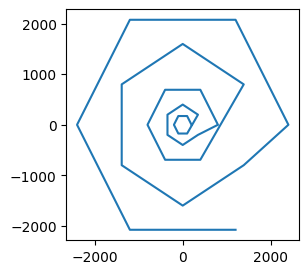

In [27]:
# 충전소 위치
bss_loc=[]
bss_r = [200,400,800,1600,2400]
for j in range(len(bss_r)): # 거리
    for i in range(6): # 각도
        if j%2==0:
            theta = np.pi*i/3
            bss_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))
        if j%2==1:
            theta = np.pi*i/3 + np.pi/6
            bss_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))
df =pd.DataFrame(bss_loc)
plt.figure(figsize=(3, 3))
plt.plot(df[0],df[1])
plt.show


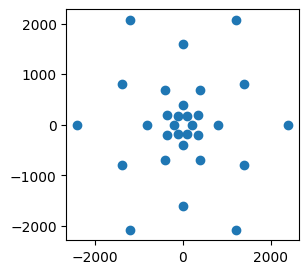

In [28]:
plt.figure(figsize=(3, 3))
plt.scatter(df[0],df[1])
plt.show()

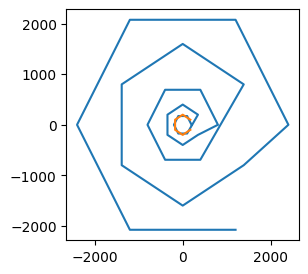

In [29]:
# # 음식점 위치 생성
# food_loc=[]
# n=30 # 음식점 개수
# r=1500
# #반지름 2km 원 위에 고르게 분포


# for i in range(n):
#     theta = 2*i*np.pi/n
#     food_loc.append((r*np.cos(theta), r*np.sin(theta)))
food_loc=[]
bss_r = [200]
for j in range(len(bss_r)): # 거리
    for i in range(6): # 각도
        if j%2==0:
            theta = np.pi*i/3+ np.pi/6
            food_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))
        if j%2==1:
            theta = np.pi*i/3 
            food_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))

df =pd.DataFrame(bss_loc)
plt.figure(figsize=(3, 3))
plt.plot(df[0],df[1])
df =pd.DataFrame(food_loc)
plt.plot(df[0],df[1])
plt.show()


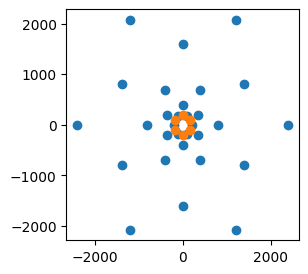

In [30]:
df =pd.DataFrame(bss_loc)
plt.figure(figsize=(3, 3))
plt.scatter(df[0],df[1])
df =pd.DataFrame(food_loc)
plt.scatter(df[0],df[1])
plt.show()

In [31]:
# 육각형 안에 있는지 판별
def discri(a):
    x=a[0]
    y=a[1]
    if (x>=0)&(y>=0): # 1사분면
        tf = (x/np.sqrt(3)+y<3000) & (x<3000)
    elif (x<0)&(y>0): # 2사분면
        tf = (-x/np.sqrt(3)+y<3000) & (x>-3000)
    elif (x<=0)&(y<=0): # 3사분면
        tf = (x>-3000) & (x/np.sqrt(3)+y>-3000)
    elif (x>0)&(y<0):
        tf = (-x/np.sqrt(3)+y>-3000) & (x<3000)
    return tf

# (x,y) 거리 구하기
def distance(x1,x2):
    return np.sqrt((x1[0]-x2[0])**2+(x1[1]-x2[1])**2)
def masking(state):
    mask = np.zeros(2)
    # 오링안나기
    if state[2] < 0.12:
        mask[1] = -100
    # 50퍼 전에는 배달만
    if state[2] > 0.5:
        mask[0] = -100
    return mask

In [32]:
#일 종료

def end_day():
    global bike_df,day, bike, battery, bss, terminal
    day_acc_dist = []
    day_order_count = []
    day_charge_count = []
    for i in range(len(bike)):
        bike[i].cur_time=0
        bike_df[i].loc[day,'acc_dist'] = bike[i].acc_dist
        bike[i].acc_dist = 0
        bike_df[i].loc[day,'order_count'] = bike[i].order_count
        bike[i].order_count = 0
        bike_df[i].loc[day,'charge_count'] = bike[i].charge_count
        bike[i].charge_count = 0
        bike_df[i].loc[day,'total_queue_time'] = 0
        bike_df[i].loc[day,'moving_queue_time'] = 0
        bike_df[i].loc[day,'stay_queue_time'] = 0
        bike_df[i].loc[day,'queue_count'] = 0
        bike[i].bss_list = []
#         bike[i].reward=0
        bike[i].history = [[bike[i].status, 0, bike[i].loc, 0, bike[i].bat, 0, 0]]
        if len(bike[i].order_list)<2:
            bike[i].order_list = [[0,[0,0], [0,0], [0,0]],[0,[0,0], [0,0], [0,0]]]
        else:
            bike[i].order_list = [bike[i].order_list[-2],bike[i].order_list[-1]]
    idx = np.arange(0,len(bike))
    random.shuffle(idx)
    j=0
    for i in idx:
        bike[i].order_freq = freq[int(j)]
        j = j + len(freq)/len(bike)
    del idx    
#     soc_list=[]
    for i in range(len(battery)):
        battery[i].time=0
        if len(battery[i].bat_history)>0:
#             #[self.status, time,self.soc, self.bik, self.charge_count]
#             soc_list.append(battery[i].bat_history)
            battery[i].bat_history=[[0,0,0,0,0],battery[i].bat_history[-1]]
            battery[i].bat_history[-1][1] = 0
        battery[i].charge_count=0
#     soc_df.append(soc_list)  

        
    for i in range(len(bss)):
        if len(bss[i].bss_history)!=0:
            for j in range(len(bss[i].bss_history)):
                if (bss[i].bss_history[j][2] - bss[i].bss_history[j][1])>0:
                    
                    bike_df[bss[i].bss_history[j][0]].loc[day,'queue_count'] += 1
#                     bike_df[bss[i].bss_history[j][0]].loc[day,'queue_time'] += bss[i].bss_history[j][2] - bss[i].bss_history[j][1]
    min_his_list=[]
    for i in range(len(bss)):
#         if terminal ==False:
        if len(bss[i].queue)>0:
            for j in range(len(bss[i].queue)):
                if (bss[i].queue[j][0]<43200)&(bss[i].queue[j][0]<time):
                    bike_df[bss[i].queue[j][1]].loc[day,'charge_count'] += 1
                    bike_df[bss[i].queue[j][1]].loc[day,'queue_count'] += 1
#                     bike_df[bss[i].queue[j][1]].loc[day,'queue_time'] += time - bss[i].queue[j][0]
                    arrived_time = bss[i].queue[j][0]
                    if int((time+60)/3600) == int(arrived_time/3600):
                        if arrived_time < 43200:
                            bike[bss[i].queue[j][1]].reward = bike[bss[i].queue[j][1]].reward - ((time - arrived_time)+60)*base_freq[int((time+60)/3600)]
                        else:
                            bike[bss[i].queue[j][1]].reward = delivery_reward
                    else:
                        if time+60 <= 43200:
                            bike[bss[i].queue[j][1]].reward = bike[bss[i].queue[j][1]].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)] - (time - int((time+60)/3600)*3600)*base_freq[int((time+60)/3600)]
                        else:
                            bike[bss[i].queue[j][1]].reward = bike[bss[i].queue[j][1]].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)-1] - (time - int((time+60)/3600)*3600)*base_freq[-1] 



                    bike[bss[i].queue[j][1]].stay_queue_time += time - bss[i].queue[j][0]

#                     cur_state=[]
#                     cur_state.append(0)
#                     cur_state.append(bike[bss[i].queue[j][1]].loc[0]/3000)
#                     cur_state.append(bike[bss[i].queue[j][1]].loc[1]/3000)
#                     cur_state.append(100/100)
#                     for k in range(len(bss)):
#                         cur_state.append(0)
#                     for k in range(len(bss)):
#                         for l in range(2,8,2):
#                             battery[bss[k].slot[l]].bat_charge()
#                             cur_state.append(100/100)
                    aa=False
                    if time> 43200:
                        aa = True
                    if time<43200:
                        if time - bss[i].queue[j][0] >3600:

                            aa = True
                            print('so long waited in ',bss[i].key)
                            print('day start to termianl : %.1f'%time)
                    else:
                        if 43200 - bss[i].queue[j][0] >3600:

                            aa = True
                            print('so long waited in ',bss[i].key)
                            print('day start to termianl : %.1f'%time)
                    if aa ==True:
                        update_memory(bike[bss[i].queue[j][1]].cur_state,bike[bss[i].queue[j][1]].action, bike[bss[i].queue[j][1]].reward, bike[bss[i].queue[j][1]].fu_state,50000)

                        model_fit()


                ##################################################################################
                    abc = battery[bike[bss[i].queue[j][1]].bat[0]].so
                    battery[bike[bss[i].queue[j][1]].bat[0]].so = battery[bike[bss[i].queue[j][1]].bat[0]].max_charge
                    battery[bike[bss[i].queue[j][1]].bat[0]].soc = 100

                    battery[bike[bss[i].queue[j][1]].bat[0]].bat_acc += battery[bike[bss[i].queue[j][1]].bat[0]].so-abc
                    battery[bike[bss[i].queue[j][1]].bat[0]].cycle= battery[bike[bss[i].queue[j][1]].bat[0]].bat_acc/100
#                     battery[bss[i].slot[k]].max_charge=100-(cycle_loss*battery[bss[i].slot[k]].cycle)
                    battery[bike[bss[i].queue[j][1]].bat[0]].bat_history=[[0,0,0,0,0],[battery[bike[bss[i].queue[j][1]].bat[0]].status, 0, battery[bike[bss[i].queue[j][1]].bat[0]].soc, battery[bike[bss[i].queue[j][1]].bat[0]].bik, battery[bike[bss[i].queue[j][1]].bat[0]].charge_count]]

                    abc = battery[bike[bss[i].queue[j][1]].bat[1]].so
                    battery[bike[bss[i].queue[j][1]].bat[1]].so = battery[bike[bss[i].queue[j][1]].bat[1]].max_charge
                    battery[bike[bss[i].queue[j][1]].bat[1]].soc = 100

                    battery[bike[bss[i].queue[j][1]].bat[1]].bat_acc += battery[bike[bss[i].queue[j][1]].bat[1]].so-abc
                    battery[bike[bss[i].queue[j][1]].bat[1]].cycle= battery[bike[bss[i].queue[j][1]].bat[1]].bat_acc/100
#                     battery[bss[i].slot[k]].max_charge=100-(cycle_loss*battery[bss[i].slot[k]].cycle)
                    battery[bike[bss[i].queue[j][1]].bat[1]].bat_history=[[0,0,0,0,0],[battery[bike[bss[i].queue[j][1]].bat[1]].status, 0, battery[bike[bss[i].queue[j][1]].bat[1]].soc, battery[bike[bss[i].queue[j][1]].bat[1]].bik, battery[bike[bss[i].queue[j][1]].bat[1]].charge_count]]
                ###############################################
        
    
        bss[i].bss_history = []
        min_his_list.append(bss[i].min_his)
        bss[i].min_his = []
    min_his_df.append(min_his_list)
    for i in range(len(bss)):
        bss[i].queue = []
    for i in range(len(bike)):
        bike_df[i].loc[day,'stay_queue_time'] = bike[i].stay_queue_time
        bike_df[i].loc[day,'moving_queue_time'] = bike[i].moving_queue_time
        bike_df[i].loc[day,'total_queue_time'] = bike[i].stay_queue_time + bike[i].moving_queue_time
        bike[i].stay_queue_time = 0
        bike[i].moving_queue_time = 0
    
    for i in range(len(bss)):
        for j in range(6):
            k = j+2
            abc = battery[bss[i].slot[k]].so
            
            battery[bss[i].slot[k]].so = battery[bss[i].slot[k]].max_charge
            battery[bss[i].slot[k]].soc = 100

            battery[bss[i].slot[k]].bat_acc += battery[bss[i].slot[k]].so-abc
            battery[bss[i].slot[k]].cycle= battery[bss[i].slot[k]].bat_acc/100
#             battery[bss[i].slot[k]].max_charge=100-(cycle_loss*battery[bss[i].slot[k]].cycle)
            battery[bss[i].slot[k]].bat_history=[[0,0,0,0,0],[battery[bss[i].slot[k]].status, 0, battery[bss[i].slot[k]].soc, battery[bss[i].slot[k]].bik, battery[bss[i].slot[k]].charge_count]]
            
def end_bike_n():

    # 바이크 90대 생성, 주문건수 할당

    #객체 90대 생성
    global bike
    bike = {}
    for i in range(int(bike_n)):
        bike[i] = Bike()
        bike[i].key = i
        bike[i].loc = (4000*random.random()-2000,4000*random.random()-2000)
#         bike[i].sooneung = sooneung_avg

    #base_freq, day_avg 따라 발생빈도 할당
    global freq
    freq = []
    for i in range(len(day_avg)):
        tmp = []
        for j in range(len(base_freq)):
            tmp.append(base_freq[j]*day_avg[i]/sum(base_freq))
        freq.append(copy.deepcopy(tmp))

    idx = np.arange(0,len(bike))
    random.shuffle(idx)
    j=0
    for i in idx:
        bike[i].order_freq = freq[int(j)]
        j = j + len(freq)/len(bike)

        bike[i].bat=[i*2,i*2+1]

    
    for i in range(len(bike)):
        if i / len(bike)<0.1:
            bike[i].charge_rule = char_rule[0]
        elif i/len(bike)<0.25:
            bike[i].charge_rule = char_rule[1]
        elif i/len(bike)<0.5:
            bike[i].charge_rule = char_rule[2]
        elif i/len(bike)<0.85:
            bike[i].charge_rule = char_rule[3]
        else:
            bike[i].charge_rule = char_rule[4]
       


    global battery
    battery = {}
    for i in range(int(bike_n)*2+bss_n*6):
        battery[i]=Battery()
        battery[i].key=i
    for i in range(len(bike)):
        battery[i*2].bik = i
        battery[i*2+1].bik = i
        
    if popul%10 ==0:
        for i in range(int(bike_n)):
            tmp = 100*random.random()+10
            if tmp >100:
                tmp = 100
    #         tmp = (popul%10)*10+10
            battery[i*2].so = tmp
            battery[i*2+1].so = tmp
            battery[i*2].soc = tmp
            battery[i*2+1].soc = tmp
    else:
        for i in range(20):
            battery[i*2].so = 10
            battery[i*2+1].so = 10
            battery[i*2].soc = 10
            battery[i*2+1].soc = 10
        for i in range(20,40):
            battery[i*2].so = 20
            battery[i*2+1].so = 20
            battery[i*2].soc = 20
            battery[i*2+1].soc = 20
        for i in range(40,60):
            battery[i*2].so = 30
            battery[i*2+1].so = 30
            battery[i*2].soc = 30
            battery[i*2+1].soc = 30
    
    #충전소 생성, 위치할당
    global bss
    bss = {}
    for i in range(bss_n):
        bss[i] = Bss()
        bss[i].key = i
        bss[i].slot[2] = i*6 + (2*len(bike))
        bss[i].slot[3] = i*6+1+ (2*len(bike))
        bss[i].slot[4] = i*6+2+ (2*len(bike))
        bss[i].slot[5] = i*6+3+ (2*len(bike))
        bss[i].slot[6] = i*6+4+ (2*len(bike))
        bss[i].slot[7] = i*6+5+ (2*len(bike))
        bss[i].loc = bss_loc[i]  

## 처음 돌리기

In [33]:
with tf.device('/device:CPU:0'):
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(2)])],[np.array([np.append(np.zeros(1),0)])])
    model2.set_weights(model.get_weights())

In [34]:
event_list=[]
state = []
fubike_idx=0
D_memory=[]
# D_terminal=[]

In [35]:
# from keras.models import load_model

# model.load_weights('best_model(210)(w).h5')
# model2.set_weights(model.get_weights())

with open('initial_states.pickle', 'rb') as f:
    initial_states = pickle.load(f)

# with open('D_memory(210).pickle', 'rb') as f:
#     D_memory = pickle.load(f)

# tmp1=[]
# tmp2=[]
# tmp3=[]
# temp=[]
# delt=[]
# for i in range(len(D_memory)):
#     train = D_memory[i]
    
#     tmp1.append(train[0][0:34])
#     tmp2.append(train[0][34:154])
#     tmp3.append(train[0][154:254])


#     tmp=[]
#     tmp.append(np.array([train[3][0:34]]))
#     tmp.append(np.array([train[3][34:154]]))
#     tmp.append(np.array([train[3][154:254]]))



#     predicted1 = model2.predict_on_batch(tmp)[0][np.argmax(model.predict_on_batch(tmp).copy())]

#     tmp_max = qrate*predicted1

#     tmp=np.zeros(31)
#     tmp[train[1]]=1.0

#     temp.append(tmp)
#     delt.append(train[2] + tmp_max*(1-train[4]))



#     tmp=[]
#     tmp.append(np.array([train[0][0:34]]))
#     tmp.append(np.array([train[0][34:154]]))
#     tmp.append(np.array([train[0][154:254]]))

                
#     TD_error_list = np.append(TD_error_list,np.abs(delt[-1]-model.predict_on_batch(tmp)[0][train[1]])+TD_max/D_size)

# TD_index = np.arange(0,len(TD_error_list))

# TD_max = np.max(TD_error_list[:int(len(TD_error_list))])
# max_w_i = (len(D_memory)*TD_max/np.sum(TD_error_list))**(-beta)


# # with open('D_terminal.pickle', 'rb') as f:
# #     D_terminal = pickle.load(f)

In [36]:
model2.set_weights(model.get_weights())


episode 0
day : 0


2024-07-18 17:02:04.886166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  9
day start to termianl : 14245.2

 time for simulate one day : 1733.6
so long waited in  7
day start to termianl : 14245.2
so long waited in  11
day start to termianl : 14245.2
so long waited in  13
day start to termianl : 14245.2
so long waited in  17
day start to termianl : 14245.2
so long waited in  19
day start to termianl : 14245.2
so long waited in  22
day start to termianl : 14245.2
so long waited in  22
day start to termianl : 14245.2
so long waited in  22
day start to termianl : 14245.2
so long waited in  23
day start to termianl : 14245.2
so long waited in  26
day start to termianl : 14245.2
so long waited in  27
day start to termianl : 14245.2
so long waited in  27
day start to termianl : 14245.2
so long waited in  28
day start to termianl : 14245.2
so long waited in  29
day start to termianl : 14245.2

average moving queuetime :  94.9 63.6
average stay queuetime :  897.3 601.2
average total queuetime :  992.2 664.8
average chargecount :  0.7 0.7
average 

2024-07-18 17:37:06.311071: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 17:39:00.775982: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


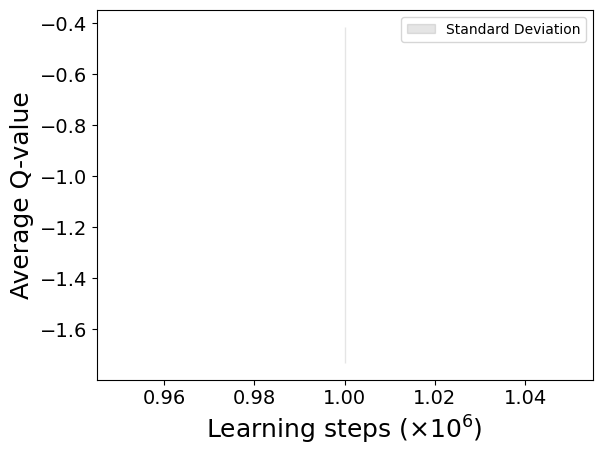

model updated

 time for simulate one day : 6632.4

average moving queuetime :  61.3 104.6
average stay queuetime :  82.0 140.0
average total queuetime :  143.3 244.6
average chargecount :  1.7 1.7
average ordercount :  42.1 42.1
day : 1


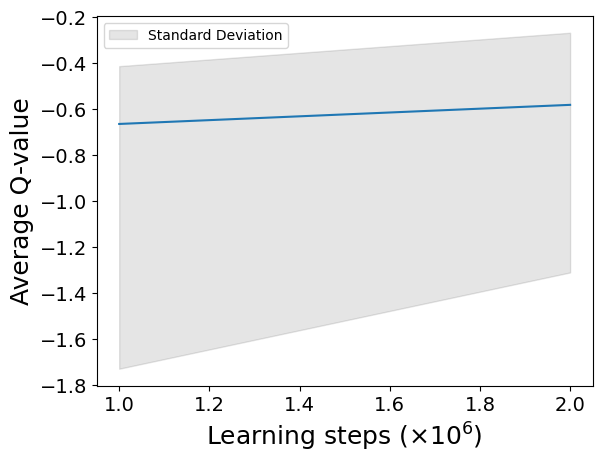

model updated


2024-07-18 19:37:43.473584: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 19:53:16.544040: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 19:59:35.330650: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:12:47.544945: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:30:17.488973: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:31:03.331370: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:39:20.861212: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:40:02.577375: W tensorflow/core/data/root_dataset.cc:24

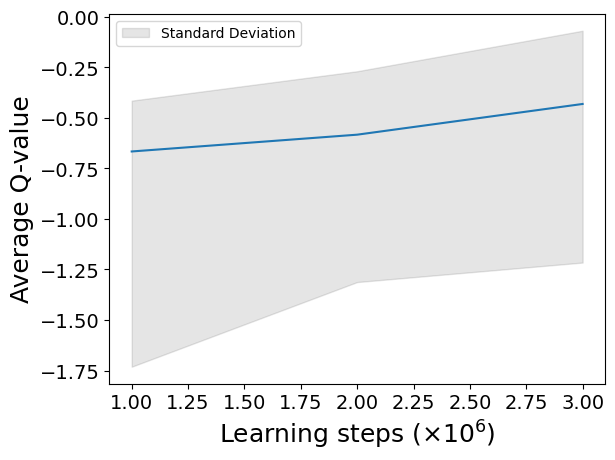

model updated

 time for simulate one day : 6107.0

average moving queuetime :  68.7 144.0
average stay queuetime :  276.3 860.1
average total queuetime :  344.9 1004.1
average chargecount :  1.8 1.9
average ordercount :  41.6 41.2
day : 2


2024-07-18 21:11:29.213702: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 21:47:05.205690: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 21:47:54.651149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 21:50:19.341229: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:06:40.437736: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:17:47.654359: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:25:16.834149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


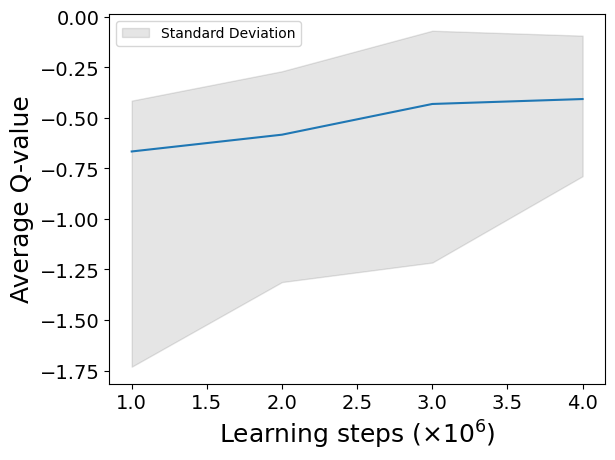

model updated


2024-07-18 22:48:56.180821: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:54:11.257801: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7212.0

average moving queuetime :  70.7 148.9
average stay queuetime :  211.7 190.8
average total queuetime :  282.3 339.8
average chargecount :  1.9 2.0
average ordercount :  41.8 42.0
[59, 1, 2, 63, 63, 46, 24, 59, 48, 73, 50, 24]
[39, 63, 51, 44, 44, 27, 41, 47, 57, 96, 52, 13]
[51, 73, 45, 50, 70, 19, 65, 30, 51, 75, 49, 24]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.362484210337454
code start to now : 21707.6
episode_reward :  311.7476948243343
fit_count :  44396
TD max = 1.7106419039726257 TD min = 0.00010020861625671387
best model updated

episode 2
day : 0


2024-07-18 23:23:00.800815: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:24:38.601362: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:26:49.420063: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:39:04.401086: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


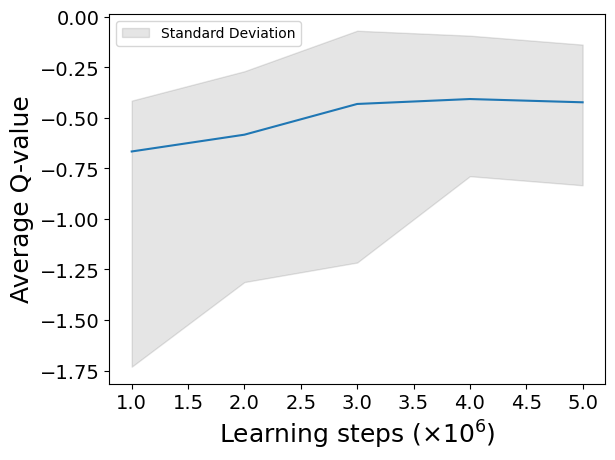

model updated


2024-07-19 00:00:38.209236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:09:46.111195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:13:18.858331: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:20:46.758020: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:21:46.817911: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:22:30.021216: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:31:10.397656: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:36:55.080889: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6053.4

average moving queuetime :  92.2 152.4
average stay queuetime :  467.4 772.7
average total queuetime :  559.5 925.1
average chargecount :  1.7 1.7
average ordercount :  41.4 41.4
day : 1


2024-07-19 00:52:59.841207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:54:58.797538: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


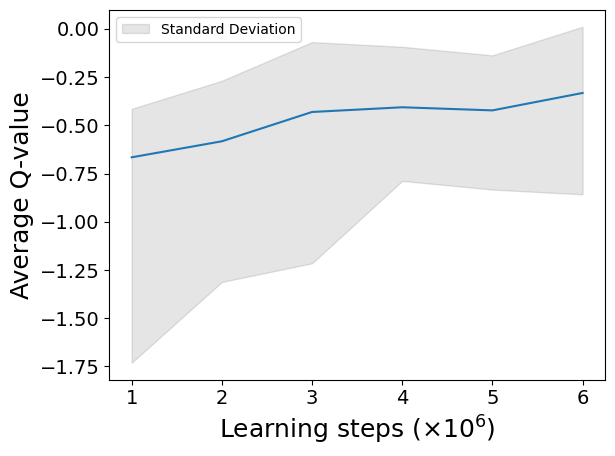

model updated


2024-07-19 01:18:33.812130: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 01:27:31.782444: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 01:43:22.753319: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 01:52:07.967745: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


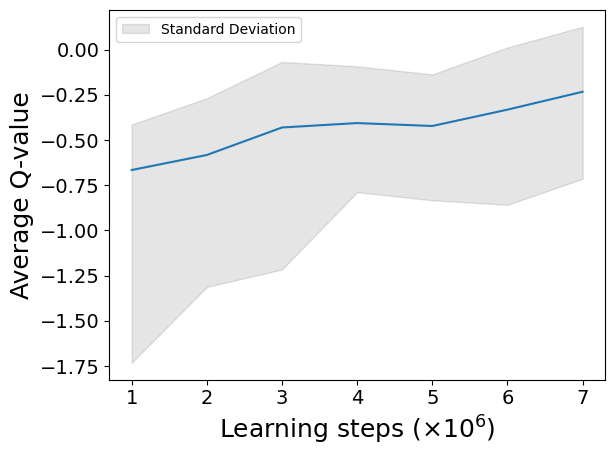

model updated

 time for simulate one day : 6120.3

average moving queuetime :  77.0 127.7
average stay queuetime :  266.3 195.9
average total queuetime :  343.3 323.6
average chargecount :  1.8 2.0
average ordercount :  41.6 41.9
day : 2


2024-07-19 02:46:34.641558: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 02:51:32.539789: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 03:05:22.886978: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 03:09:00.370220: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 03:17:13.988282: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 03:24:00.839820: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


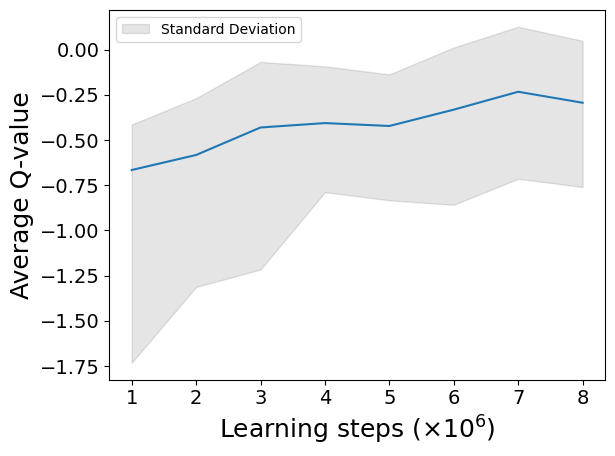

model updated


2024-07-19 03:53:09.175876: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6174.8

average moving queuetime :  71.0 123.3
average stay queuetime :  170.7 1.2
average total queuetime :  241.8 124.5
average chargecount :  1.9 2.0
average ordercount :  41.8 42.2
[26, 31, 7, 67, 40, 20, 23, 64, 64, 91, 39, 24]
[40, 68, 53, 38, 68, 33, 35, 53, 59, 65, 57, 26]
[49, 57, 54, 62, 59, 56, 20, 64, 50, 62, 52, 28]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.360081477243125
code start to now : 40069.3
episode_reward :  367.9487329233216
fit_count :  84617
TD max = 2.1742680526733404 TD min = 0.00010008821487429423
best model updated

episode 3
day : 0


2024-07-19 04:25:55.966204: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:33:49.271158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:38:14.232206: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:41:21.087999: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


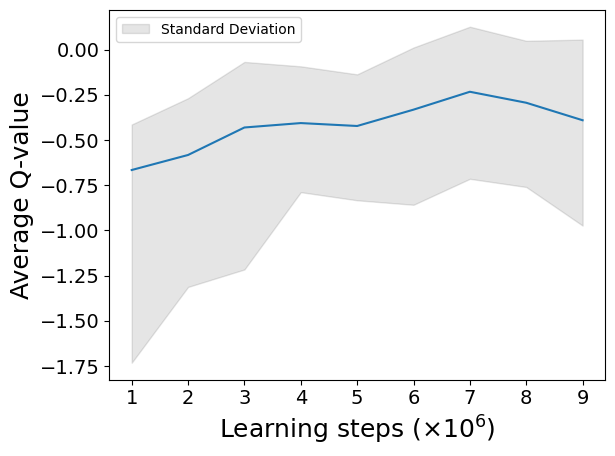

model updated


2024-07-19 04:55:38.291252: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:55:59.381213: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:05:31.553250: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:15:48.181350: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:16:02.219068: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:19:08.101939: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:27:58.659690: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 05:30:43.770381: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 5987.2

average moving queuetime :  81.4 136.7
average stay queuetime :  593.6 997.3
average total queuetime :  675.0 1134.0
average chargecount :  1.7 1.7
average ordercount :  41.1 41.1
day : 1


2024-07-19 05:58:51.305630: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


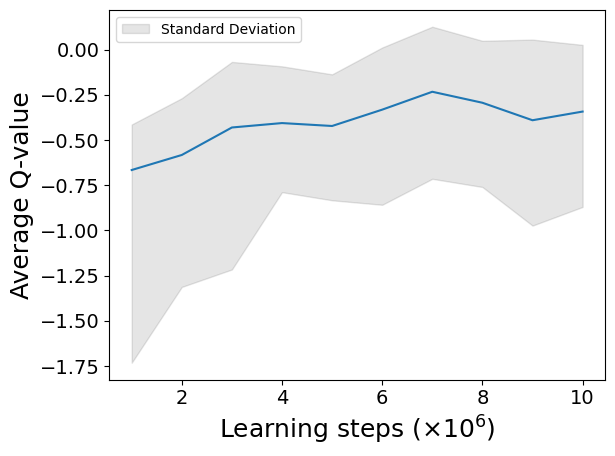

model updated


2024-07-19 06:22:22.104647: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 06:35:32.961606: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 06:36:31.746993: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 06:39:21.436255: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 07:08:39.617985: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 07:09:38.119849: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 07:11:18.504180: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


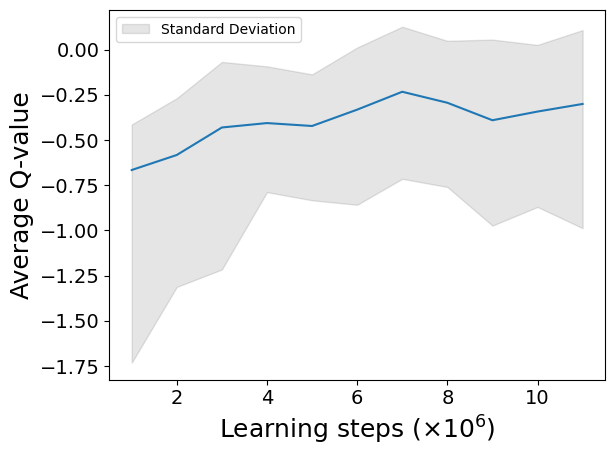

model updated


2024-07-19 07:23:06.268123: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6095.9

average moving queuetime :  73.3 133.4
average stay queuetime :  290.2 72.4
average total queuetime :  363.4 205.8
average chargecount :  1.8 2.0
average ordercount :  41.5 41.9
day : 2


2024-07-19 07:29:02.961179: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 07:54:34.944862: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 07:55:31.231810: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 08:30:00.271513: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


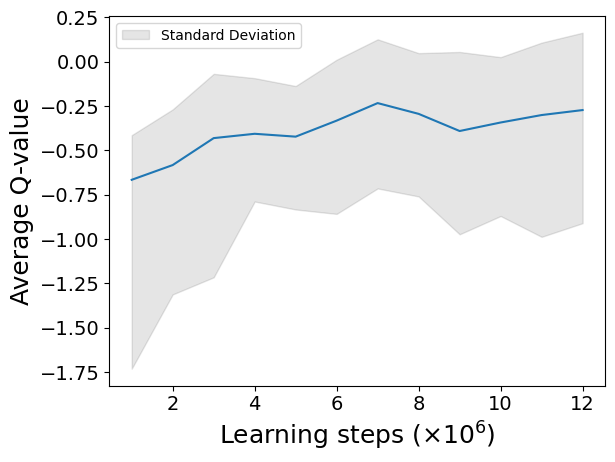

model updated


2024-07-19 08:34:14.188373: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 08:44:50.801151: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6253.2

average moving queuetime :  72.8 140.5
average stay queuetime :  229.1 223.1
average total queuetime :  301.9 363.6
average chargecount :  1.9 2.0
average ordercount :  41.6 41.8
[39, 13, 15, 65, 60, 28, 32, 34, 64, 98, 45, 11]
[70, 27, 59, 45, 48, 53, 41, 46, 62, 68, 59, 24]
[41, 50, 57, 71, 37, 37, 54, 44, 69, 73, 35, 19]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.331885123577005
code start to now : 58419.1
episode_reward :  223.18539239529875
fit_count :  124636
TD max = 2.1742680526733404 TD min = 0.00010008821487429423

episode 4
day : 0


2024-07-19 09:30:39.574258: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


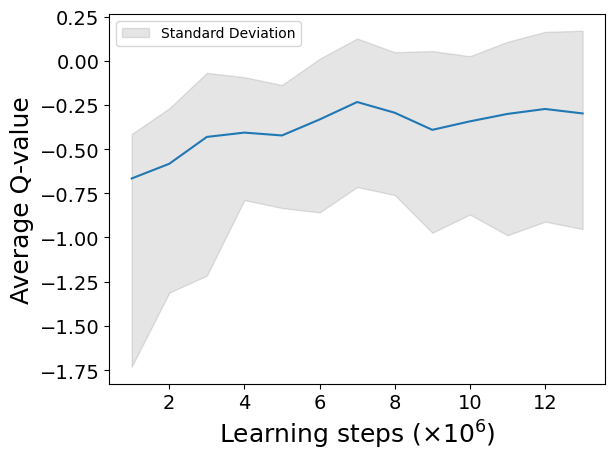

model updated


2024-07-19 09:54:51.781710: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:22:20.814193: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:30:36.122984: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:45:37.769767: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:51:55.211309: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6358.7

average moving queuetime :  66.3 114.5
average stay queuetime :  136.3 235.4
average total queuetime :  202.6 349.9
average chargecount :  1.7 1.7
average ordercount :  41.9 41.9
day : 1


2024-07-19 10:54:24.005614: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:58:26.217381: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 11:09:59.079273: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


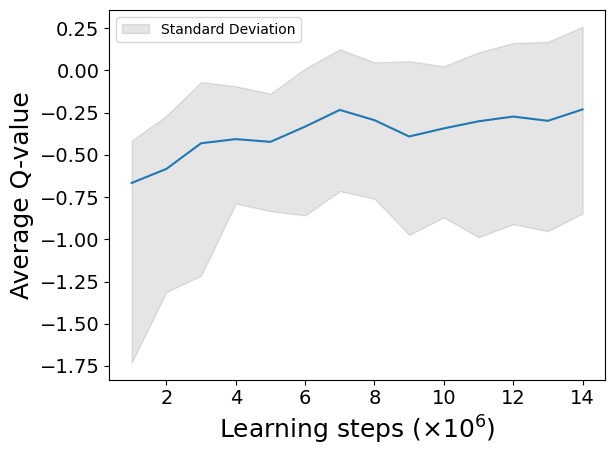

model updated


2024-07-19 11:19:44.281129: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 11:26:08.916998: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 11:35:52.489025: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 11:38:50.663828: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 11:49:07.221238: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 12:12:21.992864: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 12:21:45.090414: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 12:22:51.970048: W tensorflow/core/data/root_dataset.cc:24

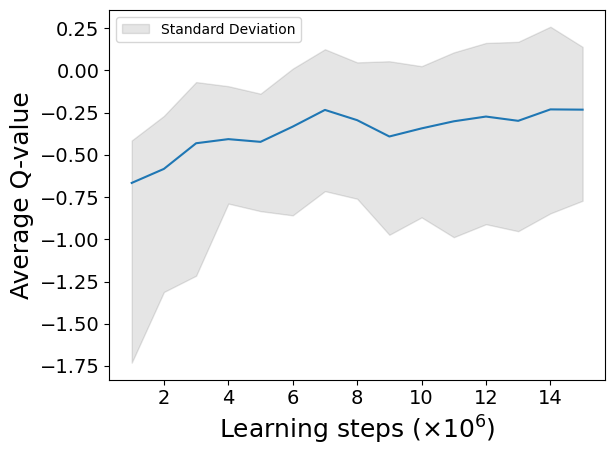

model updated

 time for simulate one day : 6299.5

average moving queuetime :  70.6 142.1
average stay queuetime :  128.5 231.4
average total queuetime :  199.1 373.5
average chargecount :  1.8 1.9
average ordercount :  42.0 42.0
day : 2


2024-07-19 12:59:51.208721: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:07:04.117713: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:12:18.714038: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:14:48.671247: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:20:51.507828: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:28:00.976373: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


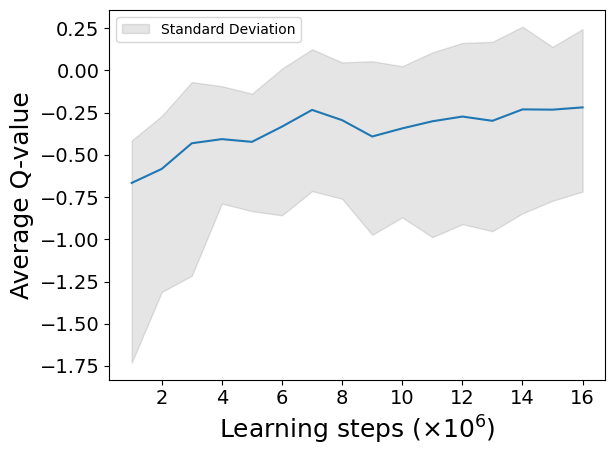

model updated


2024-07-19 13:48:20.937347: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:51:51.541163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 14:03:27.352166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 14:08:04.832489: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 14:13:12.754504: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6196.5

average moving queuetime :  70.2 136.3
average stay queuetime :  107.2 133.4
average total queuetime :  177.4 269.7
average chargecount :  1.9 2.0
average ordercount :  42.0 42.0
[37, 18, 13, 55, 59, 41, 37, 58, 38, 81, 50, 31]
[39, 40, 68, 49, 55, 47, 25, 48, 47, 74, 57, 23]
[50, 58, 43, 56, 42, 58, 35, 40, 64, 61, 60, 22]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.3556822522501815
code start to now : 77286.9
episode_reward :  463.1008972964046
fit_count :  164953
TD max = 2.064024231529236 TD min = 0.00010008821487429423
best model updated

episode 5
day : 0


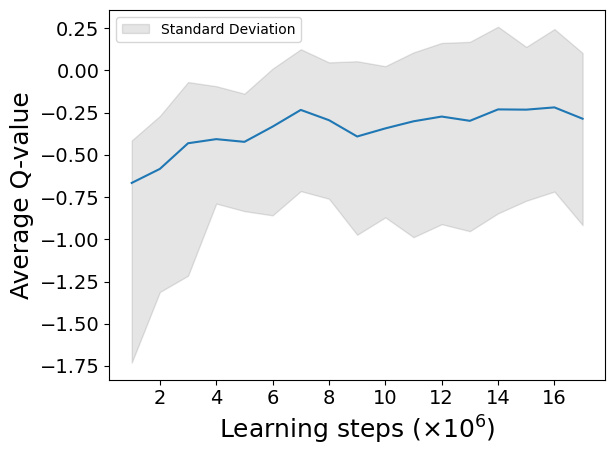

model updated


2024-07-19 15:03:47.311160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 15:33:48.216113: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 15:36:36.403788: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 15:37:54.701123: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6105.9

average moving queuetime :  72.7 120.1
average stay queuetime :  379.5 627.4
average total queuetime :  452.1 747.5
average chargecount :  1.7 1.7
average ordercount :  41.6 41.6
day : 1


2024-07-19 16:11:34.418768: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 16:16:23.541117: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


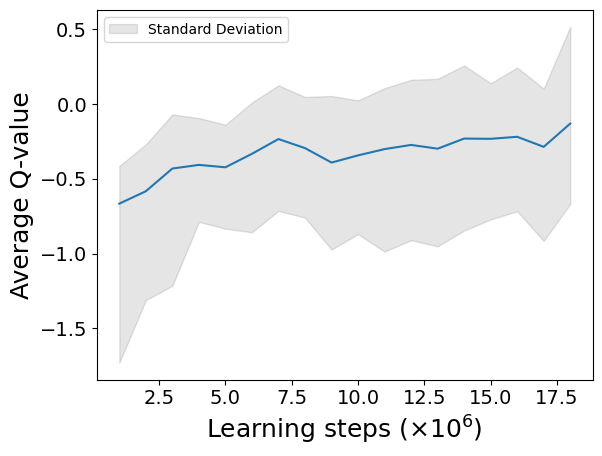

model updated


2024-07-19 16:20:52.245207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 16:36:07.091217: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 16:42:13.090659: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 16:46:33.245654: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 16:52:32.131166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 17:03:31.051223: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 17:36:22.244054: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


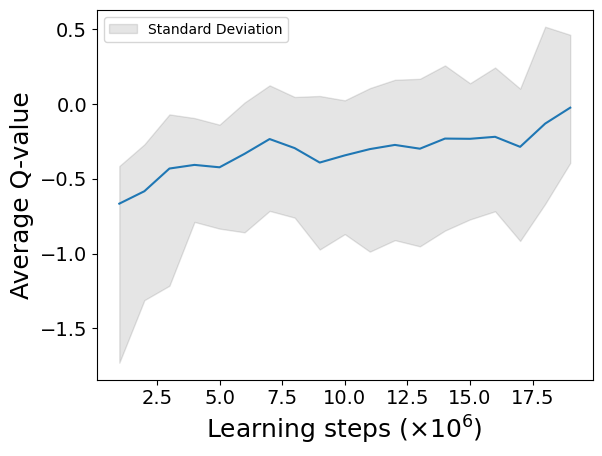

model updated


2024-07-19 17:38:44.231179: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6307.1

average moving queuetime :  70.7 132.0
average stay queuetime :  260.7 302.3
average total queuetime :  331.4 434.3
average chargecount :  1.8 1.9
average ordercount :  41.7 41.8
day : 2


2024-07-19 17:51:03.755296: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:07:13.032223: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:13:44.230923: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:15:39.224060: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:26:03.228006: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


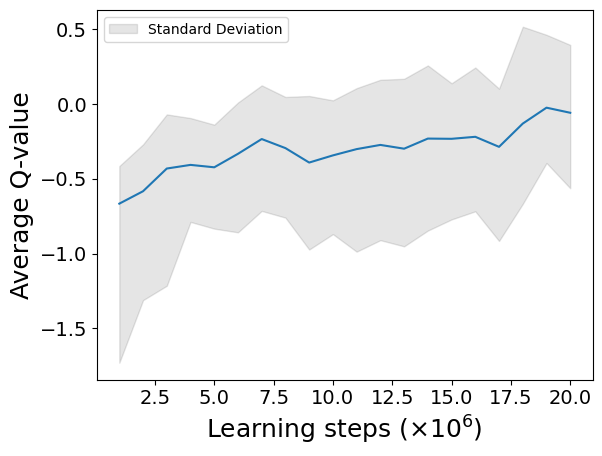

model updated


2024-07-19 19:07:28.830814: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:12:27.190821: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:15:25.203953: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:28:45.201144: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:31:45.186348: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:33:22.420624: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6556.5

average moving queuetime :  70.6 136.8
average stay queuetime :  187.4 102.8
average total queuetime :  258.0 239.6
average chargecount :  1.8 1.9
average ordercount :  41.9 42.4
[25, 26, 11, 30, 49, 55, 38, 48, 44, 90, 53, 27]
[60, 33, 45, 46, 58, 40, 56, 37, 36, 78, 56, 29]
[63, 40, 30, 57, 39, 62, 43, 44, 58, 69, 49, 29]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.386978788123662
code start to now : 96269.8
episode_reward :  391.65005399702744
fit_count :  205207
TD max = 1.8577667165756229 TD min = 0.000100973939895621

episode 6
day : 0


2024-07-19 19:42:15.199562: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:51:22.269700: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:57:30.421366: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 20:08:20.111182: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


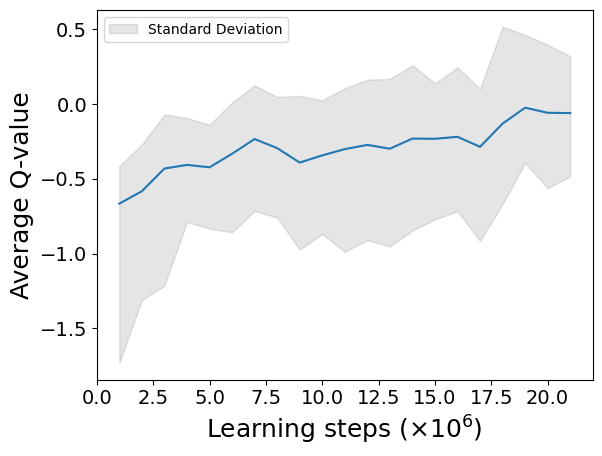

model updated


2024-07-19 20:33:40.221117: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 20:40:11.118266: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 20:41:28.990919: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 20:46:20.687462: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 21:10:33.938662: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6183.0

average moving queuetime :  72.0 114.9
average stay queuetime :  139.3 222.4
average total queuetime :  211.2 337.3
average chargecount :  1.6 1.6
average ordercount :  41.7 41.7
day : 1


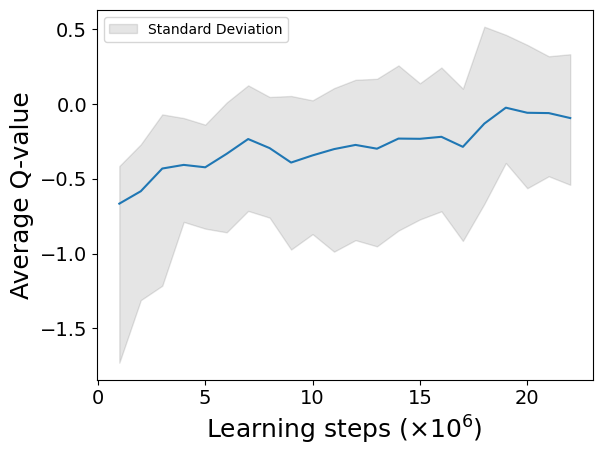

model updated


2024-07-19 21:48:41.747521: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:03:54.581600: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:36:31.709127: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:52:25.356373: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


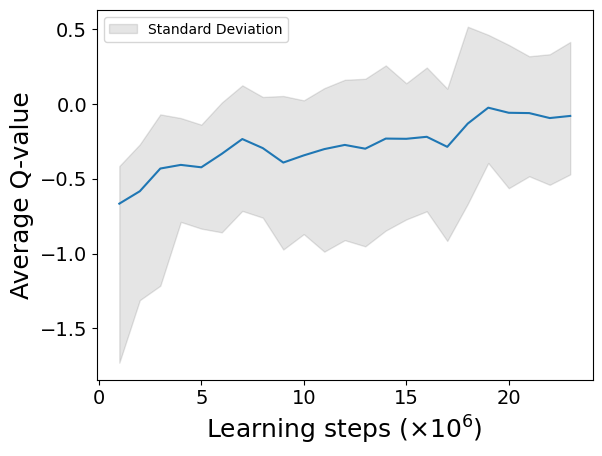

model updated

 time for simulate one day : 6277.3

average moving queuetime :  71.6 134.8
average stay queuetime :  100.3 127.5
average total queuetime :  172.0 262.3
average chargecount :  1.7 1.9
average ordercount :  41.9 42.1
day : 2


2024-07-19 23:13:38.130592: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:21:43.031243: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


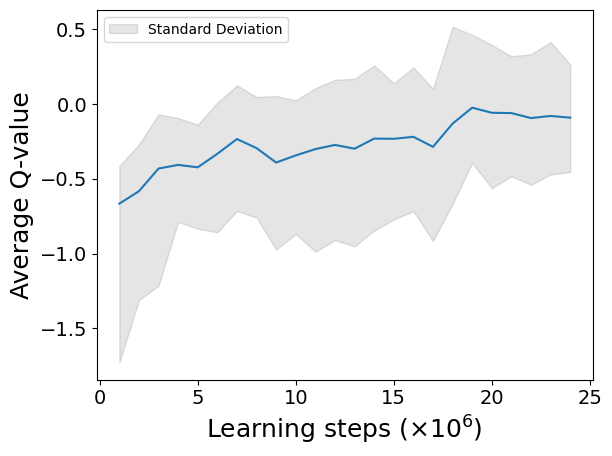

model updated


2024-07-20 00:27:22.227466: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 00:34:44.839864: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6396.6

average moving queuetime :  67.5 113.1
average stay queuetime :  65.4 1.7
average total queuetime :  132.9 114.8
average chargecount :  1.8 1.9
average ordercount :  42.0 42.3
[28, 27, 7, 38, 34, 68, 25, 51, 50, 74, 50, 27]
[43, 45, 46, 58, 47, 49, 38, 35, 60, 65, 54, 27]
[53, 48, 38, 56, 35, 40, 61, 53, 52, 50, 53, 28]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.353182585635768
code start to now : 115139.6
episode_reward :  541.1539715676458
fit_count :  245491
TD max = 2.021670134162903 TD min = 0.00010002175569535635
best model updated

episode 7
day : 0


2024-07-20 01:00:45.172084: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:16:00.141190: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


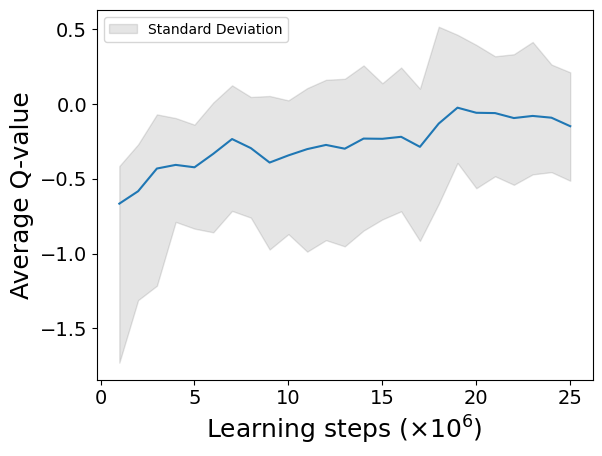

model updated


2024-07-20 01:30:10.021152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:30:11.496438: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:32:07.791359: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:45:51.160371: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:56:17.241184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:16:08.741360: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6248.0

average moving queuetime :  71.0 119.3
average stay queuetime :  319.7 537.2
average total queuetime :  390.8 656.5
average chargecount :  1.7 1.7
average ordercount :  41.9 41.9
day : 1


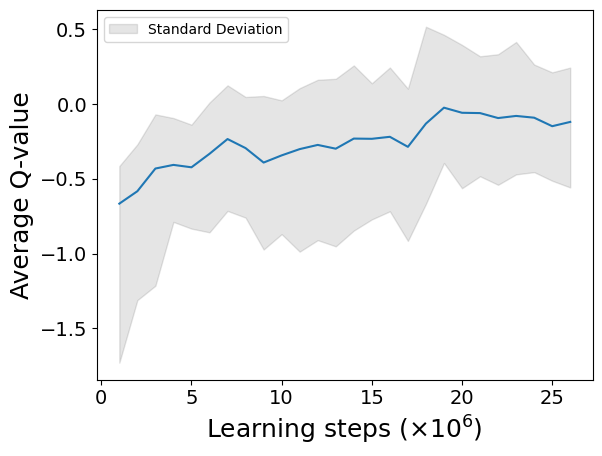

model updated


2024-07-20 02:51:56.920287: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:53:39.998475: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:56:28.331209: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:10:54.321159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:14:21.450457: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:14:34.337107: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:20:45.303767: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:26:03.731361: W tensorflow/core/data/root_dataset.cc:24

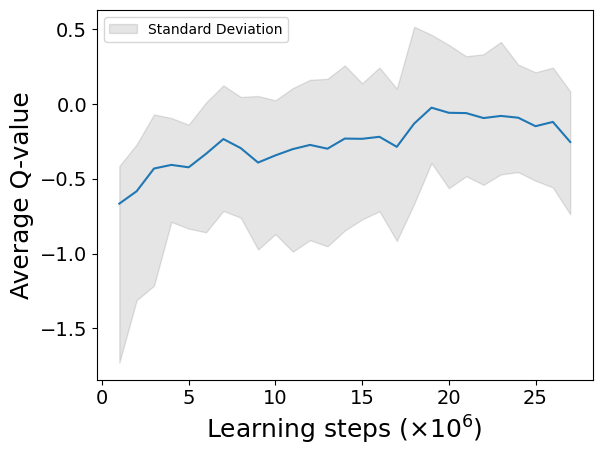

model updated


2024-07-20 04:14:30.501406: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:17:14.820493: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:17:43.856387: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6322.6

average moving queuetime :  72.0 133.2
average stay queuetime :  191.7 135.0
average total queuetime :  263.7 268.2
average chargecount :  1.8 1.8
average ordercount :  42.0 42.1
day : 2


2024-07-20 05:04:29.092356: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 05:16:27.999821: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 05:24:30.934361: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


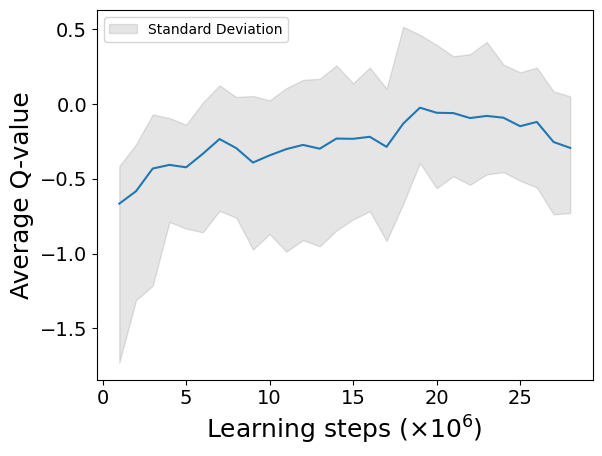

model updated


2024-07-20 05:27:31.784935: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6340.6

average moving queuetime :  67.8 112.2
average stay queuetime :  126.3 7.0
average total queuetime :  194.1 119.2
average chargecount :  1.8 1.9
average ordercount :  42.0 42.0
day : 3


2024-07-20 06:33:37.803204: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


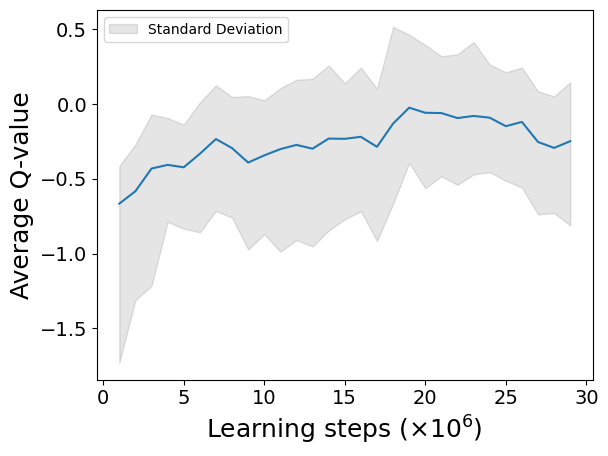

model updated


2024-07-20 07:10:34.332167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:14:10.404140: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:26:56.522988: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:36:29.708265: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:37:07.081462: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:41:05.073752: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:53:04.521142: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:53:21.419862: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6309.3

average moving queuetime :  65.6 112.9
average stay queuetime :  99.6 45.6
average total queuetime :  165.2 158.4
average chargecount :  1.8 1.9
average ordercount :  42.0 42.0
[34, 15, 11, 36, 68, 33, 64, 30, 39, 73, 77, 24]
[20, 53, 38, 54, 64, 39, 38, 37, 55, 67, 57, 26]
[36, 56, 47, 44, 40, 52, 60, 36, 48, 65, 53, 24]
[62, 37, 40, 57, 47, 48, 52, 25, 63, 66, 48, 25]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.822882089226386
code start to now : 140377.0
episode_reward :  707.6150043267559
fit_count :  299206
TD max = 2.021670134162903 TD min = 0.00010002175569535635
best model updated

episode 8
day : 0


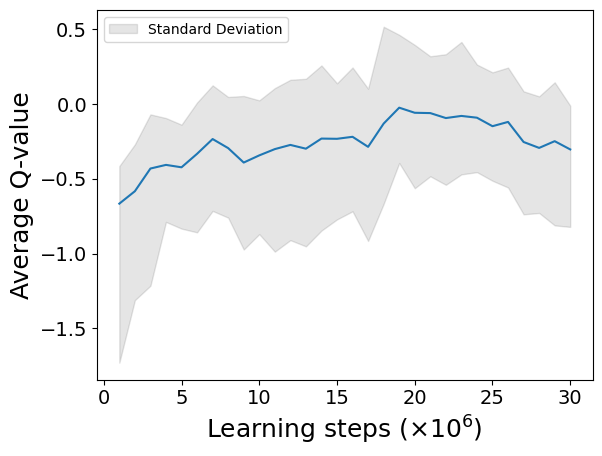

model updated


2024-07-20 08:19:16.638281: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 08:38:47.081474: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 08:44:51.297979: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 08:55:15.339639: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 08:55:53.786792: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 09:07:14.950572: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


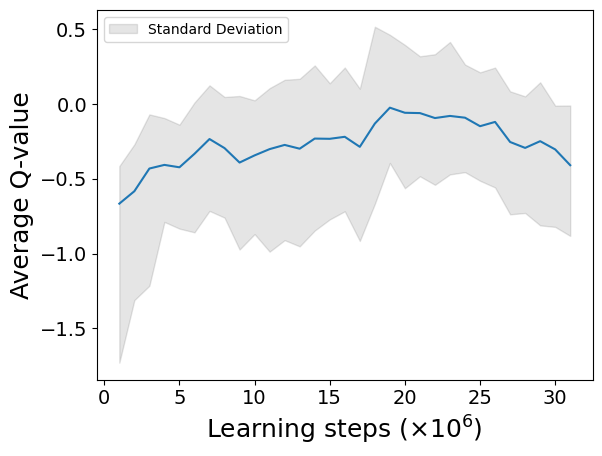

model updated

 time for simulate one day : 6287.5

average moving queuetime :  70.6 111.7
average stay queuetime :  168.0 266.0
average total queuetime :  238.6 377.8
average chargecount :  1.6 1.6
average ordercount :  41.9 41.9
day : 1


2024-07-20 09:54:45.953588: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 10:08:45.990386: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 10:20:06.705484: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 10:25:26.551230: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 10:33:04.378942: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


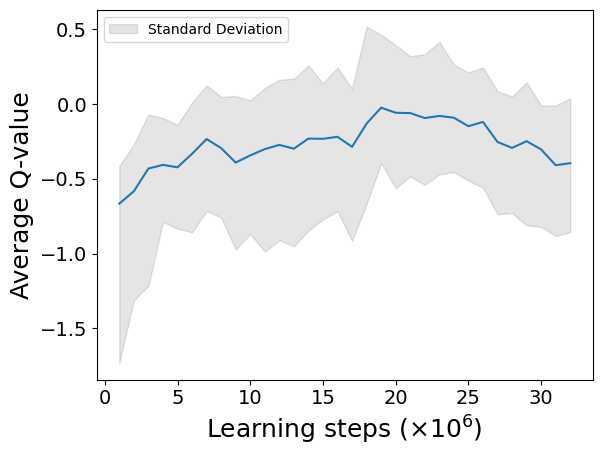

model updated


2024-07-20 10:48:18.829579: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 10:57:54.000061: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:03:02.521121: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:04:56.285280: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:08:59.712990: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:18:38.337568: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6332.9

average moving queuetime :  66.7 114.9
average stay queuetime :  91.8 45.8
average total queuetime :  158.6 160.8
average chargecount :  1.7 1.8
average ordercount :  42.0 42.0
day : 2


2024-07-20 11:45:29.528641: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


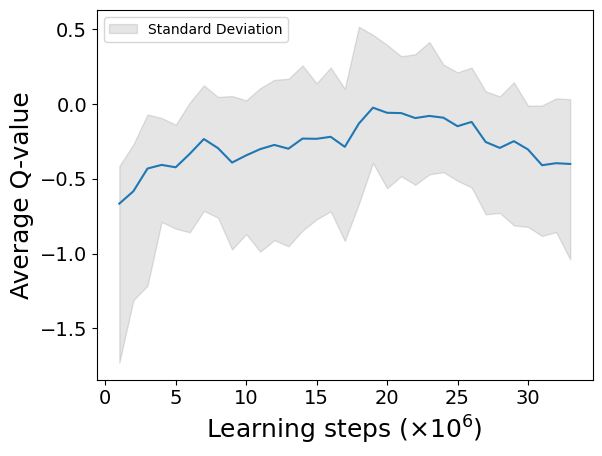

model updated


2024-07-20 12:02:34.759824: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:11:05.057091: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:14:20.011236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:31:56.798953: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:53:11.423215: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  6
day start to termianl : 40372.4

 time for simulate one day : 6117.3

average moving queuetime :  71.3 164.5
average stay queuetime :  248.2 1049.8
average total queuetime :  319.5 1214.4
average chargecount :  1.8 2.1
average ordercount :  41.4 40.1
[27, 23, 12, 20, 29, 61, 56, 39, 55, 71, 56, 26]
[34, 52, 36, 54, 44, 34, 54, 45, 54, 62, 56, 19]
[46, 47, 60, 42, 53, 40, 41, 36, 49, 86, 44, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.433001674842
code start to now : 159128.6
episode_reward :  133.80997146529722
fit_count :  338579
TD max = 2.0721485448837282 TD min = 0.00010010117888452066

episode 9
day : 0


2024-07-20 13:10:03.796023: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


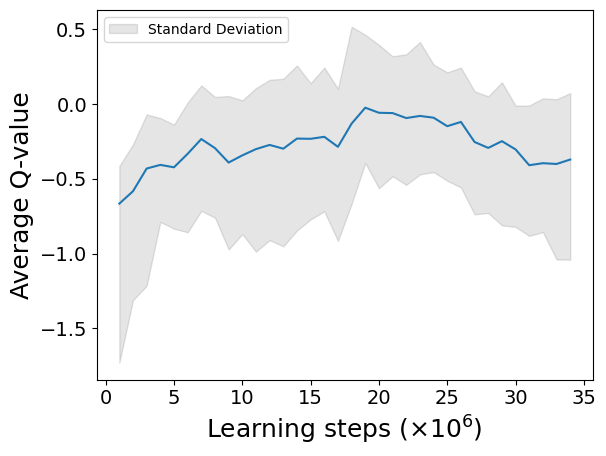

model updated


2024-07-20 13:28:48.580383: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:50:49.108769: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 14:07:03.339514: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 14:10:50.594832: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 14:12:57.488964: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 14:14:25.807313: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 14:32:21.248487: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 14:39:10.292669: W tensorflow/core/data/root_dataset.cc:24

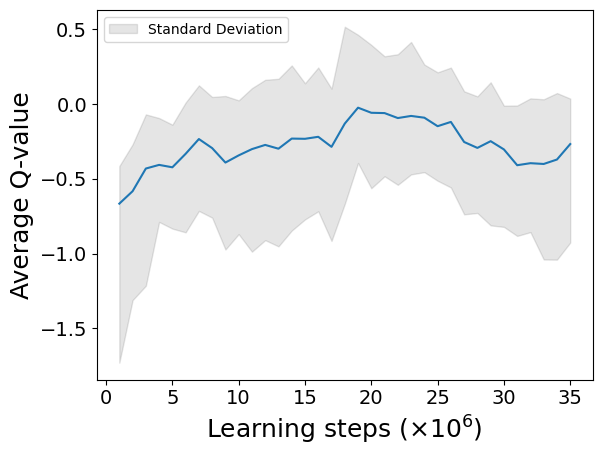

model updated


2024-07-20 14:40:10.641222: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  4
day start to termianl : 42374.4

 time for simulate one day : 6220.3

average moving queuetime :  78.6 127.1
average stay queuetime :  493.5 797.7
average total queuetime :  572.1 924.8
average chargecount :  1.6 1.6
average ordercount :  41.1 41.1
[26, 27, 8, 23, 71, 49, 34, 23, 61, 78, 61, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5037985711897934
code start to now : 165354.0
episode_reward :  -55.97527961615459
fit_count :  351544
TD max = 1.794965117073059 TD min = 0.00010002220273018217

episode 10
day : 0


2024-07-20 15:02:46.337918: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:32:39.580671: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:34:48.539656: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:44:59.730785: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 16:01:09.269972: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


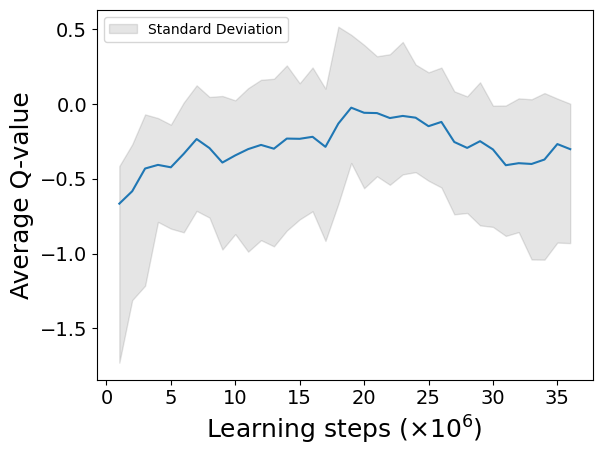

model updated

 time for simulate one day : 7446.9

average moving queuetime :  75.3 138.4
average stay queuetime :  115.0 211.3
average total queuetime :  190.4 349.7
average chargecount :  1.8 1.8
average ordercount :  41.7 41.7
day : 1


2024-07-20 17:17:28.884203: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 17:22:29.731376: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 17:29:22.657746: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 17:32:16.661192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


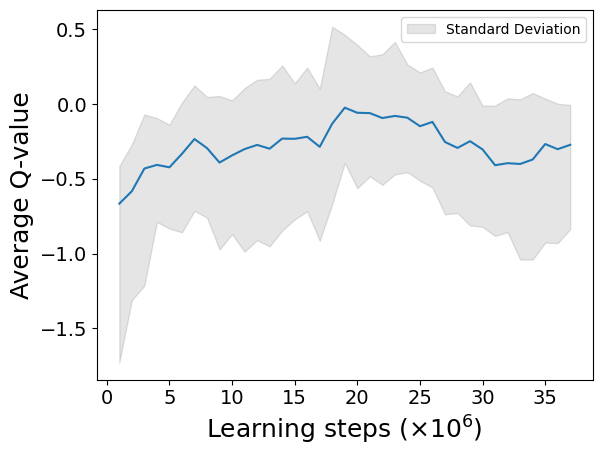

model updated


2024-07-20 18:10:48.321137: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 18:14:12.388386: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6223.0

average moving queuetime :  74.4 130.6
average stay queuetime :  144.3 310.2
average total queuetime :  218.8 440.8
average chargecount :  1.8 1.8
average ordercount :  41.7 41.7
day : 2


2024-07-20 18:43:43.451205: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


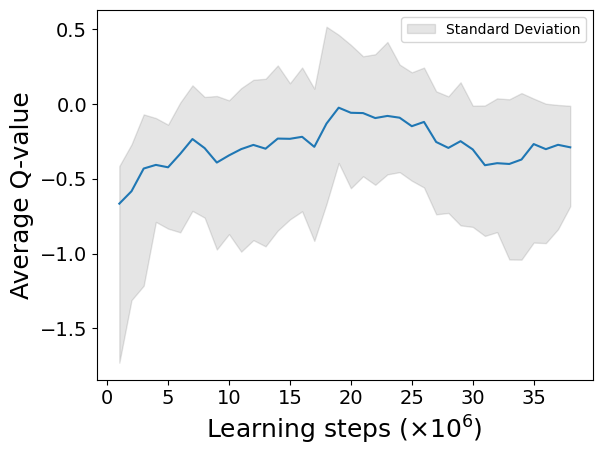

model updated


2024-07-20 18:52:32.168327: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:01:00.619400: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:11:06.133060: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:18:25.359906: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:25:36.021403: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:52:43.729673: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:02:06.271175: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:10:48.593627: W tensorflow/core/data/root_dataset.cc:24

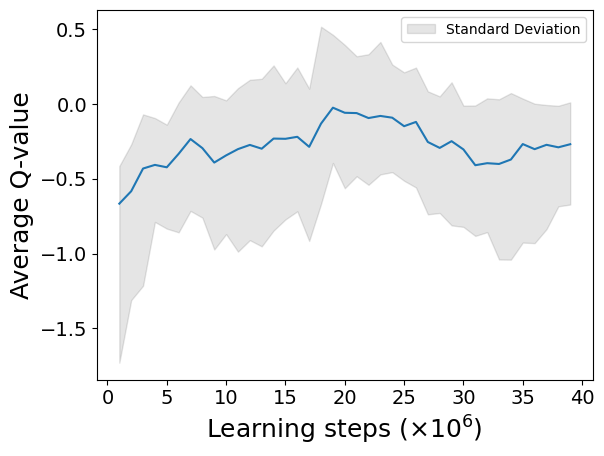

model updated

 time for simulate one day : 6310.4

average moving queuetime :  73.6 138.0
average stay queuetime :  158.3 353.5
average total queuetime :  232.0 491.5
average chargecount :  1.8 1.9
average ordercount :  41.7 41.7
day : 3


2024-07-20 20:43:26.059134: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:49:11.577633: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:49:35.925672: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:57:16.037589: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


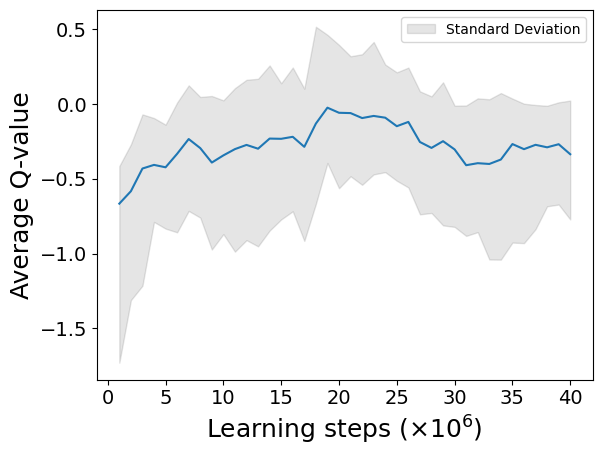

model updated


2024-07-20 21:38:18.381257: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 21:38:37.938757: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 21:53:39.994254: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 21:57:57.161212: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:10:48.999471: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6515.5

average moving queuetime :  69.9 114.9
average stay queuetime :  119.2 14.9
average total queuetime :  189.2 129.8
average chargecount :  1.9 1.9
average ordercount :  41.8 42.2
[25, 53, 45, 61, 35, 28, 72, 26, 56, 71, 52, 27]
[33, 45, 48, 49, 58, 32, 36, 43, 54, 65, 60, 10]
[47, 52, 46, 46, 40, 47, 54, 29, 53, 74, 54, 32]
[28, 56, 53, 37, 58, 53, 55, 36, 54, 59, 56, 36]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.8248829798101
code start to now : 191867.5
episode_reward :  618.3578120835067
fit_count :  405121
TD max = 2.083777473068238 TD min = 0.00010002220273018217

episode 11
day : 0


2024-07-20 22:21:56.334726: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:25:21.006263: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:31:37.532948: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:49:32.452028: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


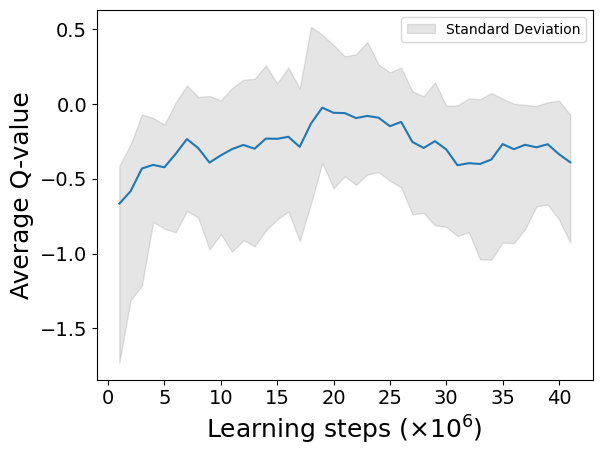

model updated


2024-07-20 22:58:02.577849: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 23:12:33.289320: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 23:12:44.634349: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 23:46:11.081189: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 23:57:15.386799: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6308.5

average moving queuetime :  75.2 118.6
average stay queuetime :  56.4 89.0
average total queuetime :  131.7 207.6
average chargecount :  1.6 1.6
average ordercount :  42.1 42.1
day : 1


2024-07-21 00:05:23.787566: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


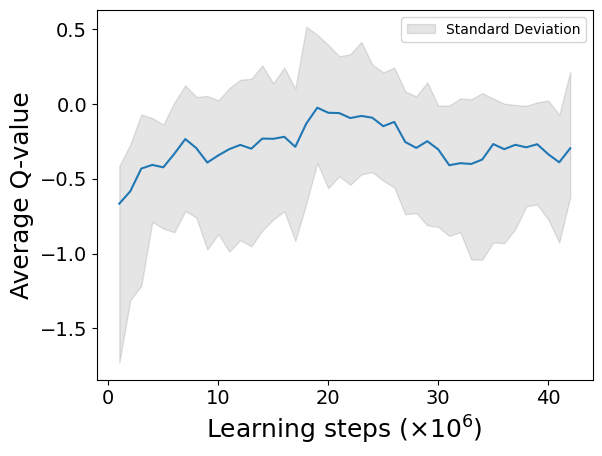

model updated


2024-07-21 00:13:34.827821: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:32:57.848609: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:42:12.139696: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:52:54.836989: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:55:21.981158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:06:02.203242: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:23:13.671156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:24:41.248295: W tensorflow/core/data/root_dataset.cc:24

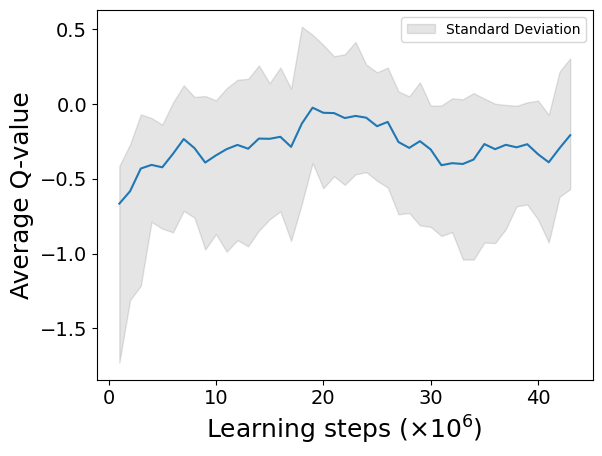

model updated


2024-07-21 01:34:40.031166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  13
day start to termianl : 40597.3

 time for simulate one day : 6005.3
so long waited in  8
day start to termianl : 40597.3
so long waited in  13
day start to termianl : 40597.3
so long waited in  17
day start to termianl : 40597.3
so long waited in  21
day start to termianl : 40597.3

average moving queuetime :  82.9 172.2
average stay queuetime :  386.3 1267.1
average total queuetime :  469.2 1439.3
average chargecount :  1.8 1.9
average ordercount :  41.0 39.9
[34, 18, 9, 24, 36, 38, 76, 40, 53, 64, 52, 29]
[36, 39, 58, 50, 31, 41, 45, 33, 60, 79, 42, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  2.9768882890082446
code start to now : 204194.3
episode_reward :  -64.26263018175642
fit_count :  431008
TD max = 2.1582283446362243 TD min = 0.00010002220273018217

episode 12
day : 0


2024-07-21 01:46:17.307740: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:52:02.691932: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:03:17.989948: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:12:41.067316: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:28:11.568622: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:34:36.624085: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:45:12.591438: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:51:48.093463: W tensorflow/core/data/root_dataset.cc:24

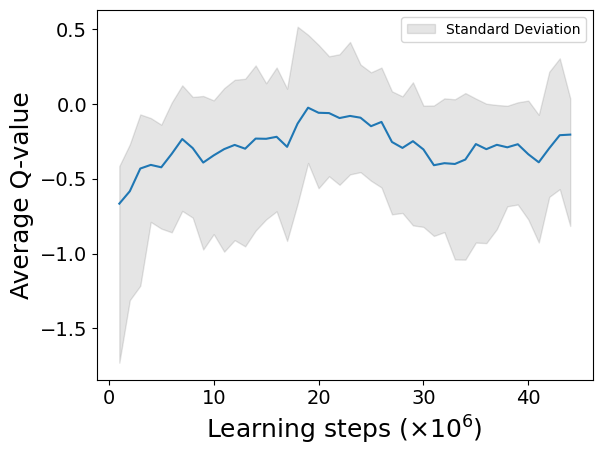

model updated


2024-07-21 03:21:08.940828: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7356.8

average moving queuetime :  68.5 113.7
average stay queuetime :  61.3 101.8
average total queuetime :  129.9 215.6
average chargecount :  1.7 1.7
average ordercount :  42.0 42.0
day : 1


2024-07-21 03:40:33.147329: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:05:42.831869: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:06:20.069126: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


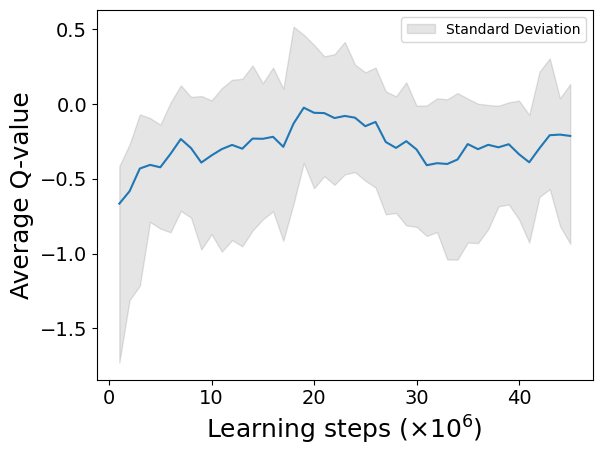

model updated


2024-07-21 04:49:10.628012: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:52:49.097176: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:54:38.571198: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 05:17:25.876903: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 05:21:12.645029: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6267.3

average moving queuetime :  68.7 127.0
average stay queuetime :  98.9 245.1
average total queuetime :  167.6 372.2
average chargecount :  1.8 1.8
average ordercount :  42.0 41.9
day : 2


2024-07-21 05:30:38.647035: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 05:38:04.796582: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


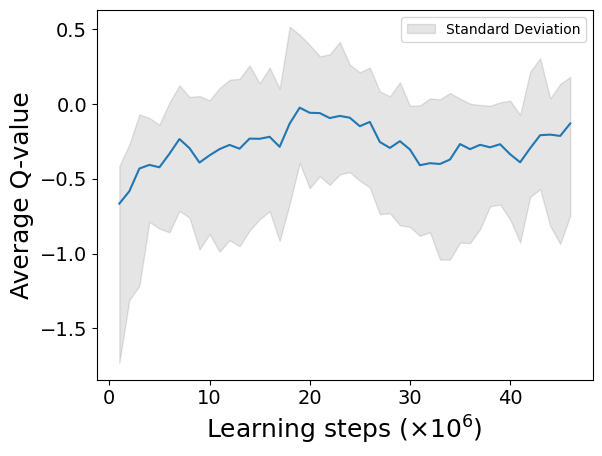

model updated


2024-07-21 06:23:09.108646: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:24:41.679794: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:32:42.951114: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:42:51.061775: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:50:11.239118: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


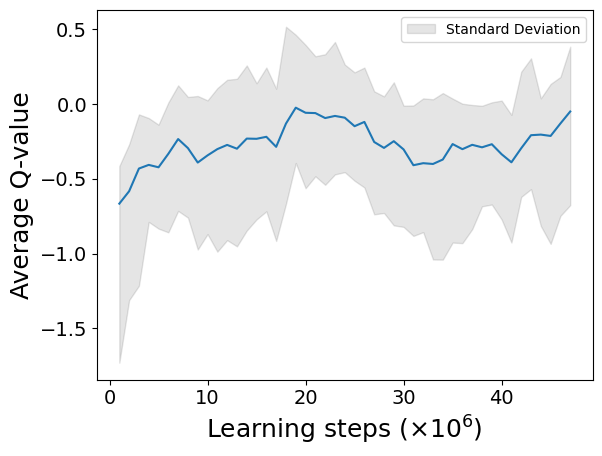

model updated

 time for simulate one day : 6396.6

average moving queuetime :  70.0 131.9
average stay queuetime :  94.2 154.5
average total queuetime :  164.2 286.4
average chargecount :  1.8 1.8
average ordercount :  42.0 42.0
day : 3


2024-07-21 07:26:47.132713: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:26:58.190636: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:27:11.251440: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:46:05.138364: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:05:44.185403: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:19:08.926784: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


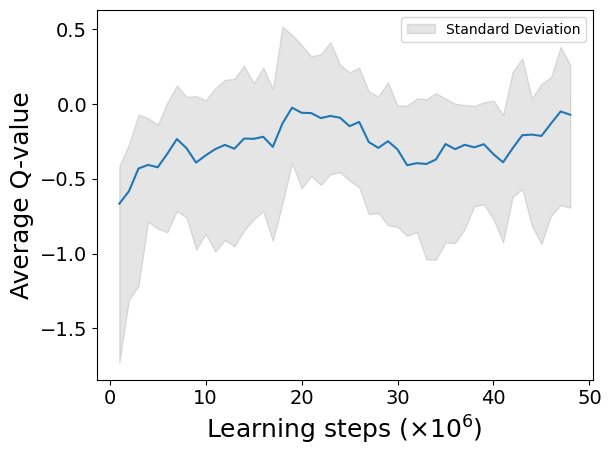

model updated


2024-07-21 08:26:32.639783: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:34:46.859429: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:39:41.355047: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:42:07.035300: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:43:09.530759: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:46:05.431188: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:46:39.940471: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  10
day start to termianl : 40681.3

 time for simulate one day : 6059.7
so long waited in  11
day start to termianl : 40681.3

average moving queuetime :  75.5 184.6
average stay queuetime :  222.4 1140.3
average total queuetime :  297.8 1324.9
average chargecount :  1.8 2.1
average ordercount :  41.5 40.1
[21, 28, 11, 18, 66, 54, 56, 30, 41, 62, 70, 41]
[35, 34, 53, 38, 46, 44, 63, 28, 55, 60, 68, 30]
[52, 30, 34, 52, 50, 35, 55, 43, 49, 66, 52, 27]
[39, 47, 60, 42, 41, 38, 44, 36, 62, 70, 49, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.967379819447179
code start to now : 230292.7
episode_reward :  338.09958490790626
fit_count :  483807
TD max = 2.3342609811782835 TD min = 0.00010057317316531913

episode 13
day : 0


2024-07-21 08:54:44.756992: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 09:09:00.267394: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 09:15:26.282979: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 09:35:37.309110: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


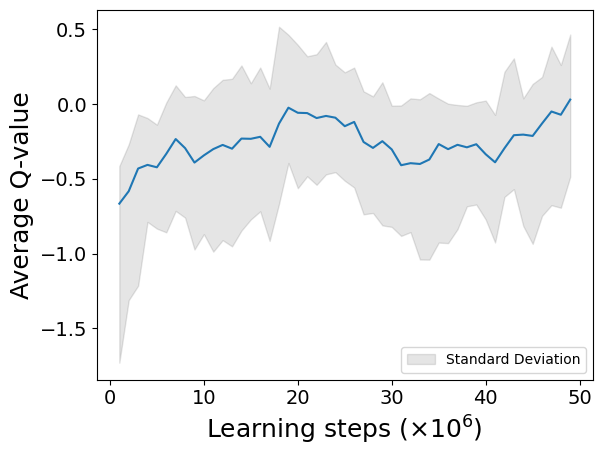

model updated


2024-07-21 09:53:07.678618: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 09:53:37.300369: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:15:20.417905: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:18:50.601174: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  2
day start to termianl : 42169.2

 time for simulate one day : 6159.6

average moving queuetime :  77.0 136.3
average stay queuetime :  670.2 1186.2
average total queuetime :  747.2 1322.5
average chargecount :  1.8 1.8
average ordercount :  41.2 41.1
[30, 22, 9, 35, 43, 57, 31, 28, 61, 75, 68, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5916158339326387
code start to now : 236458.2
episode_reward :  -83.2304144941666
fit_count :  496758
TD max = 3.086673711787729 TD min = 0.00010057317316531913

episode 14
day : 0


2024-07-21 10:35:38.526646: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:55:36.327064: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:57:30.503076: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


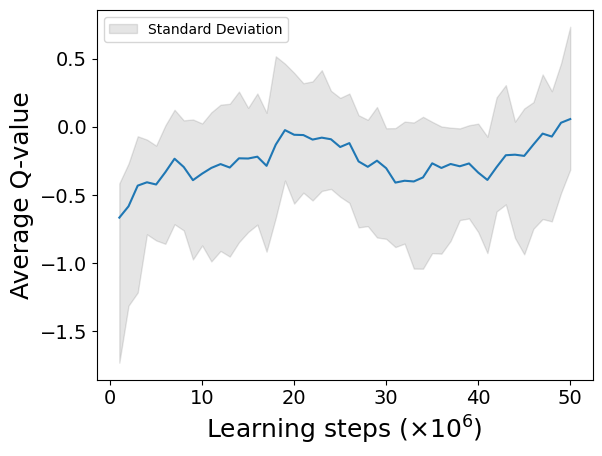

model updated


2024-07-21 11:04:33.888723: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 11:23:26.677296: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 11:26:42.751224: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 11:31:37.772113: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 11:39:18.390775: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 11:54:18.558841: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  3
day start to termianl : 42060.2

 time for simulate one day : 6220.5

average moving queuetime :  91.2 160.5
average stay queuetime :  686.9 1208.9
average total queuetime :  778.1 1369.4
average chargecount :  1.8 1.8
average ordercount :  40.9 40.9
[28, 25, 7, 23, 29, 45, 63, 39, 53, 76, 72, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5575784642883859
code start to now : 242684.5
episode_reward :  -95.30891514781973
fit_count :  509617
TD max = 2.29958644308516 TD min = 0.0001001001358032049

episode 15
day : 0


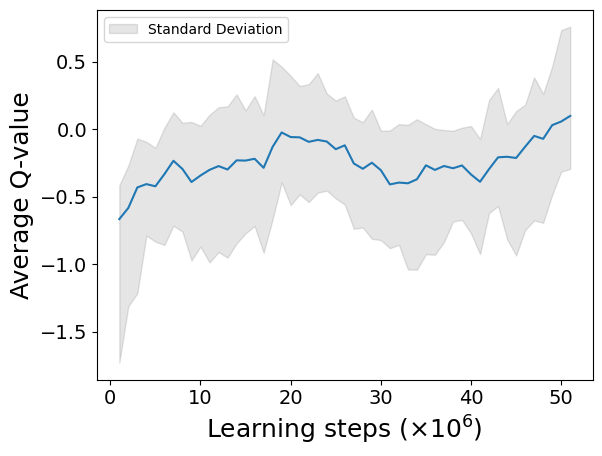

model updated


2024-07-21 12:39:59.827728: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:00:13.446066: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:16:31.190510: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:28:07.291337: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:34:01.694495: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:41:23.491207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


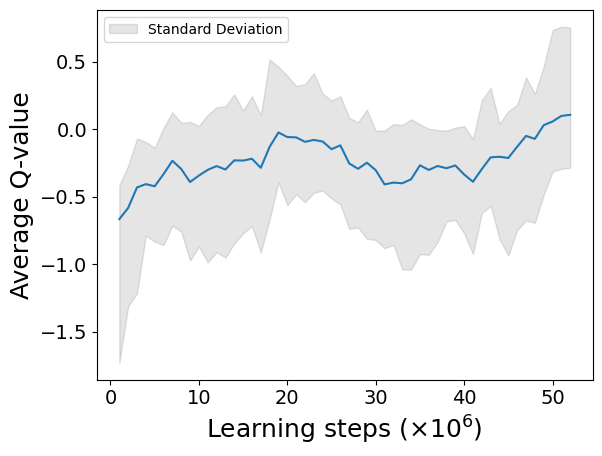

model updated


2024-07-21 13:47:51.382171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:48:47.457611: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:52:50.512128: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6182.0

average moving queuetime :  76.5 115.8
average stay queuetime :  294.9 446.3
average total queuetime :  371.5 562.1
average chargecount :  1.5 1.5
average ordercount :  41.4 41.4
day : 1


2024-07-21 14:03:27.140339: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:05:50.670733: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:09:01.685656: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:20:48.728233: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:34:26.070815: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:39:17.772511: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:51:34.701168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:56:37.927797: W tensorflow/core/data/root_dataset.cc:24

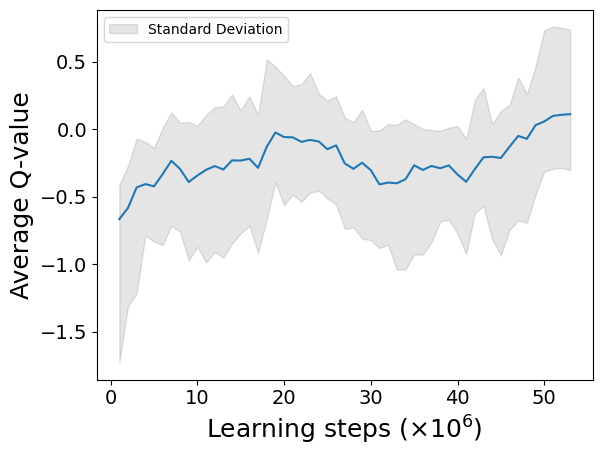

model updated


2024-07-21 15:40:30.325271: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  17
day start to termianl : 39038.8

 time for simulate one day : 5942.6

average moving queuetime :  78.8 163.0
average stay queuetime :  520.0 1392.7
average total queuetime :  598.8 1555.7
average chargecount :  1.8 2.0
average ordercount :  40.0 38.7
[22, 29, 9, 24, 34, 39, 44, 45, 50, 77, 57, 24]
[29, 48, 61, 38, 58, 52, 39, 25, 45, 106, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  3.024592634108297
code start to now : 254819.4
episode_reward :  -124.7077528086343
fit_count :  534880
TD max = 2.29958644308516 TD min = 0.00010038385391232243

episode 16
day : 0


2024-07-21 15:41:54.531242: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 15:55:54.861566: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:14:07.360339: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:20:15.812645: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:20:32.518343: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:28:26.410500: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


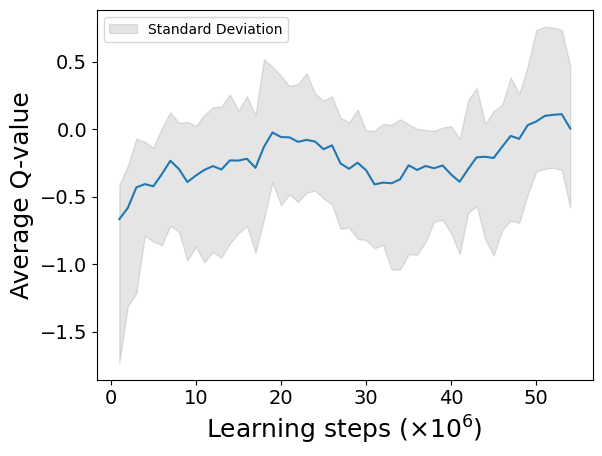

model updated


2024-07-21 16:43:18.622407: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:51:51.728027: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:54:47.589614: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 17:33:58.111285: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 17:38:57.661394: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  16
day start to termianl : 42958.8

 time for simulate one day : 7351.7

average moving queuetime :  79.6 138.1
average stay queuetime :  523.2 906.9
average total queuetime :  602.8 1044.9
average chargecount :  1.7 1.7
average ordercount :  41.3 41.3
[28, 27, 5, 19, 82, 29, 21, 53, 56, 82, 80, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5487322782338033
code start to now : 262176.4
episode_reward :  5.986252858865675
fit_count :  547979
TD max = 2.515870268440247 TD min = 0.00010066369771957453

episode 17
day : 0


2024-07-21 17:45:48.749790: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


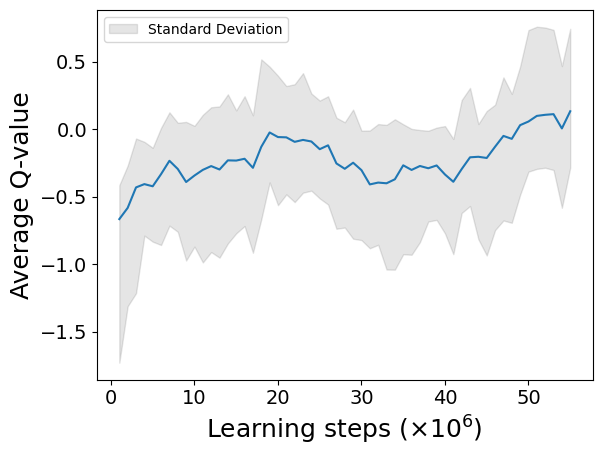

model updated


2024-07-21 18:01:39.222903: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:26:09.732880: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:34:44.277564: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:36:45.171446: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:51:14.101135: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:58:18.527787: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 19:04:11.419321: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 19:11:13.670115: W tensorflow/core/data/root_dataset.cc:24

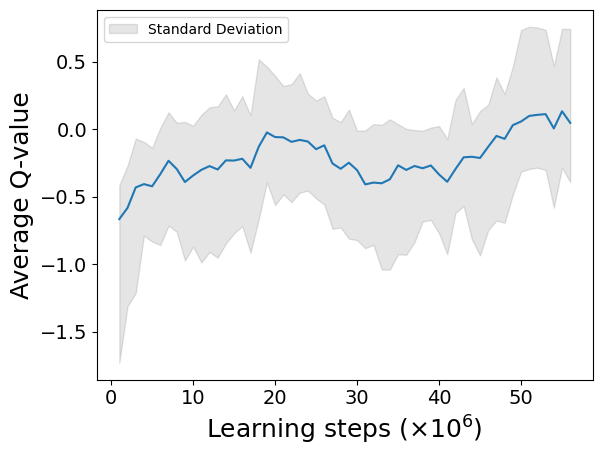

model updated
so long waited in  26
day start to termianl : 39315.4

 time for simulate one day : 5880.1
so long waited in  3
day start to termianl : 39315.4
so long waited in  16
day start to termianl : 39315.4

average moving queuetime :  89.9 153.1
average stay queuetime :  764.6 1302.3
average total queuetime :  854.4 1455.4
average chargecount :  1.7 1.7
average ordercount :  39.0 39.0
[39, 18, 9, 35, 61, 50, 20, 35, 61, 107, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5141653207893415
code start to now : 268061.9
episode_reward :  -272.3799269474352
fit_count :  560108
TD max = 3.408233635520935 TD min = 0.00010066369771957453

episode 18
day : 0


2024-07-21 19:47:08.121181: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 19:55:17.916560: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 20:16:33.157249: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


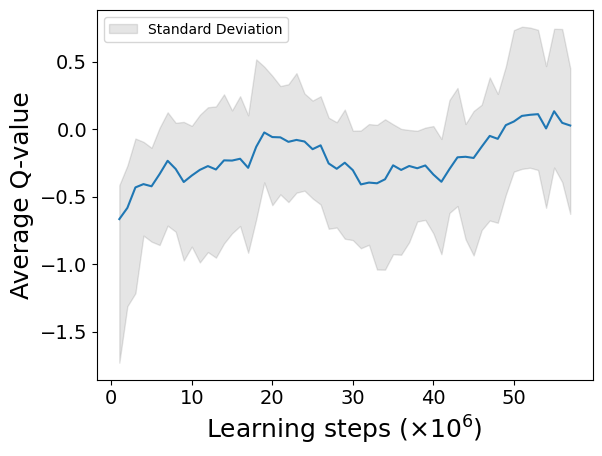

model updated


2024-07-21 20:46:09.329923: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 20:49:35.301139: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6328.1

average moving queuetime :  71.2 113.9
average stay queuetime :  265.4 424.6
average total queuetime :  336.6 538.5
average chargecount :  1.6 1.6
average ordercount :  41.9 41.9
day : 1


2024-07-21 21:15:16.761175: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:35:33.733846: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:38:19.465768: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:46:52.312829: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


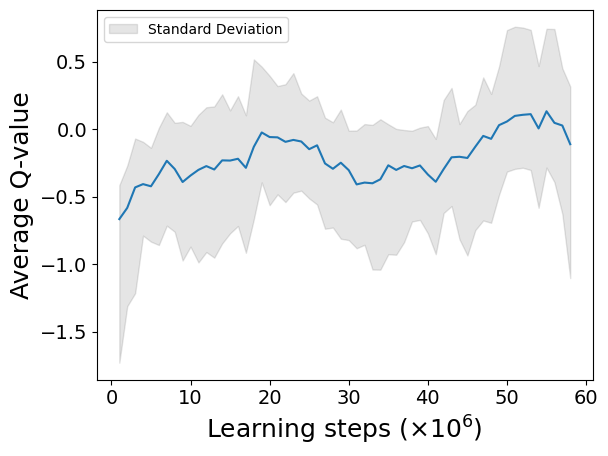

model updated


2024-07-21 22:25:19.938466: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:35:33.197758: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:43:17.167612: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6337.9

average moving queuetime :  74.3 144.5
average stay queuetime :  185.5 221.0
average total queuetime :  259.8 365.5
average chargecount :  1.7 1.9
average ordercount :  42.0 42.1
day : 2


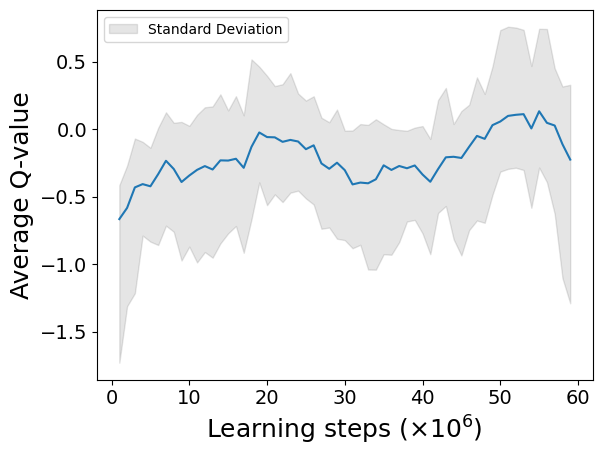

model updated


2024-07-21 23:32:13.105266: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 23:32:24.709443: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 23:37:41.261537: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 23:53:44.505108: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 00:02:39.600265: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 00:07:22.701135: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 00:13:43.998177: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 00:24:40.981589: W tensorflow/core/data/root_dataset.cc:24

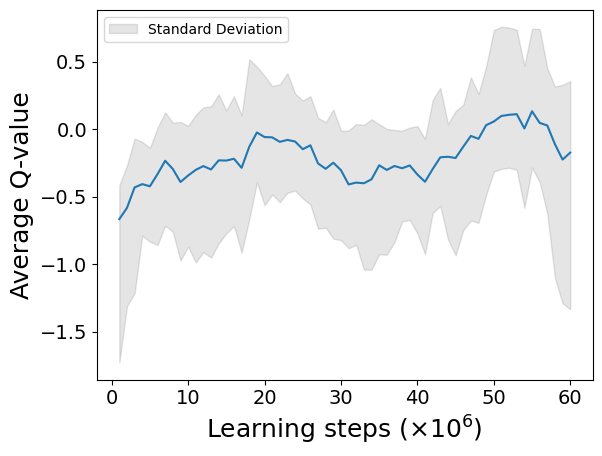

model updated

 time for simulate one day : 6519.0

average moving queuetime :  77.4 157.9
average stay queuetime :  158.5 206.9
average total queuetime :  236.0 364.8
average chargecount :  1.8 1.9
average ordercount :  42.0 41.9
day : 3


2024-07-22 01:31:21.346080: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:35:00.319166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:38:44.061200: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:41:16.381467: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:57:59.411167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:01:39.792350: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:07:49.246842: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:11:37.125998: W tensorflow/core/data/root_dataset.cc:24

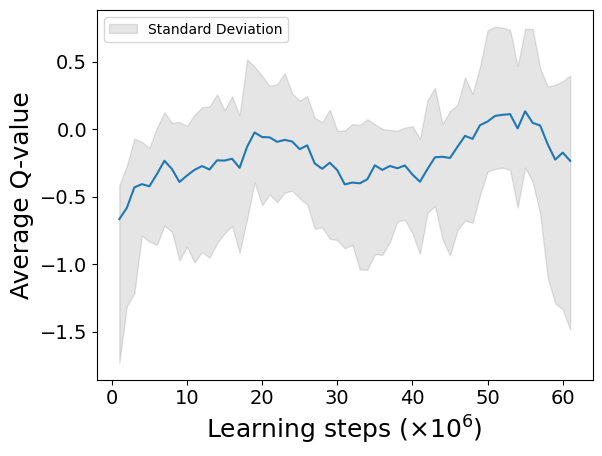

model updated


2024-07-22 02:27:38.096835: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:45:41.815934: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7423.1

average moving queuetime :  74.6 130.8
average stay queuetime :  210.0 687.1
average total queuetime :  284.7 817.9
average chargecount :  1.8 2.0
average ordercount :  41.8 41.4
[29, 21, 10, 38, 42, 27, 67, 39, 45, 77, 59, 26]
[29, 52, 47, 53, 61, 25, 30, 59, 58, 64, 57, 29]
[32, 41, 56, 66, 42, 32, 55, 29, 53, 79, 47, 37]
[40, 51, 60, 43, 46, 25, 56, 43, 47, 63, 85, 27]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.913981089317911
code start to now : 294687.8
episode_reward :  522.0369200609852
fit_count :  613632
TD max = 2.5107650733947753 TD min = 0.00010022351741790772

episode 19
day : 0


2024-07-22 02:49:19.420101: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:57:58.619736: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 03:07:06.421191: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 03:36:53.947988: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


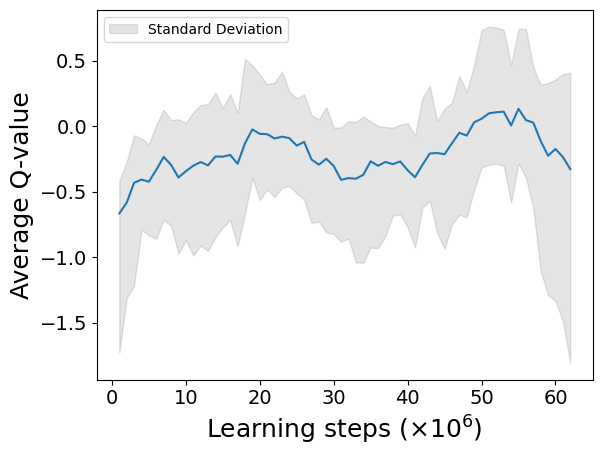

model updated


2024-07-22 04:13:33.794381: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:15:53.439983: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:20:56.969504: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:34:33.911503: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  10
day start to termianl : 39214.6

 time for simulate one day : 7080.7

average moving queuetime :  80.2 129.6
average stay queuetime :  645.8 1044.0
average total queuetime :  726.0 1173.7
average chargecount :  1.6 1.6
average ordercount :  39.3 39.3
[22, 28, 14, 18, 79, 40, 22, 28, 57, 104, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.514219536769146
code start to now : 301778.4
episode_reward :  -252.16397736617498
fit_count :  625847
TD max = 2.8246033168792724 TD min = 0.00010022351741790772

episode 20
day : 0


2024-07-22 04:44:29.048863: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:49:39.035724: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:52:16.021575: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:10:28.481135: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


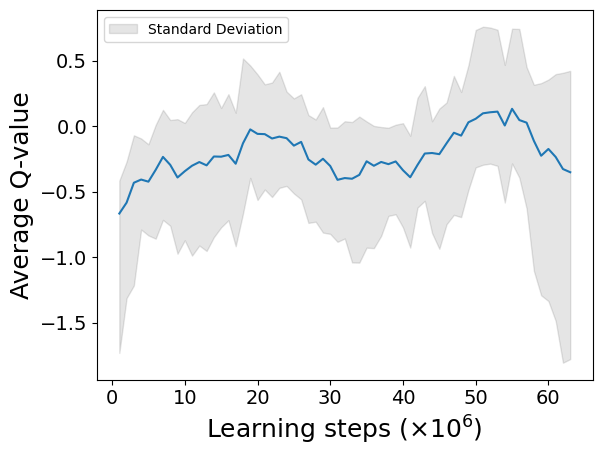

model updated


2024-07-22 05:22:29.309673: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:27:15.007110: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:30:42.809981: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:33:06.323748: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:36:37.239328: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:38:27.189654: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:41:46.869542: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:51:38.612801: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6365.8

average moving queuetime :  68.0 124.7
average stay queuetime :  120.7 221.4
average total queuetime :  188.8 346.0
average chargecount :  1.8 1.8
average ordercount :  41.9 41.9
day : 1


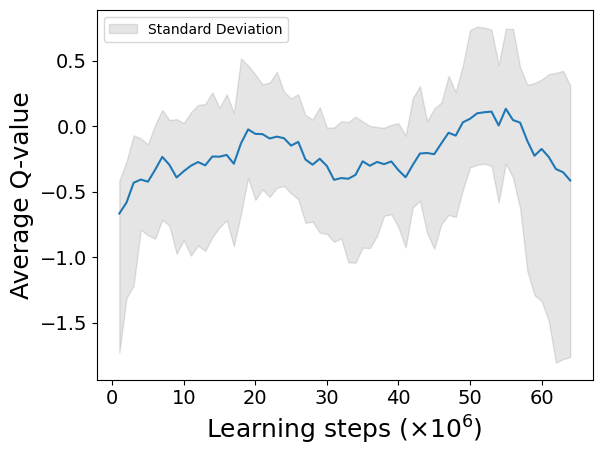

model updated


2024-07-22 06:43:53.665610: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 07:41:50.414754: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 07:52:41.194699: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


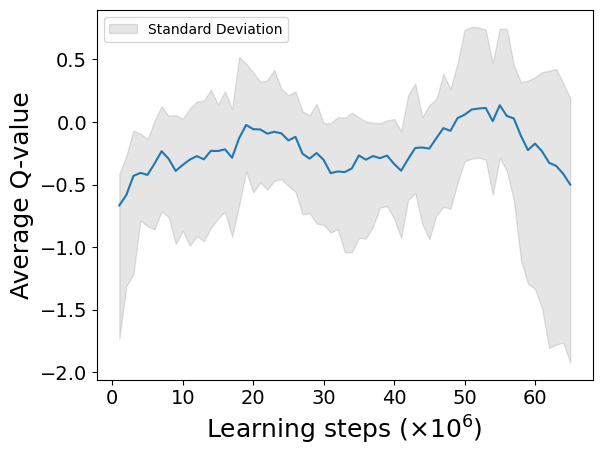

model updated


2024-07-22 08:08:33.380100: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6402.7

average moving queuetime :  66.1 123.6
average stay queuetime :  77.2 68.5
average total queuetime :  143.3 192.2
average chargecount :  1.9 1.9
average ordercount :  42.0 42.1
day : 2


2024-07-22 08:29:22.585454: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 08:34:15.794966: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 08:37:44.811136: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 08:41:22.696449: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 08:46:35.697428: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


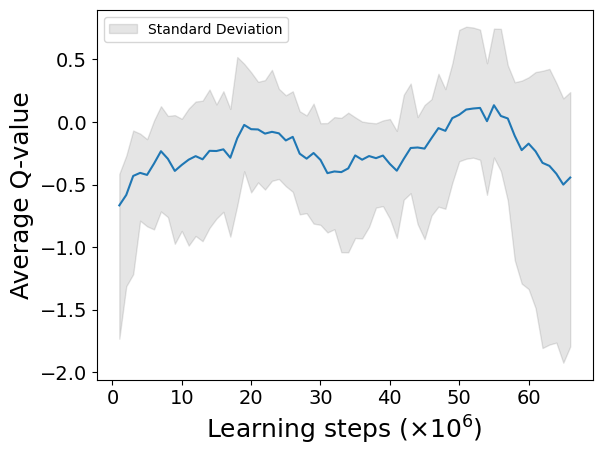

model updated


2024-07-22 09:17:27.143324: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:27:43.993876: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:36:29.698171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:38:35.950439: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:48:08.040268: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:56:32.398411: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 10:04:09.791202: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6430.7

average moving queuetime :  64.3 113.7
average stay queuetime :  77.3 145.0
average total queuetime :  141.6 258.8
average chargecount :  1.9 1.9
average ordercount :  42.0 42.0
day : 3


2024-07-22 10:12:51.902410: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


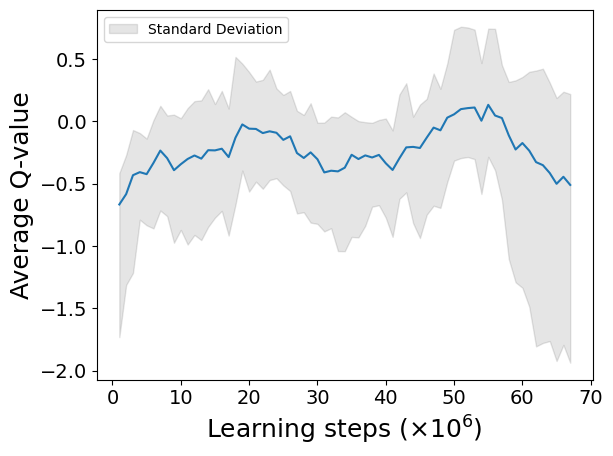

model updated


2024-07-22 11:06:11.881120: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:06:30.191658: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:08:54.497452: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:27:21.860059: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:27:42.009455: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:38:04.468554: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:43:05.101148: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:48:59.961188: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6338.7

average moving queuetime :  66.6 140.2
average stay queuetime :  83.7 196.2
average total queuetime :  150.3 336.4
average chargecount :  1.9 1.9
average ordercount :  42.0 41.9
[30, 50, 44, 35, 46, 57, 48, 35, 42, 67, 59, 37]
[11, 61, 44, 58, 51, 43, 43, 37, 49, 71, 57, 52]
[39, 62, 31, 45, 63, 41, 38, 39, 52, 66, 52, 33]
[47, 36, 39, 60, 54, 35, 41, 36, 64, 59, 60, 43]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.912603360347573
code start to now : 327333.5
episode_reward :  748.3043314615525
fit_count :  679632
TD max = 2.8246033168792724 TD min = 0.00010001132488247624
best model updated

episode 21
day : 0


2024-07-22 11:50:38.088010: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:54:24.110337: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:56:05.609157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


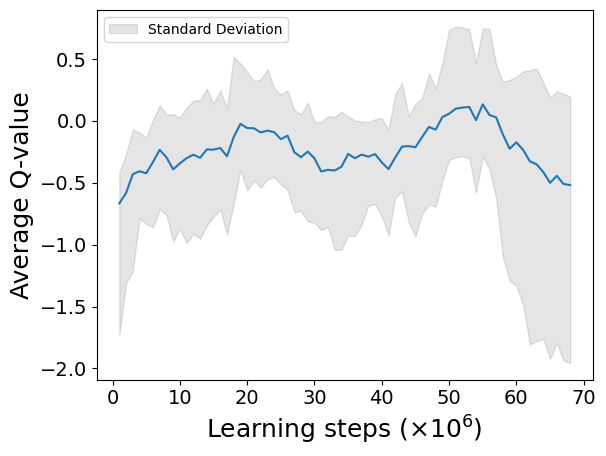

model updated


2024-07-22 12:15:41.571409: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 12:21:39.465281: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 12:31:25.718712: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 12:33:23.451190: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 12:37:11.891256: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 12:42:50.731316: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 13:07:41.162382: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 13:13:33.250734: W tensorflow/core/data/root_dataset.cc:24

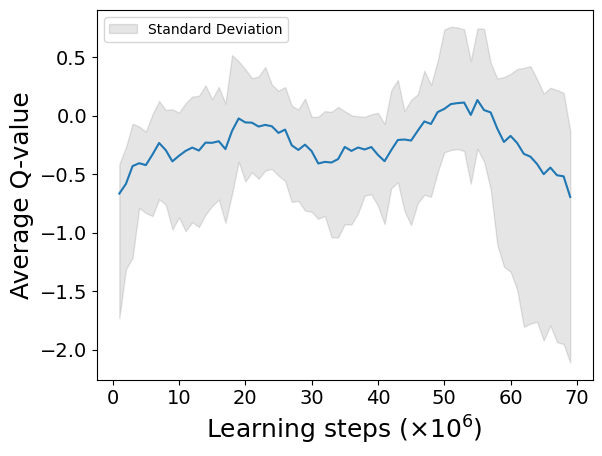

model updated
so long waited in  4
day start to termianl : 40112.4

 time for simulate one day : 7192.8
so long waited in  7
day start to termianl : 40112.4

average moving queuetime :  77.3 138.7
average stay queuetime :  680.4 1220.2
average total queuetime :  757.7 1358.9
average chargecount :  1.8 1.8
average ordercount :  39.9 39.9
[37, 18, 5, 43, 62, 47, 35, 21, 41, 91, 39, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.600860170770564
code start to now : 334532.5
episode_reward :  -207.22370017818864
fit_count :  692062
TD max = 3.1219683338165285 TD min = 0.00010001132488247624

episode 22
day : 0


2024-07-22 14:19:04.540684: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:30:42.381216: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


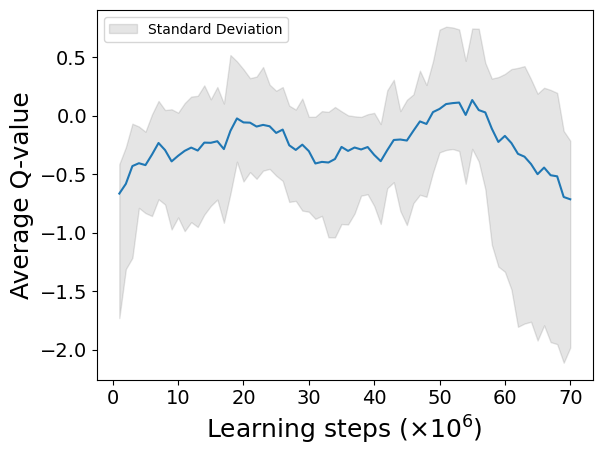

model updated


2024-07-22 15:07:15.821172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 15:10:09.412774: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 15:31:58.218894: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6338.2

average moving queuetime :  87.9 133.1
average stay queuetime :  340.1 514.6
average total queuetime :  428.0 647.7
average chargecount :  1.5 1.5
average ordercount :  41.5 41.5
day : 1


2024-07-22 15:44:23.705609: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 15:44:57.936632: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 15:53:10.959870: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:02:17.950513: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:09:12.891200: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:11:41.195602: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


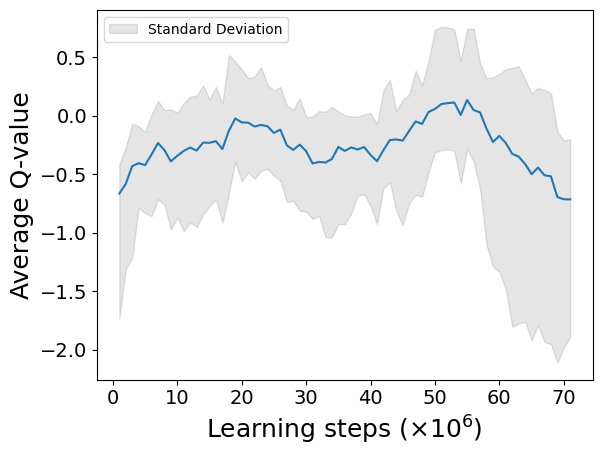

model updated


2024-07-22 16:20:15.411221: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:24:44.229952: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:45:51.201171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:45:54.474382: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:59:29.012802: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:59:43.036982: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 17:08:11.052434: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  19
day start to termianl : 42722.9

 time for simulate one day : 6345.5
so long waited in  0
day start to termianl : 42722.9
so long waited in  0
day start to termianl : 42722.9
so long waited in  1
day start to termianl : 42722.9
so long waited in  2
day start to termianl : 42722.9
so long waited in  10
day start to termianl : 42722.9
so long waited in  12
day start to termianl : 42722.9
so long waited in  17
day start to termianl : 42722.9
so long waited in  20
day start to termianl : 42722.9
so long waited in  23
day start to termianl : 42722.9

average moving queuetime :  84.7 174.3
average stay queuetime :  515.4 1356.2
average total queuetime :  600.1 1530.5
average chargecount :  1.8 2.1
average ordercount :  41.4 41.2
[32, 21, 10, 20, 32, 33, 60, 47, 51, 82, 39, 27]
[31, 65, 35, 39, 35, 62, 44, 29, 49, 59, 93, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  3.101417799046965
code start to now : 347230.2
episode_reward :  14.853241495397297
fit_count : 

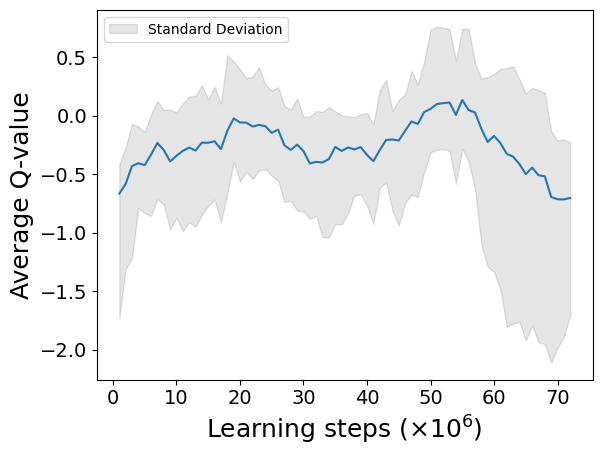

model updated


2024-07-22 17:43:13.630900: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 17:47:33.790668: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 17:52:07.512167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 18:02:45.521086: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 18:05:29.174739: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 18:42:42.496471: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


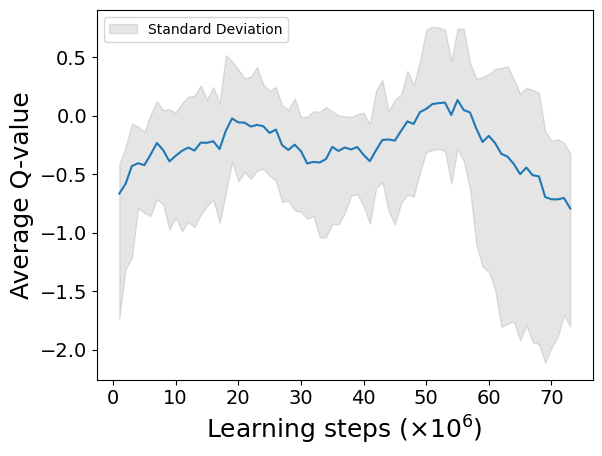

model updated

 time for simulate one day : 6432.0

average moving queuetime :  76.7 118.6
average stay queuetime :  140.8 217.8
average total queuetime :  217.5 336.4
average chargecount :  1.5 1.5
average ordercount :  42.3 42.3
day : 1


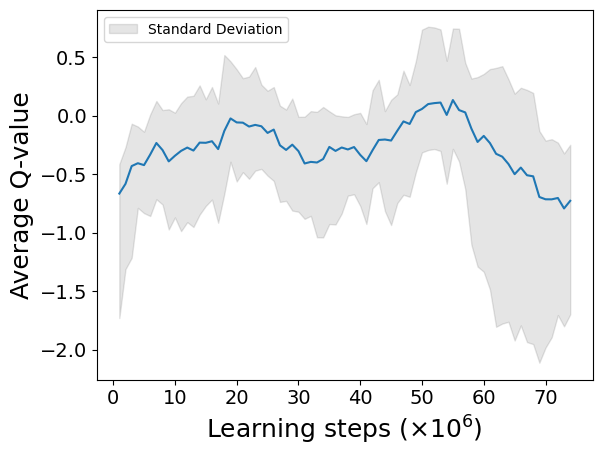

model updated

 time for simulate one day : 6434.7

average moving queuetime :  74.3 132.4
average stay queuetime :  80.4 53.7
average total queuetime :  154.7 186.1
average chargecount :  1.7 1.8
average ordercount :  42.2 42.1
day : 2


2024-07-22 20:57:47.606347: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 21:05:56.409893: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 21:40:32.742850: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


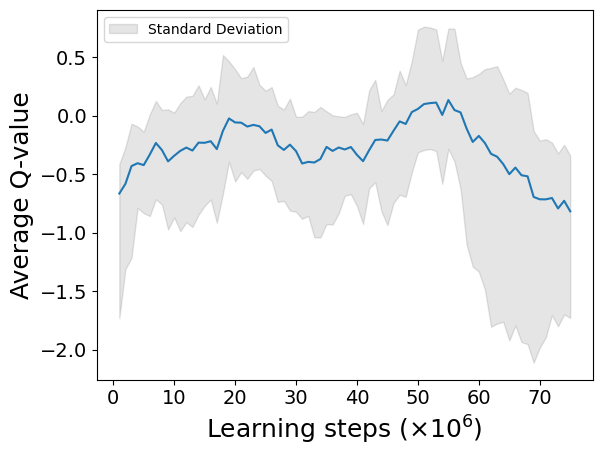

model updated


2024-07-22 21:59:53.243993: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:01:01.700526: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:05:23.071345: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:09:26.494165: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:24:47.135740: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:39:13.831158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:48:07.831856: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7491.3

average moving queuetime :  77.7 161.3
average stay queuetime :  177.9 672.2
average total queuetime :  255.7 833.5
average chargecount :  1.8 1.9
average ordercount :  42.0 41.7
day : 3


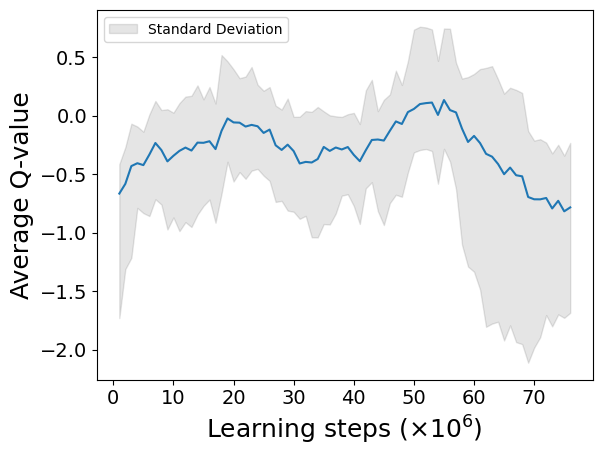

model updated


2024-07-22 23:28:53.841017: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:30:20.658792: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:55:16.148004: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:01:34.021167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


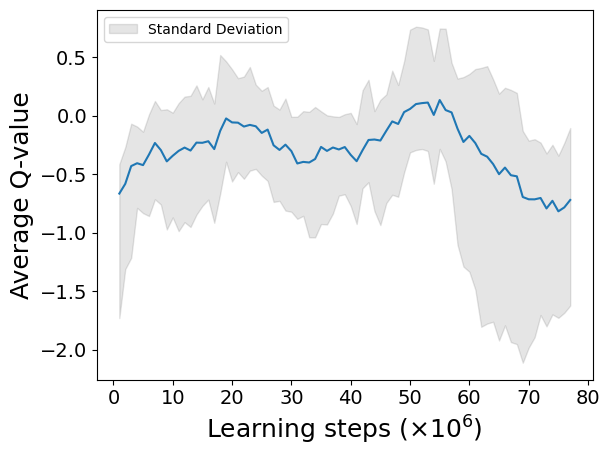

model updated


2024-07-23 00:33:41.895638: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6396.9

average moving queuetime :  74.4 119.0
average stay queuetime :  145.1 93.1
average total queuetime :  219.5 212.1
average chargecount :  1.8 1.8
average ordercount :  42.0 42.0
[21, 31, 8, 27, 43, 30, 70, 29, 63, 60, 49, 33]
[51, 45, 53, 25, 46, 36, 65, 40, 42, 59, 48, 39]
[38, 59, 35, 46, 55, 30, 32, 41, 59, 72, 43, 68]
[36, 57, 25, 68, 41, 28, 37, 57, 48, 68, 42, 45]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.934938823342152
code start to now : 374002.5
episode_reward :  613.4059198406342
fit_count :  772021
TD max = 2.072322564220429 TD min = 0.00010079154968268825

episode 24
day : 0


2024-07-23 01:22:45.644951: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 01:23:21.511197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 01:41:05.760330: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 01:45:51.681271: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


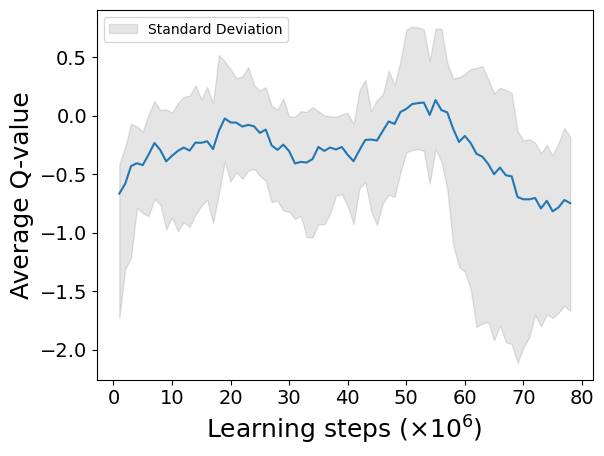

model updated


2024-07-23 02:03:59.541177: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 02:04:32.822734: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 02:07:16.970681: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 02:11:45.017242: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 02:26:54.621173: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6341.9

average moving queuetime :  63.8 101.4
average stay queuetime :  222.1 353.1
average total queuetime :  285.8 454.5
average chargecount :  1.6 1.6
average ordercount :  41.9 41.9
day : 1


2024-07-23 02:50:04.126681: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:06:10.951159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:06:18.095223: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:07:49.162285: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


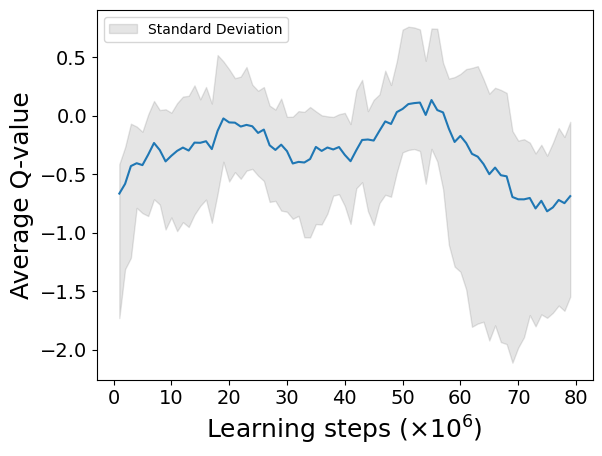

model updated


2024-07-23 03:46:45.233268: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:49:41.391254: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:01:26.561028: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6327.4

average moving queuetime :  68.9 132.7
average stay queuetime :  178.0 252.3
average total queuetime :  246.9 385.0
average chargecount :  1.7 1.8
average ordercount :  41.9 41.9
day : 2


2024-07-23 04:28:47.167257: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


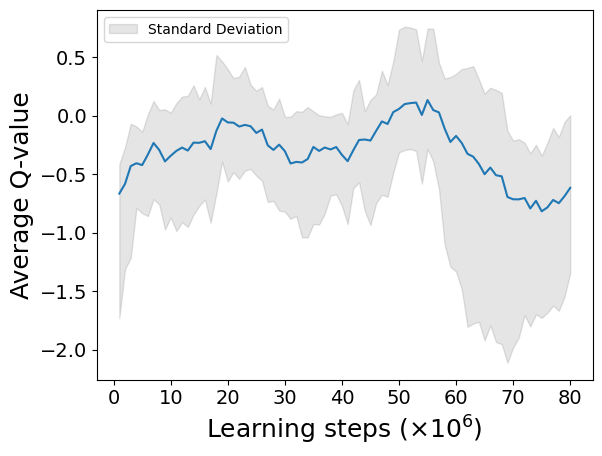

model updated


2024-07-23 04:35:01.159056: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:35:28.258406: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:59:55.197369: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:00:57.209106: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:46:39.851903: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


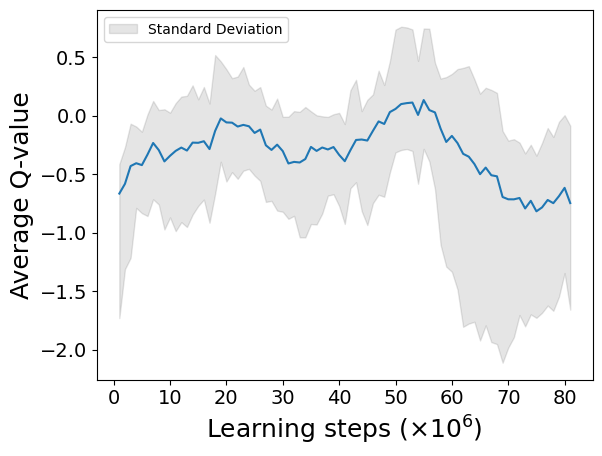

model updated


2024-07-23 05:54:08.710274: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6525.4

average moving queuetime :  70.2 133.3
average stay queuetime :  155.4 208.2
average total queuetime :  225.5 341.5
average chargecount :  1.7 1.8
average ordercount :  41.9 41.8
day : 3


2024-07-23 06:14:03.481333: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 06:20:22.043096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 06:46:06.979902: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 06:47:57.011159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 07:08:24.599073: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 07:08:33.738523: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


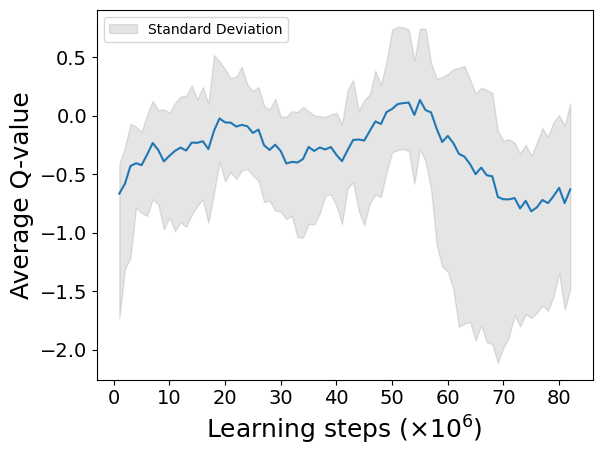

model updated


2024-07-23 07:37:14.237959: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 07:44:23.229889: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 07:45:27.552974: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 07:53:04.690897: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 07:53:55.114652: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6479.7

average moving queuetime :  68.3 111.0
average stay queuetime :  127.6 79.8
average total queuetime :  195.9 190.8
average chargecount :  1.8 1.8
average ordercount :  41.9 42.0
[29, 24, 9, 52, 37, 43, 47, 35, 44, 76, 50, 31]
[43, 61, 32, 53, 29, 41, 51, 41, 60, 68, 42, 22]
[42, 52, 50, 54, 36, 33, 42, 47, 52, 70, 44, 29]
[27, 54, 54, 42, 42, 54, 26, 58, 49, 60, 44, 20]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.81130629899113
code start to now : 399694.2
episode_reward :  620.1304439440416
fit_count :  825551
TD max = 2.175931289291382 TD min = 0.00010064074993133545

episode 25
day : 0


2024-07-23 08:25:15.211409: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


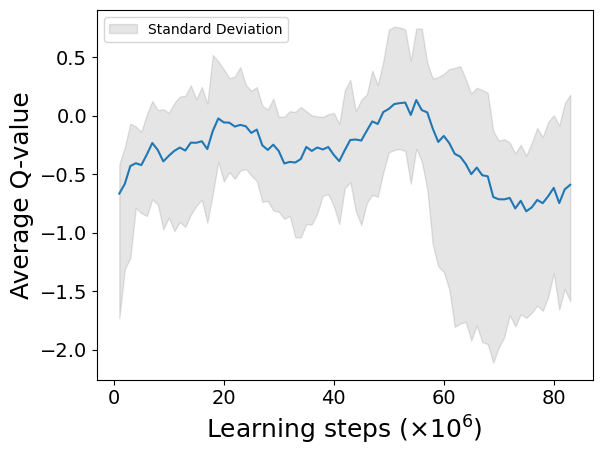

model updated


2024-07-23 08:51:46.311757: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 09:17:24.873473: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 09:38:28.340650: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6337.3

average moving queuetime :  98.4 154.9
average stay queuetime :  555.5 873.9
average total queuetime :  653.9 1028.8
average chargecount :  1.6 1.6
average ordercount :  41.8 41.8
day : 1


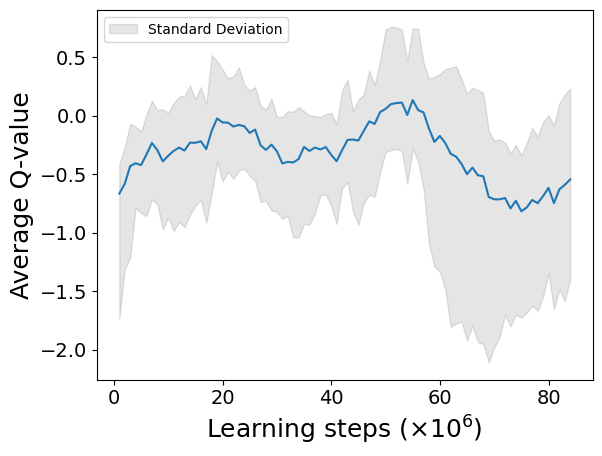

model updated


2024-07-23 10:21:59.499683: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 10:53:59.229464: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 11:09:42.542598: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


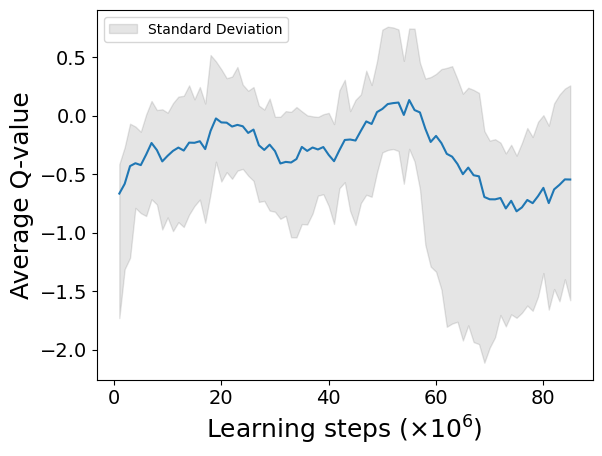

model updated


2024-07-23 11:14:31.471185: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 11:20:04.371200: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 11:21:46.283871: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 11:26:00.663674: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6413.8

average moving queuetime :  86.5 130.7
average stay queuetime :  434.1 558.7
average total queuetime :  520.6 689.3
average chargecount :  1.6 1.7
average ordercount :  41.7 41.7
day : 2


2024-07-23 11:45:42.506518: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 11:50:59.438245: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:01:53.480402: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:14:15.541251: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:28:09.178597: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


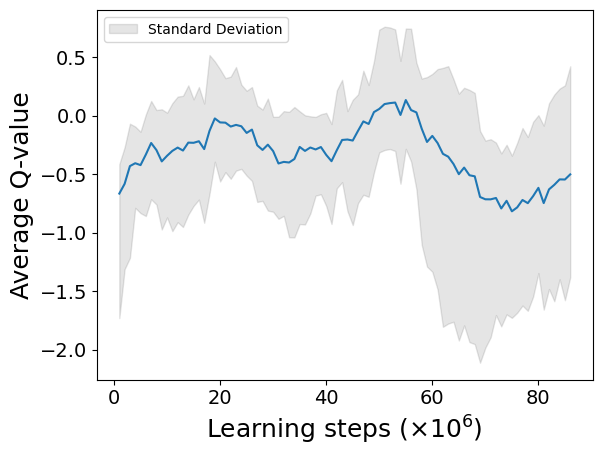

model updated


2024-07-23 12:34:08.021131: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:37:29.895453: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:41:02.431267: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:52:12.639777: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:56:31.739071: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 13:05:37.611229: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 13:09:11.160375: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6314.9

average moving queuetime :  80.1 115.3
average stay queuetime :  336.6 252.9
average total queuetime :  416.7 368.2
average chargecount :  1.7 1.7
average ordercount :  41.7 41.8
day : 3


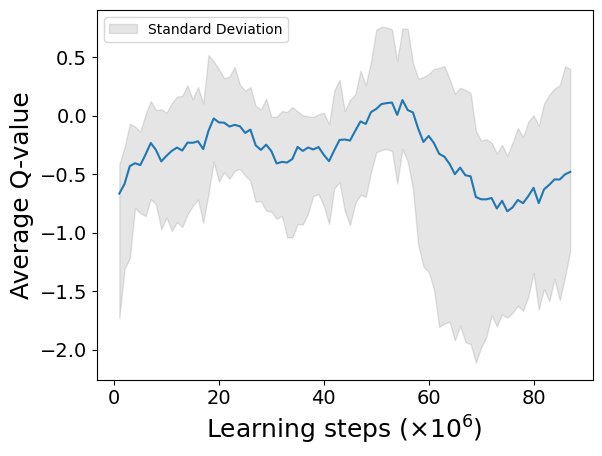

model updated


2024-07-23 14:00:14.731171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 14:06:30.704596: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 14:09:02.981121: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 14:14:44.469931: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 14:29:48.048895: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6399.2

average moving queuetime :  79.1 129.8
average stay queuetime :  278.8 184.4
average total queuetime :  357.9 314.2
average chargecount :  1.7 1.7
average ordercount :  41.8 42.0
[32, 27, 6, 14, 13, 38, 52, 57, 51, 58, 56, 68]
[39, 41, 34, 22, 57, 39, 31, 43, 62, 58, 62, 30]
[31, 39, 42, 47, 43, 52, 36, 29, 52, 59, 59, 23]
[32, 54, 36, 51, 51, 32, 34, 39, 58, 59, 46, 18]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.952404090150067
code start to now : 425177.4
episode_reward :  401.8658982444965
fit_count :  878833
TD max = 2.274050655460358 TD min = 0.00010051259994515718

episode 26
day : 0


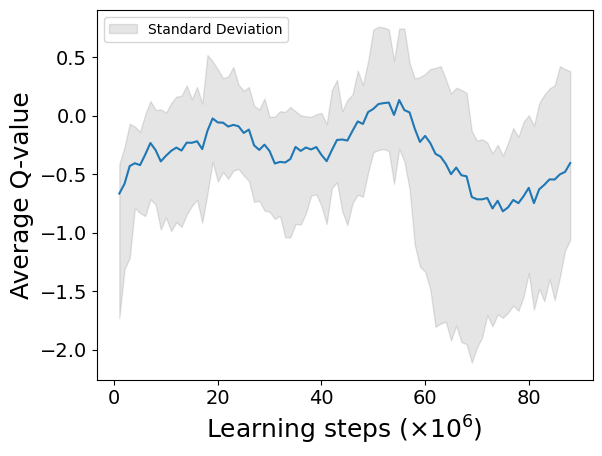

model updated


2024-07-23 15:15:59.172277: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:27:07.897814: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:33:09.497578: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:38:46.871193: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:46:44.036483: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:46:57.726774: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


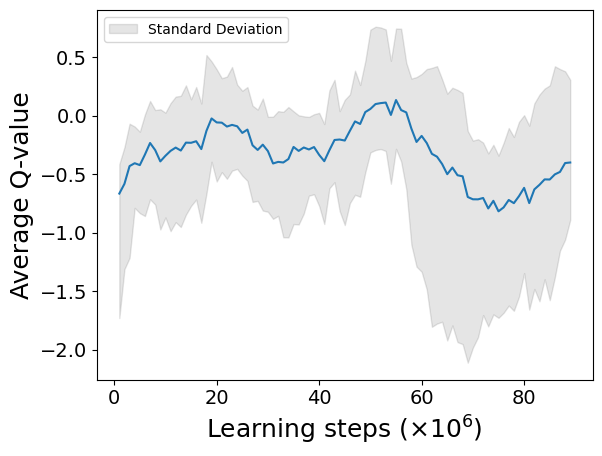

model updated


2024-07-23 16:33:44.134736: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6406.9

average moving queuetime :  68.0 110.4
average stay queuetime :  335.5 544.6
average total queuetime :  403.5 655.0
average chargecount :  1.6 1.6
average ordercount :  42.0 42.0
day : 1


2024-07-23 17:21:14.301941: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 17:29:09.611249: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 17:47:05.068094: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


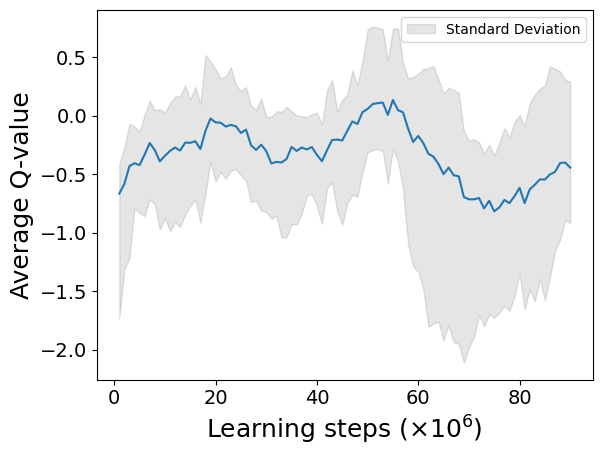

model updated


2024-07-23 18:25:03.091842: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6517.9

average moving queuetime :  73.1 134.4
average stay queuetime :  362.1 667.1
average total queuetime :  435.2 801.5
average chargecount :  1.7 1.7
average ordercount :  41.8 41.6
day : 2


2024-07-23 18:38:41.752796: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 18:46:18.738952: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 18:53:58.044873: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:11:06.964096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


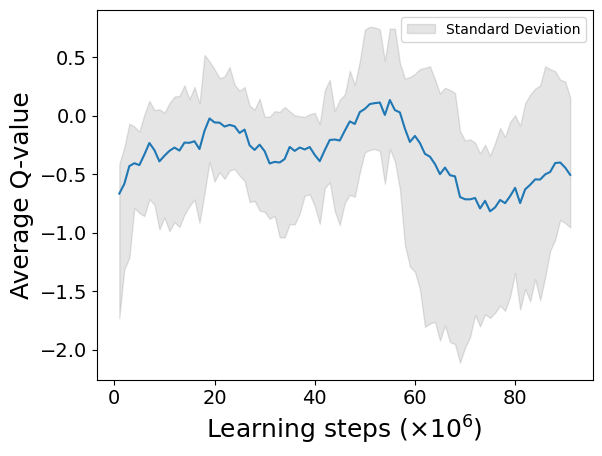

model updated


2024-07-23 19:17:12.789161: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:28:06.758754: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:28:57.235657: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:30:33.941292: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:50:06.563264: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:57:49.736083: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6313.6

average moving queuetime :  71.8 116.8
average stay queuetime :  312.0 358.8
average total queuetime :  383.9 475.6
average chargecount :  1.7 1.7
average ordercount :  41.7 41.6
day : 3


2024-07-23 20:27:48.698856: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:29:10.369694: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


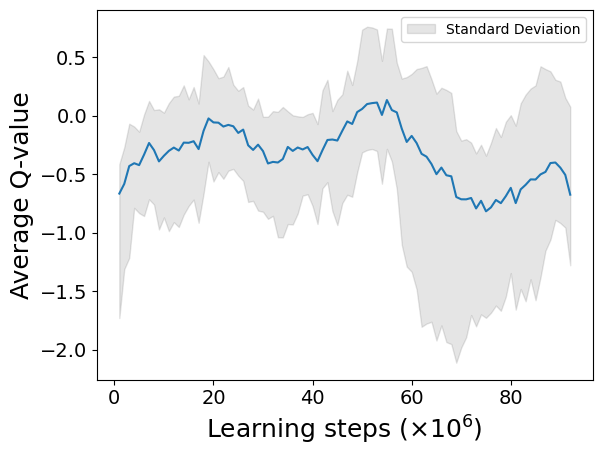

model updated


2024-07-23 20:42:22.990041: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:47:44.931221: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:56:18.059434: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:04:11.830068: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:40:42.559505: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:48:34.496209: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


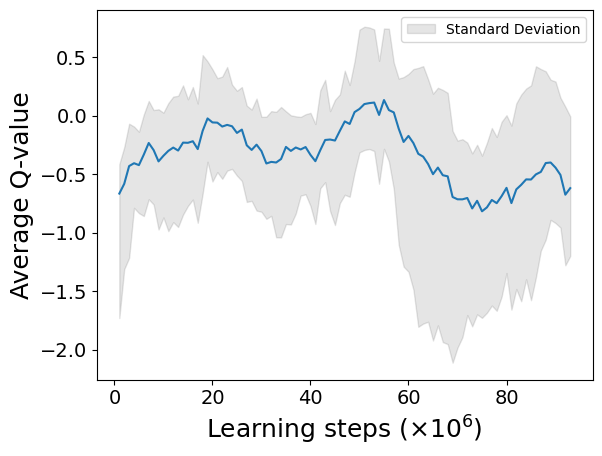

model updated

 time for simulate one day : 6368.1

average moving queuetime :  71.0 116.7
average stay queuetime :  254.4 144.3
average total queuetime :  325.4 261.0
average chargecount :  1.7 1.7
average ordercount :  41.7 41.8
[37, 17, 11, 9, 39, 43, 51, 51, 45, 60, 77, 47]
[37, 34, 22, 53, 39, 32, 53, 29, 61, 61, 80, 16]
[38, 23, 50, 48, 43, 37, 38, 30, 63, 68, 49, 19]
[31, 56, 35, 43, 57, 29, 47, 42, 43, 65, 48, 16]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.913061887147862
code start to now : 450801.6
episode_reward :  515.292903328946
fit_count :  932068
TD max = 2.274050655460358 TD min = 0.00010009566545489115

episode 27
day : 0


2024-07-23 22:13:17.212226: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 22:19:21.091800: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 22:32:26.279618: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


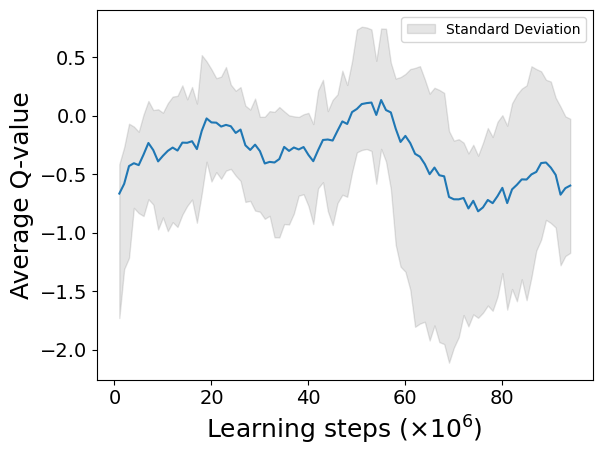

model updated


2024-07-23 23:23:42.069152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:29:21.466344: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:32:00.960023: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:40:01.850614: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6387.2

average moving queuetime :  80.3 119.7
average stay queuetime :  393.7 586.7
average total queuetime :  474.1 706.3
average chargecount :  1.5 1.5
average ordercount :  41.8 41.8
day : 1


2024-07-24 00:11:03.178692: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:12:41.251866: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


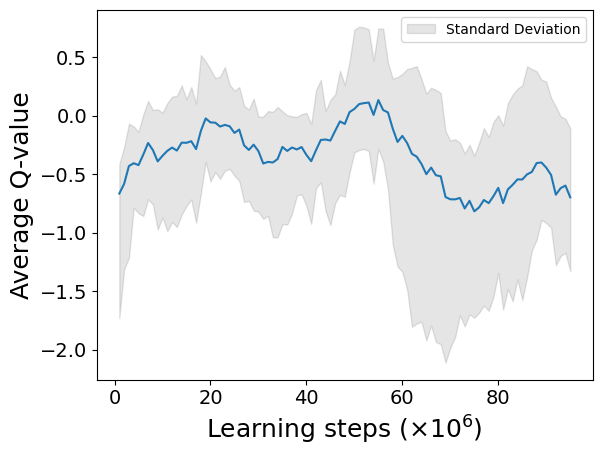

model updated


2024-07-24 00:33:35.028310: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:41:13.785399: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:46:36.339994: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 01:02:18.747447: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 01:05:32.067997: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 01:16:34.930409: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 01:28:35.525972: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6309.1

average moving queuetime :  75.8 128.2
average stay queuetime :  468.1 943.9
average total queuetime :  543.9 1072.1
average chargecount :  1.6 1.8
average ordercount :  41.7 41.5
day : 2


2024-07-24 01:43:00.239760: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 01:45:53.848398: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


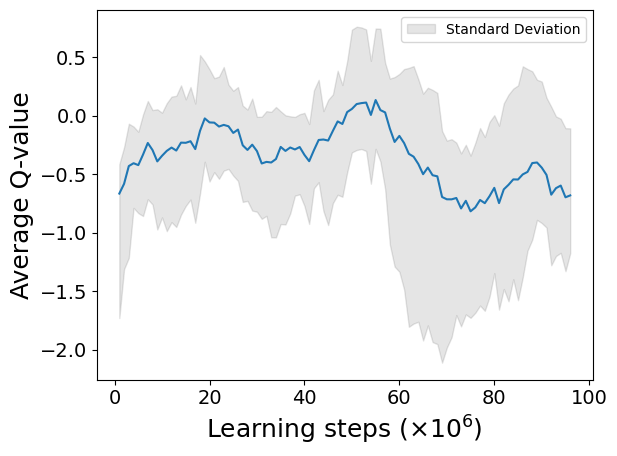

model updated


2024-07-24 01:52:44.841149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:26:40.128012: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:35:44.257374: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:43:43.162556: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


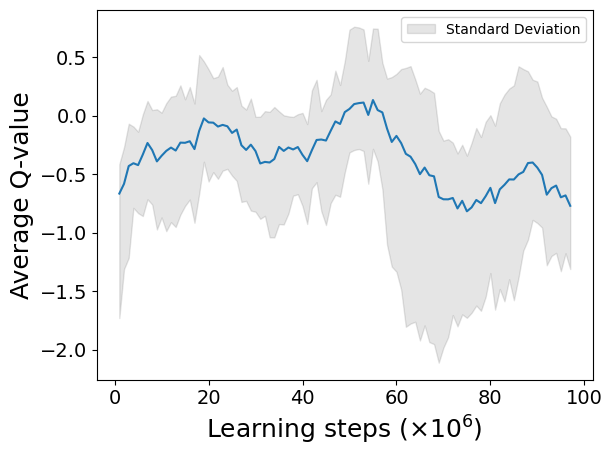

model updated


2024-07-24 03:18:09.928158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6428.8

average moving queuetime :  71.7 110.1
average stay queuetime :  317.9 56.6
average total queuetime :  389.6 166.7
average chargecount :  1.7 1.7
average ordercount :  41.9 42.3
day : 3


2024-07-24 03:33:16.738875: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:26.610404: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:31.647094: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:41.303650: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:48.717782: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:53.797893: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:35:04.511118: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:36:11.673904: W tensorflow/core/data/root_dataset.cc:24

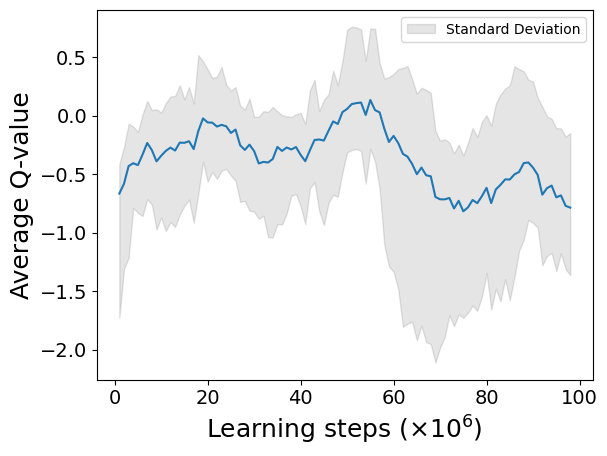

model updated


2024-07-24 04:39:25.767792: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6521.7

average moving queuetime :  70.7 124.8
average stay queuetime :  266.5 232.0
average total queuetime :  337.2 356.8
average chargecount :  1.7 1.8
average ordercount :  42.0 42.3
[20, 30, 10, 5, 12, 69, 35, 45, 46, 61, 67, 47]
[39, 30, 31, 35, 50, 58, 37, 28, 44, 65, 75, 42]
[40, 21, 47, 52, 37, 60, 43, 20, 55, 67, 47, 28]
[58, 33, 45, 37, 49, 61, 42, 25, 51, 55, 67, 27]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  6.030876823110348
code start to now : 476466.5
episode_reward :  563.3006632702954
fit_count :  985556
TD max = 2.7956517077445984 TD min = 0.00010009566545489115

episode 28
day : 0


2024-07-24 05:28:50.135549: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 05:30:11.455886: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 05:31:56.896900: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 05:36:56.460463: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


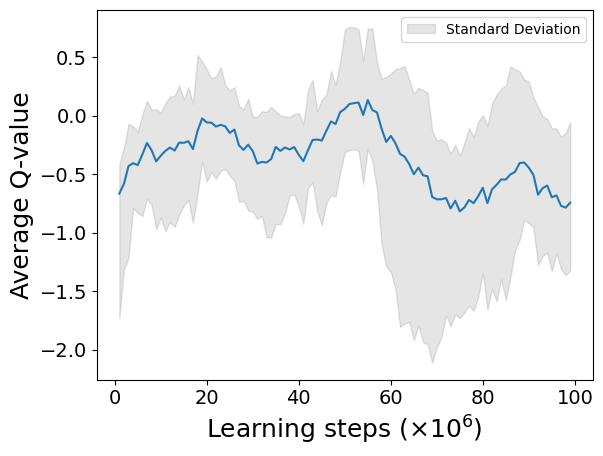

model updated


2024-07-24 06:06:39.351184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 06:20:50.151888: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 06:42:42.019604: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 06:45:31.731030: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 06:50:22.160753: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 06:58:15.177857: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6525.0

average moving queuetime :  73.8 109.8
average stay queuetime :  109.1 162.1
average total queuetime :  182.9 271.9
average chargecount :  1.5 1.5
average ordercount :  42.2 42.2
day : 1


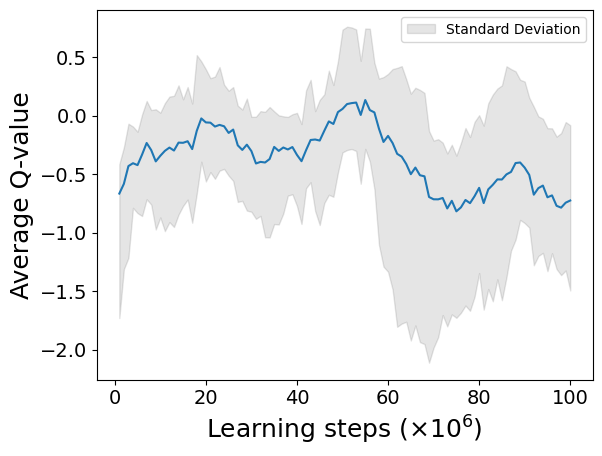

2024-07-24 07:23:01.909708: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:53:39.333895: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


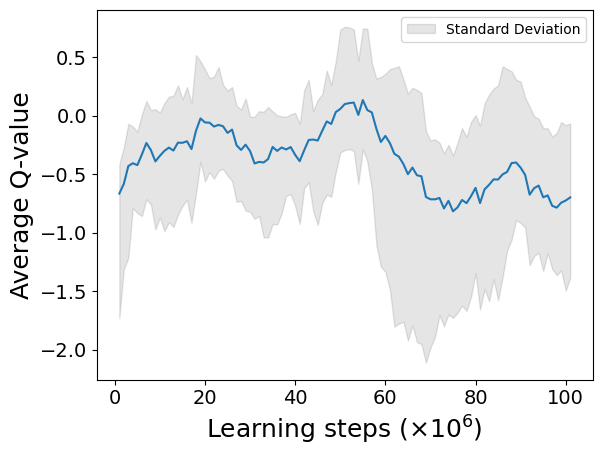


 time for simulate one day : 6541.9

average moving queuetime :  65.8 99.9
average stay queuetime :  66.0 48.2
average total queuetime :  131.8 148.2
average chargecount :  1.6 1.7
average ordercount :  42.2 42.1
day : 2


2024-07-24 08:57:52.587791: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:00:41.681925: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:14:05.931272: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:19:36.830019: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:30:08.618346: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:31:12.438272: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:37:52.928332: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:40:16.187064: W tensorflow/core/data/root_dataset.cc:24

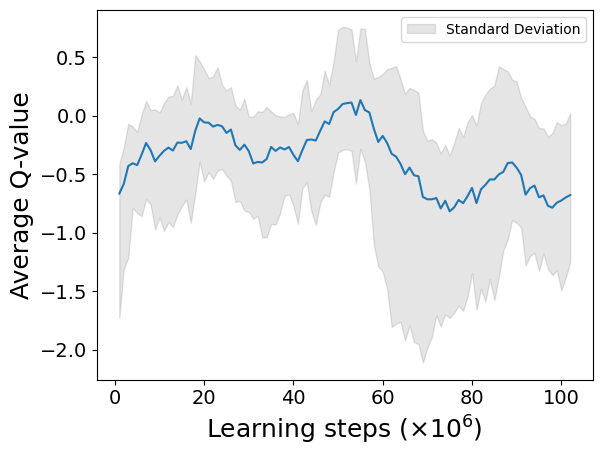

2024-07-24 10:52:25.631802: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 10:56:35.781155: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7645.8

average moving queuetime :  64.6 109.9
average stay queuetime :  61.8 95.5
average total queuetime :  126.5 205.5
average chargecount :  1.6 1.8
average ordercount :  42.1 42.0
day : 3


2024-07-24 11:25:49.229168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 11:29:50.368462: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 11:34:28.972178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


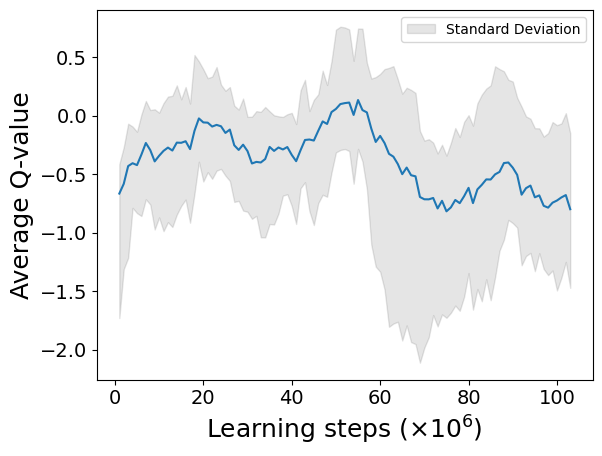

2024-07-24 11:46:08.695973: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 11:50:35.848054: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 11:54:44.349207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:09:19.385952: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:14:25.231145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:22:10.260982: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:36:19.083068: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:45:34.608548: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6330.2

average moving queuetime :  66.8 126.2
average stay queuetime :  117.5 478.8
average total queuetime :  184.3 605.0
average chargecount :  1.7 1.7
average ordercount :  42.0 41.7
[21, 33, 7, 20, 16, 38, 66, 43, 58, 59, 52, 33]
[23, 51, 44, 43, 44, 55, 33, 34, 47, 62, 46, 28]
[53, 46, 34, 50, 33, 43, 49, 26, 63, 57, 52, 22]
[30, 60, 42, 42, 52, 27, 41, 31, 61, 66, 47, 20]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.832917201700754
code start to now : 503526.2
episode_reward :  664.7056834908617
fit_count :  1039086
TD max = 2.7956517077445984 TD min = 0.00010009566545489115
model updated

episode 29
day : 0


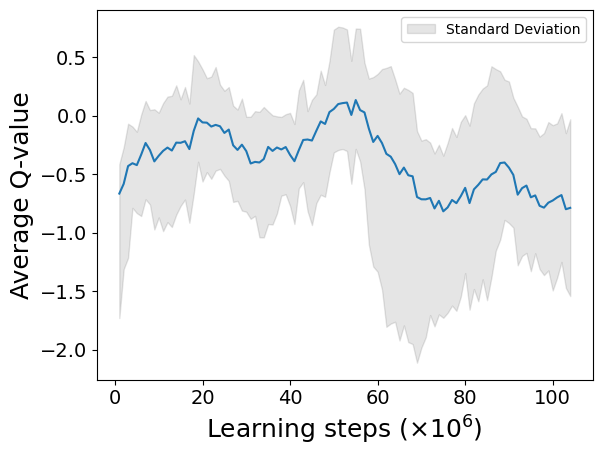

2024-07-24 12:56:47.723245: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 13:03:23.778689: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 13:20:29.805508: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:03:24.677498: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


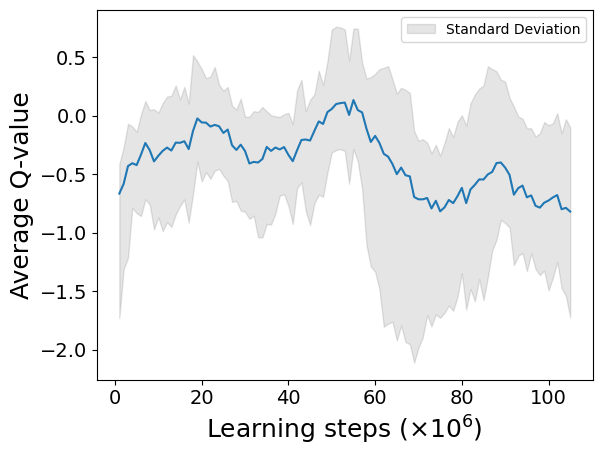

2024-07-24 14:16:45.161178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6384.0

average moving queuetime :  71.0 101.0
average stay queuetime :  273.2 388.8
average total queuetime :  344.1 489.8
average chargecount :  1.4 1.4
average ordercount :  42.1 42.1
day : 1


2024-07-24 14:33:54.763432: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:58:26.871178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


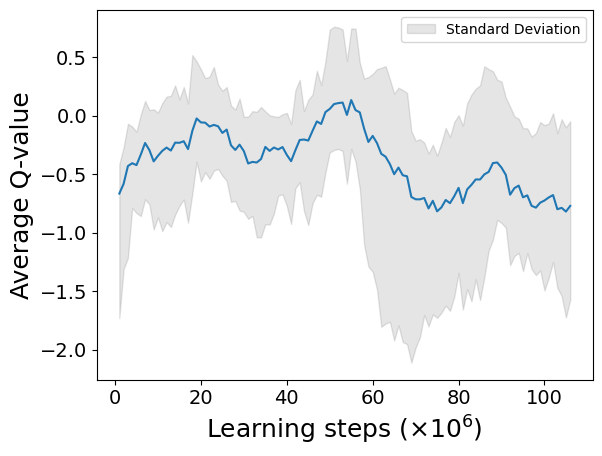

2024-07-24 15:34:25.648572: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 15:37:25.720001: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 15:51:07.351708: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6390.4

average moving queuetime :  71.9 129.7
average stay queuetime :  232.6 357.0
average total queuetime :  304.5 486.6
average chargecount :  1.6 1.8
average ordercount :  42.0 41.9
day : 2


2024-07-24 16:24:27.367740: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:34:41.264389: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:39:56.399224: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


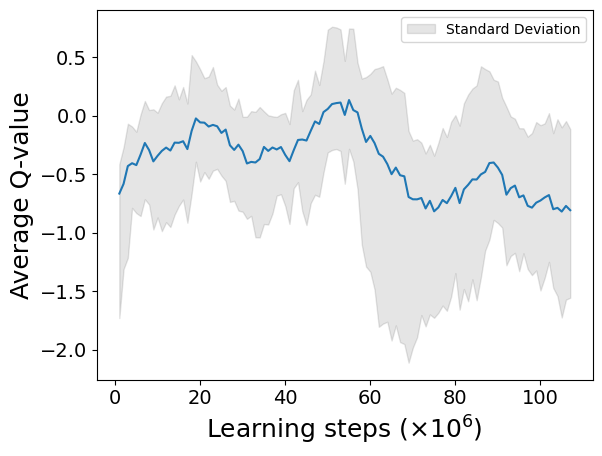

2024-07-24 16:59:00.491128: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:59:44.020100: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:00:35.609412: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:02:18.355210: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:03:14.746995: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:50:32.046080: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:55:29.916742: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:58:12.242319: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6482.7

average moving queuetime :  71.7 121.1
average stay queuetime :  248.8 475.2
average total queuetime :  320.5 596.3
average chargecount :  1.6 1.7
average ordercount :  42.0 41.9
day : 3


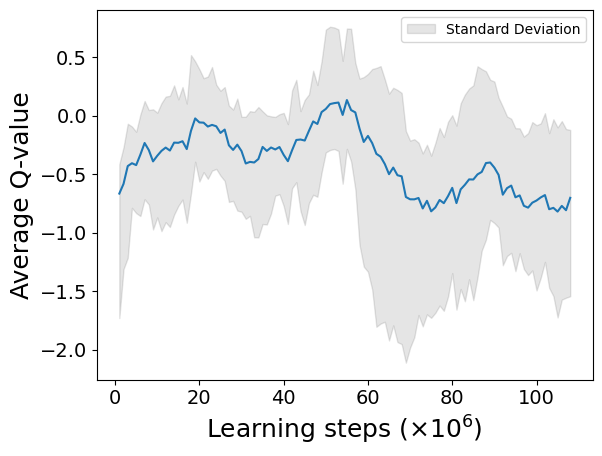

2024-07-24 18:19:04.713167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 18:19:22.647621: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


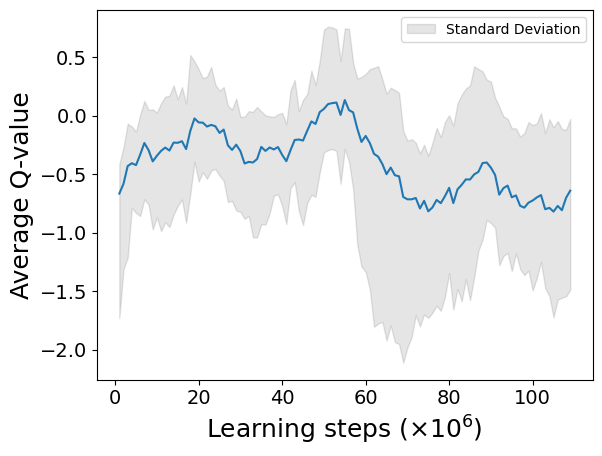

2024-07-24 19:55:03.470686: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6453.3

average moving queuetime :  71.7 121.9
average stay queuetime :  208.9 158.9
average total queuetime :  280.5 280.7
average chargecount :  1.7 1.7
average ordercount :  42.0 41.9
[32, 23, 5, 7, 25, 44, 56, 50, 37, 67, 58, 23]
[51, 40, 38, 43, 38, 45, 40, 36, 46, 70, 57, 31]
[31, 39, 40, 35, 57, 41, 33, 34, 52, 69, 64, 15]
[14, 51, 48, 40, 37, 39, 51, 31, 52, 61, 49, 37]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.905010743574591
code start to now : 529254.3
episode_reward :  538.4681733207592
fit_count :  1092546
TD max = 2.7737571669578553 TD min = 0.00010020849372273091
model updated

episode 30
day : 0


2024-07-24 20:07:09.561194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:09:09.940381: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:34:19.189757: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


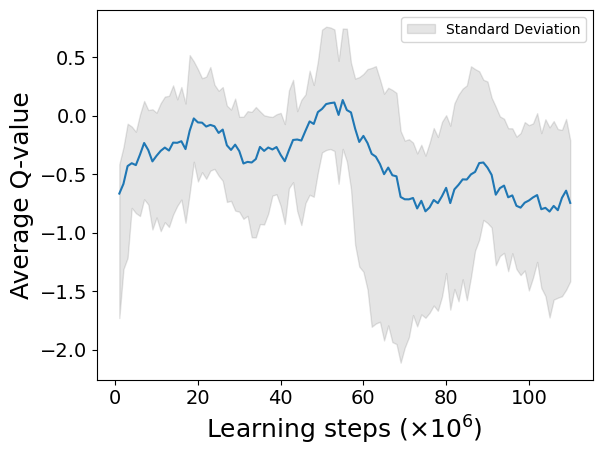

2024-07-24 21:01:12.397060: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 21:36:20.429466: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6506.0

average moving queuetime :  64.7 110.4
average stay queuetime :  127.4 217.4
average total queuetime :  192.1 327.8
average chargecount :  1.7 1.7
average ordercount :  41.8 41.8
day : 1


2024-07-24 21:53:20.071182: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 21:56:31.865585: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 22:14:21.523978: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


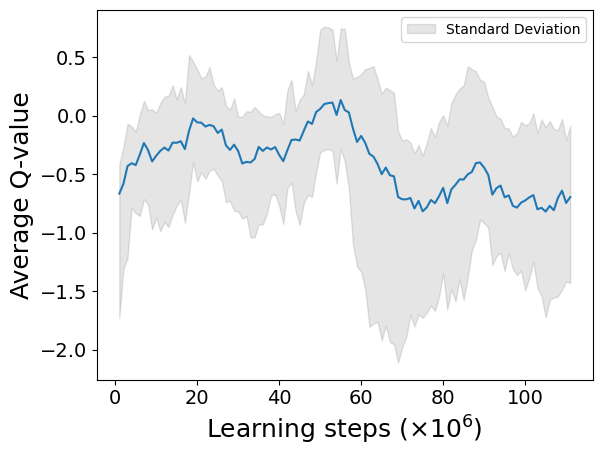

2024-07-24 22:20:53.131548: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 22:44:32.909017: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 23:04:23.393325: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 23:13:37.257748: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6374.2

average moving queuetime :  65.8 115.8
average stay queuetime :  149.9 298.4
average total queuetime :  215.7 414.2
average chargecount :  1.7 1.7
average ordercount :  41.9 41.9
day : 2


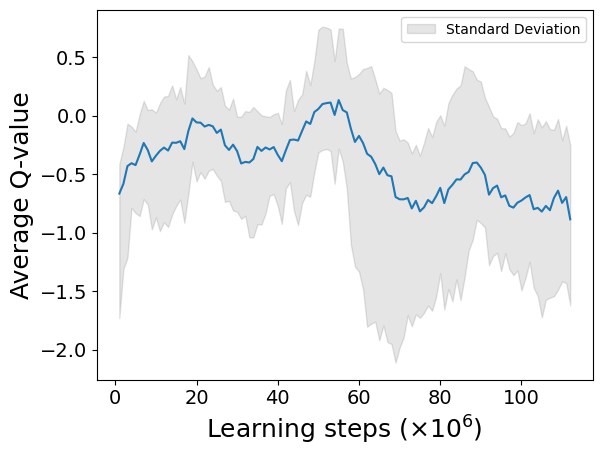

2024-07-24 23:36:45.649765: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 23:42:34.316086: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:25:00.779246: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:41:12.631096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:55:47.861883: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


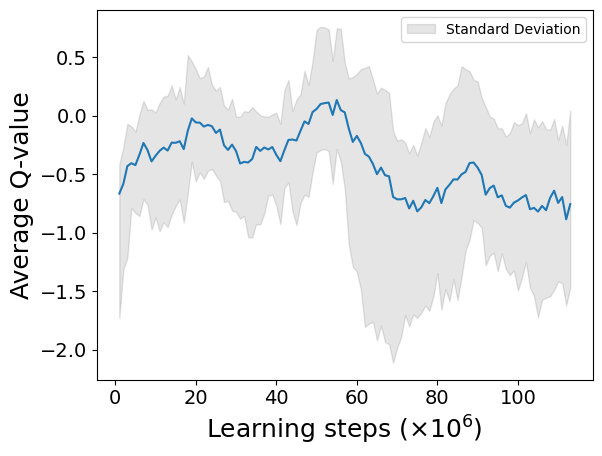

2024-07-25 01:07:57.971997: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6485.0

average moving queuetime :  66.3 113.4
average stay queuetime :  116.0 78.2
average total queuetime :  182.3 191.6
average chargecount :  1.7 1.7
average ordercount :  42.0 42.2
day : 3


2024-07-25 01:19:49.780678: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:46:44.518366: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:50:13.908357: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:57:16.647595: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:04:36.541223: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:05:54.303306: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


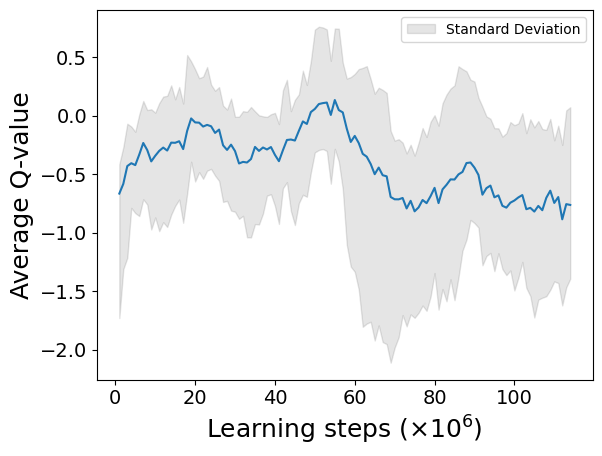

2024-07-25 02:25:31.308149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:38:38.349500: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:40:43.372783: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:04:58.163065: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6417.5

average moving queuetime :  65.8 111.9
average stay queuetime :  89.6 20.3
average total queuetime :  155.4 132.2
average chargecount :  1.7 1.7
average ordercount :  42.0 42.1
[35, 33, 46, 48, 41, 45, 43, 35, 42, 58, 59, 27]
[34, 54, 38, 29, 51, 46, 48, 35, 44, 69, 48, 24]
[32, 46, 42, 38, 39, 39, 43, 37, 57, 58, 52, 21]
[41, 48, 45, 49, 44, 18, 54, 45, 45, 59, 40, 33]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.842585677628791
code start to now : 555054.0
episode_reward :  733.3527977303912
fit_count :  1146146
TD max = 2.3675063777923584 TD min = 0.00010020849372273091
model updated

episode 31
day : 0


2024-07-25 03:20:03.278931: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:25:36.417529: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:30:47.004539: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:31:26.589789: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


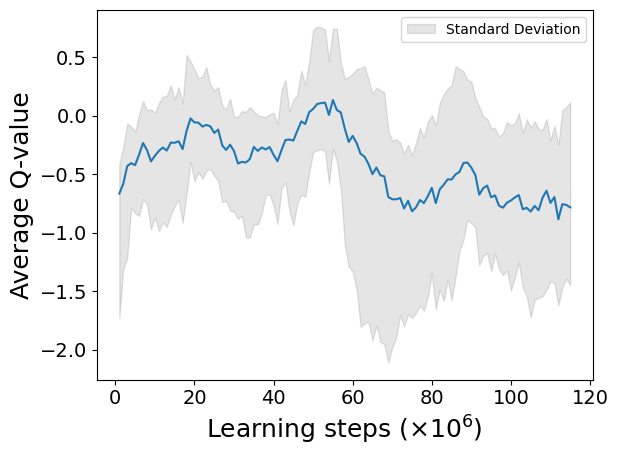

2024-07-25 04:10:08.752181: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:19:45.354733: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:44:29.381409: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:48:52.741165: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6386.4

average moving queuetime :  94.2 152.9
average stay queuetime :  840.7 1364.8
average total queuetime :  934.9 1517.6
average chargecount :  1.6 1.6
average ordercount :  41.8 41.8
day : 1


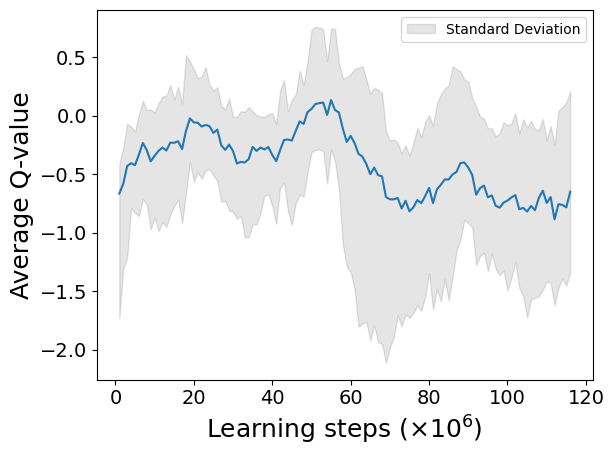

2024-07-25 05:03:29.181140: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:23:32.588949: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:23:48.458767: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:24:09.191246: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:26:28.460662: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:28:38.149669: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:37:42.035381: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 05:39:30.260254: W tensorflow/core/data/root_dataset.cc:24

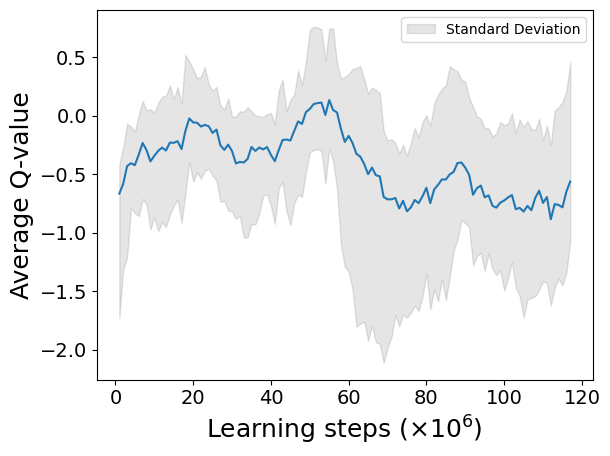

2024-07-25 06:18:25.267910: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 06:33:10.475502: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6227.5

average moving queuetime :  82.9 113.2
average stay queuetime :  559.5 431.3
average total queuetime :  642.4 544.5
average chargecount :  1.6 1.6
average ordercount :  41.7 41.7
day : 2


2024-07-25 06:36:09.688276: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 06:37:19.771154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 06:39:29.967226: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 06:42:06.118449: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:09:58.742019: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:20:27.113966: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


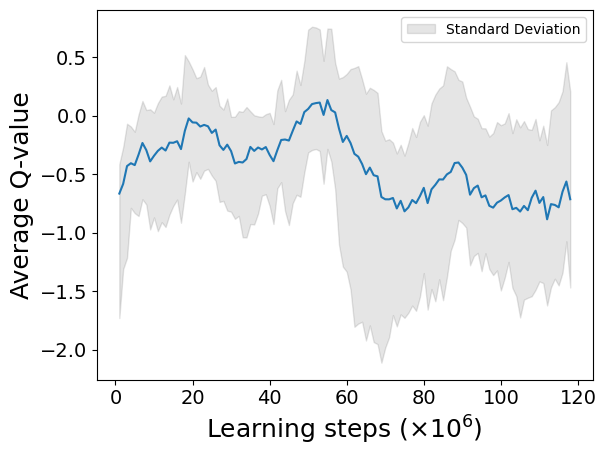

2024-07-25 07:40:38.564954: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:41:39.639812: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:42:25.498604: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6439.5

average moving queuetime :  78.6 113.9
average stay queuetime :  424.4 256.7
average total queuetime :  503.0 370.6
average chargecount :  1.6 1.6
average ordercount :  41.8 41.9
day : 3


2024-07-25 08:36:30.034302: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:53:21.893468: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


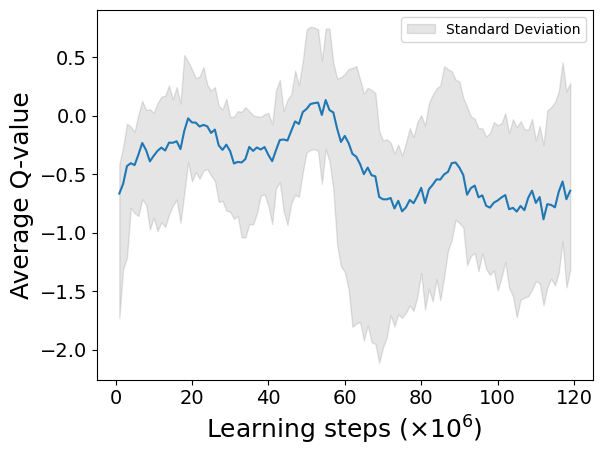

2024-07-25 08:56:52.991988: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 09:06:32.798864: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 09:14:31.386540: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 09:51:38.347324: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6354.1

average moving queuetime :  76.8 133.4
average stay queuetime :  363.4 376.8
average total queuetime :  440.1 510.3
average chargecount :  1.7 1.9
average ordercount :  41.8 41.8
[23, 30, 7, 3, 17, 52, 44, 46, 57, 53, 67, 88]
[18, 44, 7, 34, 44, 50, 28, 58, 40, 65, 54, 34]
[42, 33, 34, 49, 31, 48, 34, 43, 53, 64, 37, 20]
[68, 41, 35, 43, 59, 36, 52, 16, 49, 68, 49, 39]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  6.029245352492781
code start to now : 580480.0
episode_reward :  394.4807087397036
fit_count :  1199384
TD max = 3.421042306518555 TD min = 0.00010032782554626465
model updated

episode 32
day : 0


2024-07-25 10:31:15.450565: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


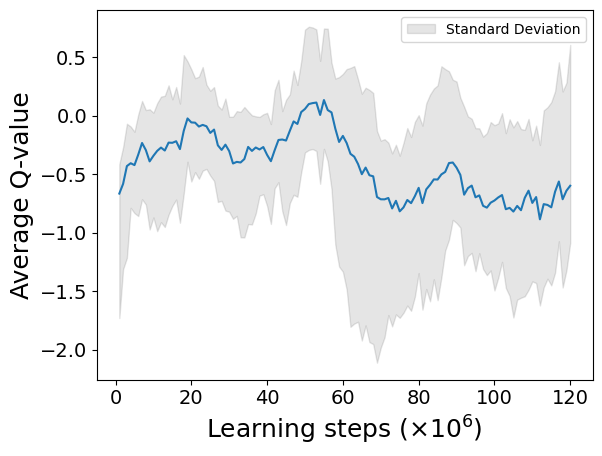

2024-07-25 10:44:23.306866: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 10:52:21.945982: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:27:11.003268: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:33:32.021192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:37:30.151192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:39:23.293527: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


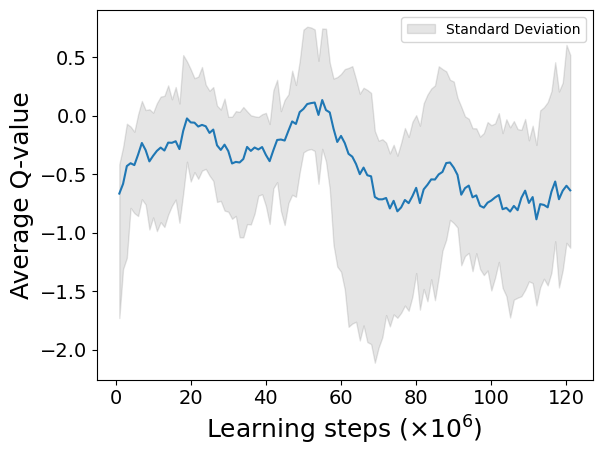

2024-07-25 12:01:09.631605: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:04:57.619434: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:14:16.255228: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7624.4

average moving queuetime :  72.6 107.7
average stay queuetime :  100.5 149.0
average total queuetime :  173.1 256.7
average chargecount :  1.5 1.5
average ordercount :  42.1 42.1
day : 1


2024-07-25 12:24:56.671195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:43:27.660598: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 13:07:23.420004: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


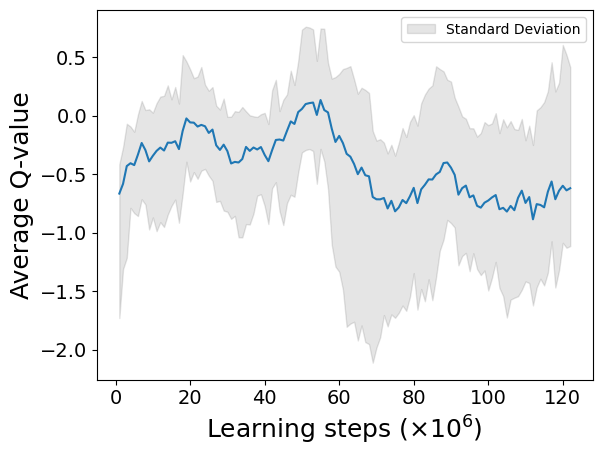

2024-07-25 13:27:53.458109: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 13:31:41.940090: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 13:35:35.404002: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 13:53:51.117158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 13:53:55.031691: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 14:01:24.739635: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 14:03:33.818357: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6444.9

average moving queuetime :  65.2 105.8
average stay queuetime :  113.1 221.1
average total queuetime :  178.3 326.8
average chargecount :  1.6 1.8
average ordercount :  42.0 42.0
day : 2


2024-07-25 14:04:11.416966: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 14:28:16.961885: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 14:40:47.520966: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 14:50:48.685837: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


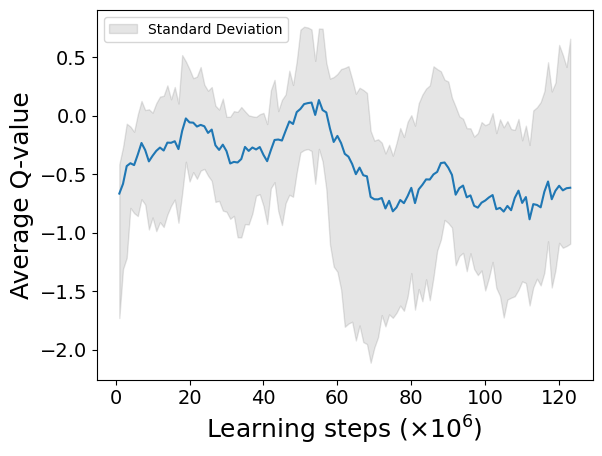

2024-07-25 15:18:55.688368: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 15:45:03.441130: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 15:51:07.691179: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7492.8

average moving queuetime :  65.2 112.6
average stay queuetime :  81.6 38.3
average total queuetime :  146.8 150.9
average chargecount :  1.7 1.7
average ordercount :  42.1 42.3
day : 3


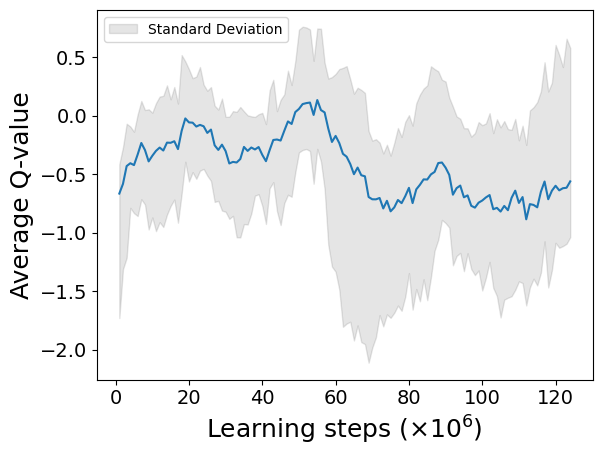

2024-07-25 16:13:19.861783: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:18:29.131168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:39:00.930458: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:43:46.551205: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:54:40.338065: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 17:12:01.091315: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 17:23:15.058584: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 17:24:04.771179: W tensorflow/core/data/root_dataset.cc:24

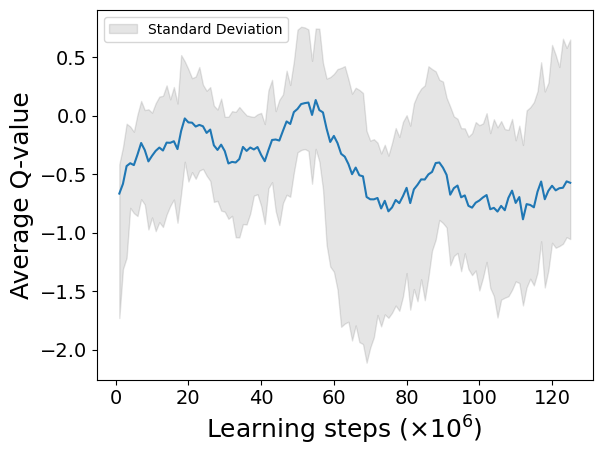

2024-07-25 17:36:16.853207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6374.1

average moving queuetime :  65.2 116.3
average stay queuetime :  71.1 73.5
average total queuetime :  136.3 189.8
average chargecount :  1.7 1.8
average ordercount :  42.1 41.9
[37, 22, 2, 5, 36, 31, 70, 46, 49, 56, 51, 40]
[67, 32, 41, 24, 38, 59, 44, 44, 49, 55, 61, 23]
[41, 41, 35, 43, 43, 43, 44, 57, 43, 52, 52, 25]
[55, 37, 39, 49, 36, 29, 58, 35, 57, 63, 43, 32]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.840268158435619
code start to now : 608432.8
episode_reward :  798.0570299554907
fit_count :  1253015
TD max = 3.421042306518555 TD min = 0.00010033974647517532
best model updated
model updated

episode 33
day : 0


2024-07-25 18:01:33.980247: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:20:05.334941: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:32:04.701276: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:33:56.723407: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:40:48.262926: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:45:05.518282: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:47:21.409866: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:50:18.017379: W tensorflow/core/data/root_dataset.cc:24

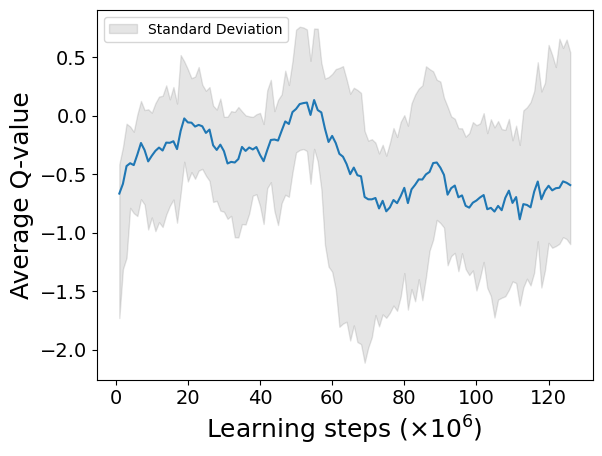

2024-07-25 19:27:30.315897: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 19:30:14.516176: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 19:32:40.389596: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6319.3

average moving queuetime :  81.5 114.6
average stay queuetime :  162.8 229.0
average total queuetime :  244.3 343.7
average chargecount :  1.4 1.4
average ordercount :  41.9 41.9
day : 1


2024-07-25 19:45:56.845064: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


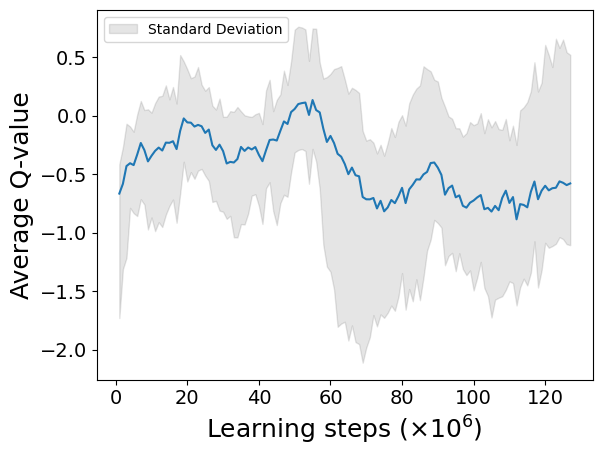

2024-07-25 20:32:28.562409: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 20:39:33.911151: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 20:44:58.052550: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 20:57:25.576197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:01:32.189265: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:12:27.651199: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:14:58.350644: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:18:52.866937: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6418.3

average moving queuetime :  69.9 108.1
average stay queuetime :  119.8 152.6
average total queuetime :  189.7 260.7
average chargecount :  1.6 1.8
average ordercount :  41.8 41.7
day : 2


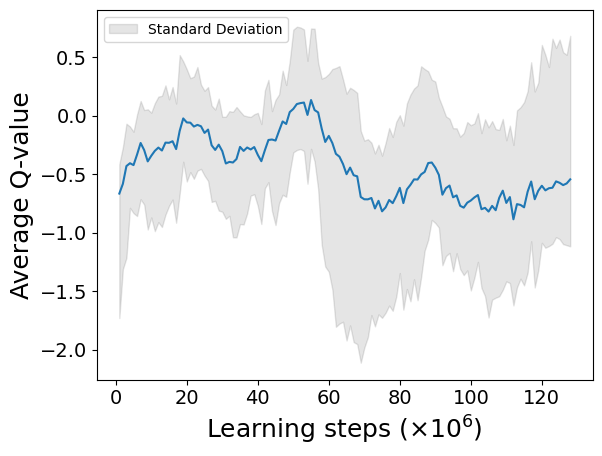

2024-07-25 21:33:25.877863: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:41:46.088127: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 22:29:10.424987: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 22:32:55.625930: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 22:41:51.792213: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


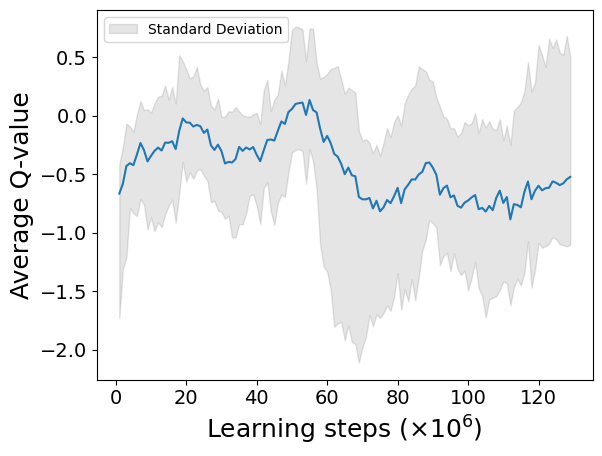

2024-07-25 23:01:32.450407: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 23:03:32.508751: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6412.4

average moving queuetime :  65.1 97.3
average stay queuetime :  79.4 8.7
average total queuetime :  144.5 106.0
average chargecount :  1.6 1.7
average ordercount :  41.9 42.2
day : 3


2024-07-25 23:27:01.730045: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 23:31:15.148311: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 23:57:25.170708: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


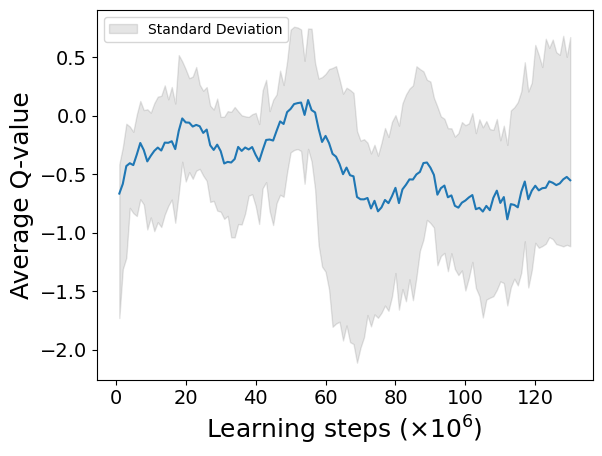

2024-07-26 00:16:13.130635: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 00:16:25.064697: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 00:33:07.131157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 00:33:23.701105: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 00:39:18.009957: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 00:49:14.647531: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 00:51:25.999016: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6545.1

average moving queuetime :  66.1 121.3
average stay queuetime :  71.9 89.2
average total queuetime :  138.0 210.5
average chargecount :  1.7 1.8
average ordercount :  42.0 42.1
[32, 16, 13, 2, 25, 42, 44, 55, 51, 56, 58, 28]
[71, 23, 30, 33, 56, 48, 27, 60, 41, 66, 43, 36]
[63, 25, 41, 36, 43, 35, 39, 49, 56, 58, 41, 33]
[61, 37, 35, 47, 41, 53, 42, 32, 45, 68, 45, 21]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.828142361933598
code start to now : 634144.6
episode_reward :  771.1119204346232
fit_count :  1306512
TD max = 2.0921120108127598 TD min = 0.00010042915344256045
model updated

episode 34
day : 0


2024-07-26 01:07:44.899849: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


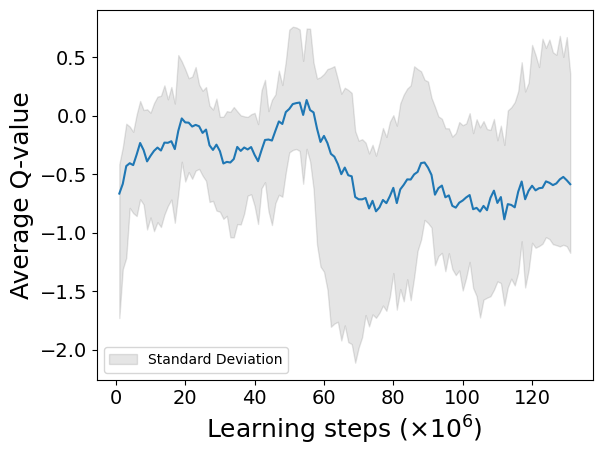

2024-07-26 02:09:50.259520: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 02:40:00.271190: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 02:56:46.979722: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:04:07.631470: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7501.9

average moving queuetime :  69.7 110.5
average stay queuetime :  322.3 511.3
average total queuetime :  391.9 621.9
average chargecount :  1.6 1.6
average ordercount :  41.9 41.9
day : 1


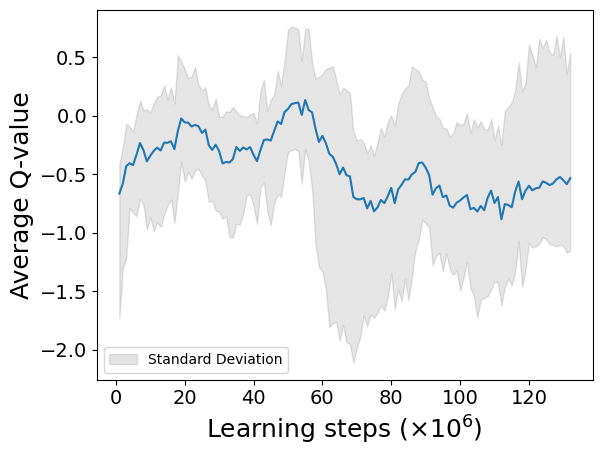

2024-07-26 03:28:12.868714: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:29:12.841196: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:38:25.021171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:38:45.281151: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:47:15.498301: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:51:32.999133: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:52:00.165574: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:52:17.645421: W tensorflow/core/data/root_dataset.cc:24

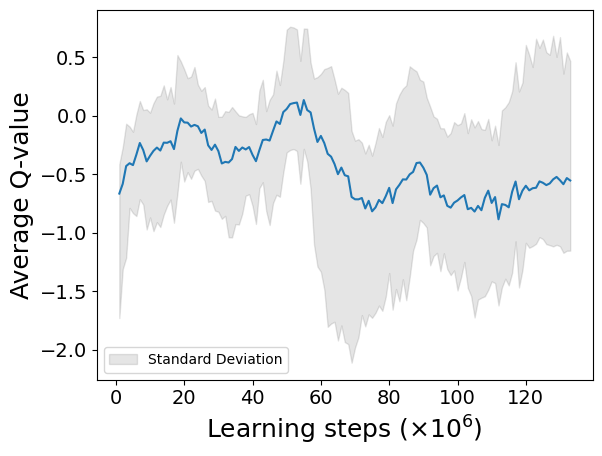

2024-07-26 04:54:29.689161: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6404.1

average moving queuetime :  69.0 112.0
average stay queuetime :  204.7 148.5
average total queuetime :  273.8 260.6
average chargecount :  1.6 1.6
average ordercount :  42.1 42.2
day : 2


2024-07-26 04:57:49.735457: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:11:35.680828: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:15:39.386159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:24:17.583169: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


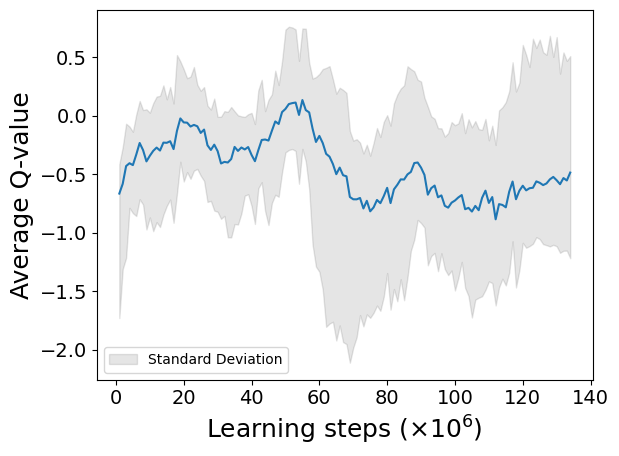

2024-07-26 05:56:49.087401: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:01:19.231122: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:09:43.837708: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:12:23.841313: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:26:36.256920: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:31:05.801171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:41:31.751118: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6365.3

average moving queuetime :  70.3 128.0
average stay queuetime :  178.2 228.9
average total queuetime :  248.5 356.9
average chargecount :  1.7 1.8
average ordercount :  42.0 41.9
day : 3


2024-07-26 06:52:13.615687: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 07:01:34.819225: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 07:01:52.968286: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


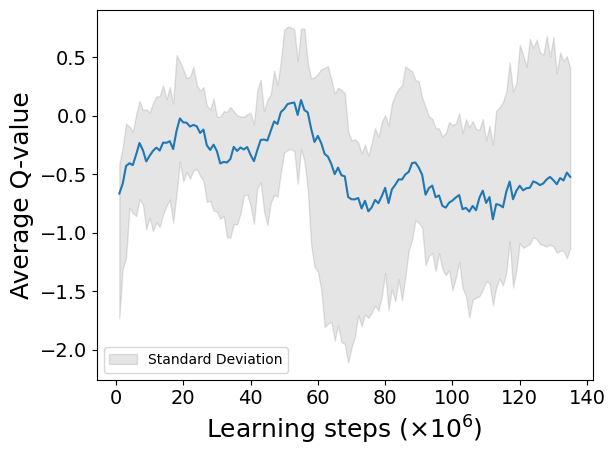

2024-07-26 07:53:51.791037: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 07:58:23.375706: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 08:03:04.580131: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 08:23:36.961174: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


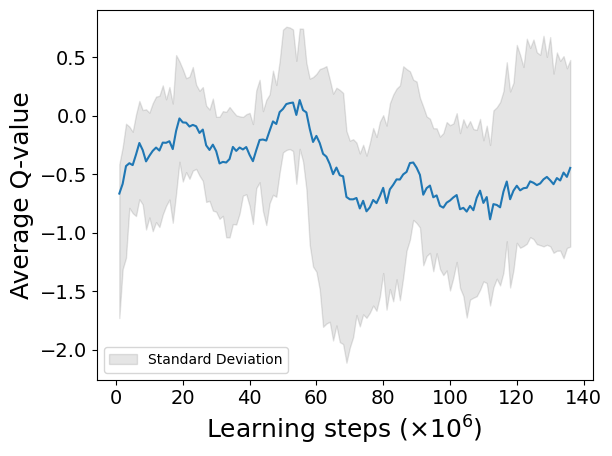


 time for simulate one day : 6423.0

average moving queuetime :  68.4 110.6
average stay queuetime :  167.2 239.5
average total queuetime :  235.6 350.1
average chargecount :  1.7 1.8
average ordercount :  42.0 42.1
[35, 23, 13, 13, 42, 36, 42, 51, 56, 59, 56, 50]
[27, 29, 35, 43, 43, 38, 52, 34, 57, 53, 59, 21]
[41, 36, 42, 49, 38, 54, 35, 35, 49, 63, 54, 33]
[68, 23, 37, 31, 49, 54, 32, 47, 34, 69, 50, 34]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.919292100433962
code start to now : 660856.2
episode_reward :  658.0123292288422
fit_count :  1360094
TD max = 2.4752664888858797 TD min = 0.00010015258789076711
model updated

episode 35
day : 0


2024-07-26 08:58:54.041759: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:14:48.969620: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:30:02.355260: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:32:11.526297: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:34:40.671169: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


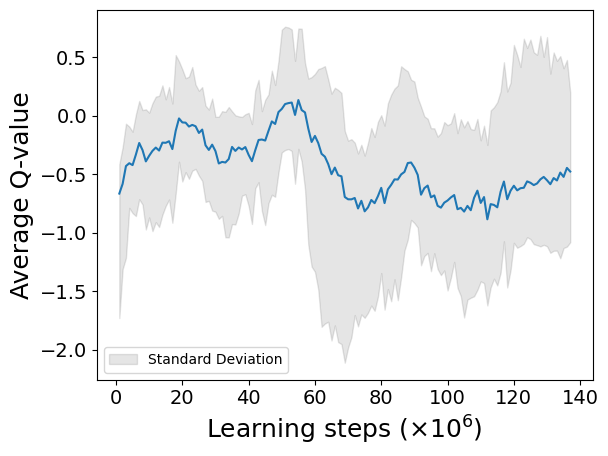


 time for simulate one day : 6334.3

average moving queuetime :  63.7 96.0
average stay queuetime :  210.4 317.1
average total queuetime :  274.1 413.0
average chargecount :  1.5 1.5
average ordercount :  42.0 42.0
day : 1


2024-07-26 10:31:30.653510: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 10:55:25.797972: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 11:00:44.540009: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


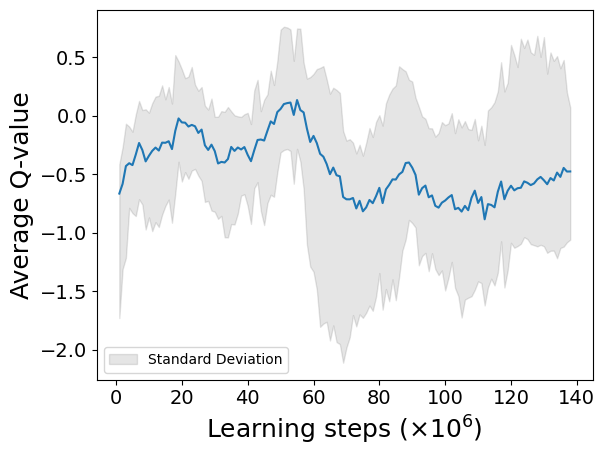

2024-07-26 11:22:14.738390: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 11:37:11.902405: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6459.7

average moving queuetime :  57.2 84.7
average stay queuetime :  100.4 0.3
average total queuetime :  157.6 85.0
average chargecount :  1.6 1.7
average ordercount :  42.1 42.2
day : 2


2024-07-26 12:11:09.101134: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:13:12.393004: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:24:10.438233: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:26:37.771512: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


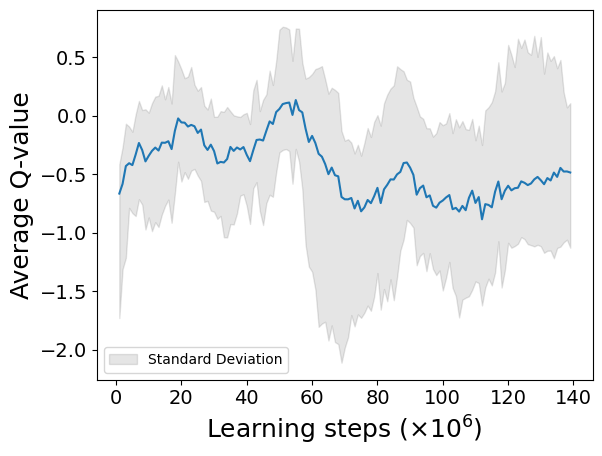

2024-07-26 12:34:49.420751: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:36:18.422979: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:41:37.365091: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:50:14.474580: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:52:31.959740: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:09:03.081152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:12:19.780113: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:18:34.769996: W tensorflow/core/data/root_dataset.cc:24

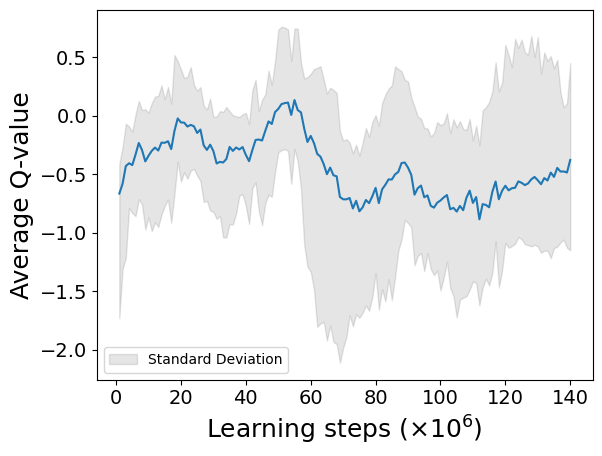


 time for simulate one day : 6598.9

average moving queuetime :  59.8 116.7
average stay queuetime :  113.0 244.5
average total queuetime :  172.8 361.2
average chargecount :  1.7 1.8
average ordercount :  42.1 42.0
day : 3


2024-07-26 13:57:08.212630: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:58:32.977573: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 14:11:26.307627: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 14:21:07.601204: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 14:30:42.009550: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 14:46:14.741123: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


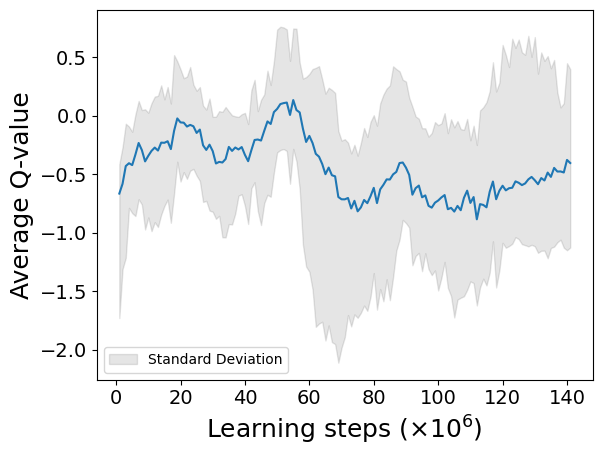

2024-07-26 15:21:18.307546: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:25:05.621236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:26:33.197744: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6365.8

average moving queuetime :  59.4 99.9
average stay queuetime :  98.3 95.7
average total queuetime :  157.8 195.7
average chargecount :  1.7 1.7
average ordercount :  42.0 42.0
[44, 15, 3, 20, 40, 30, 49, 55, 37, 63, 64, 32]
[34, 38, 39, 41, 44, 41, 41, 55, 37, 59, 47, 20]
[57, 48, 36, 44, 45, 41, 48, 37, 47, 64, 56, 21]
[51, 35, 41, 39, 58, 34, 39, 40, 45, 55, 56, 21]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.838074967972273
code start to now : 686631.8
episode_reward :  767.4655734025305
fit_count :  1413687
TD max = 2.3900047231674195 TD min = 0.00010051498413089491
model updated

episode 36
day : 0


2024-07-26 15:48:44.531431: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:54:21.050341: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 16:18:25.935140: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


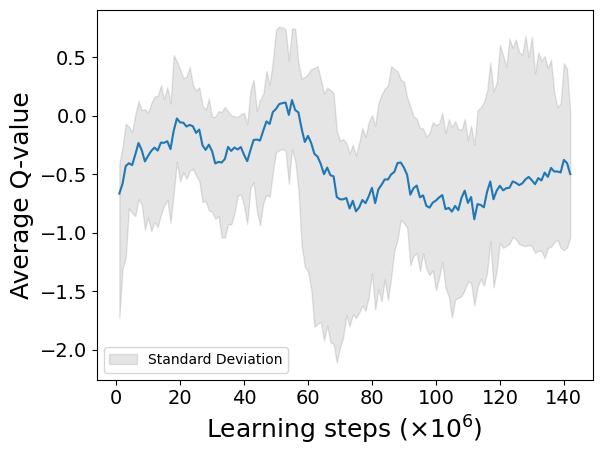

2024-07-26 16:46:00.187397: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6428.9

average moving queuetime :  70.5 102.5
average stay queuetime :  188.1 273.3
average total queuetime :  258.6 375.8
average chargecount :  1.5 1.5
average ordercount :  41.9 41.9
day : 1


2024-07-26 17:29:53.946428: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 17:30:24.441111: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 17:37:26.761203: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


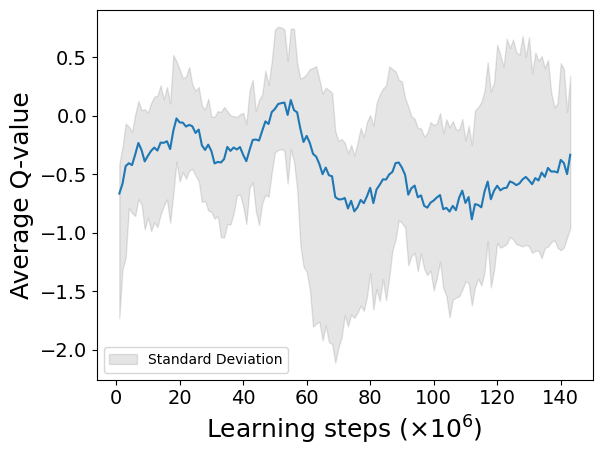

2024-07-26 17:55:19.560075: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 19:01:44.365760: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


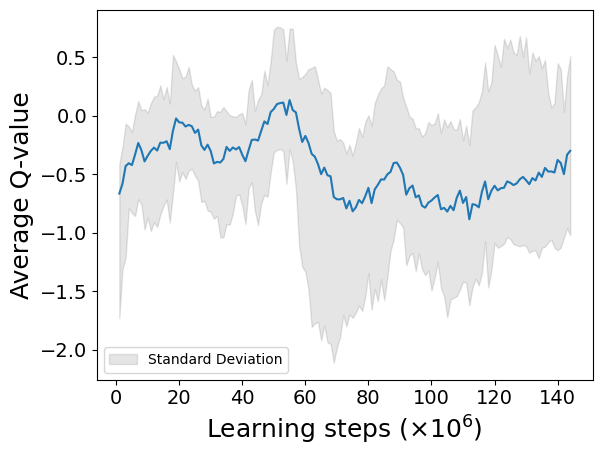


 time for simulate one day : 6357.4

average moving queuetime :  69.4 114.1
average stay queuetime :  196.9 341.6
average total queuetime :  266.3 455.8
average chargecount :  1.6 1.7
average ordercount :  41.8 41.8
day : 2


2024-07-26 19:41:39.325416: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:16:22.431181: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


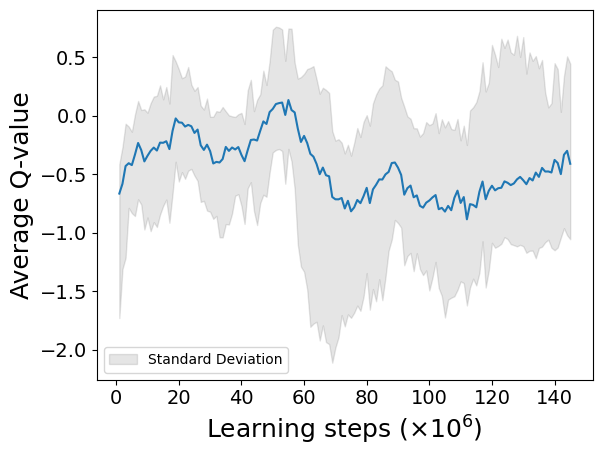

2024-07-26 20:34:20.461112: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6444.2

average moving queuetime :  68.4 119.6
average stay queuetime :  206.9 402.1
average total queuetime :  275.2 521.7
average chargecount :  1.6 1.8
average ordercount :  41.9 41.9
day : 3


2024-07-26 21:02:38.211117: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:03:32.180865: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:18:35.177208: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:23:13.443435: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:27:17.349571: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:31:11.198100: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:49:11.411195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:54:16.837285: W tensorflow/core/data/root_dataset.cc:24

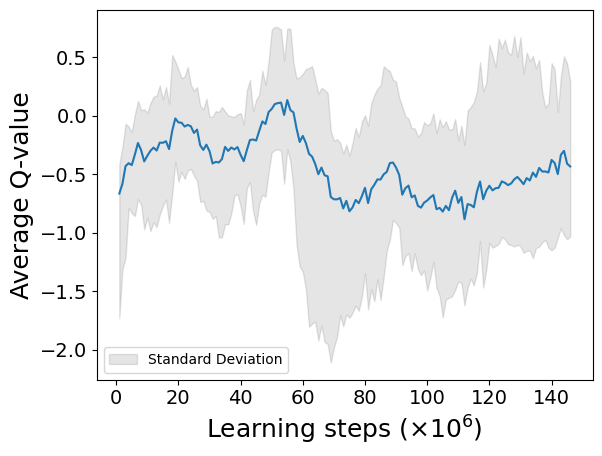

2024-07-26 22:29:27.098525: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7514.3

average moving queuetime :  69.3 123.6
average stay queuetime :  179.4 172.3
average total queuetime :  248.7 295.9
average chargecount :  1.7 1.7
average ordercount :  41.9 42.0
[34, 17, 11, 2, 24, 61, 34, 51, 43, 64, 60, 35]
[53, 21, 37, 32, 46, 44, 39, 36, 56, 66, 49, 22]
[68, 19, 23, 58, 47, 43, 40, 44, 39, 73, 58, 26]
[51, 14, 39, 46, 50, 61, 24, 30, 57, 60, 58, 24]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.899459088236146
code start to now : 713394.1
episode_reward :  626.6618394927741
fit_count :  1467079
TD max = 2.0112105966567997 TD min = 0.00010051498413089491
model updated

episode 37
day : 0


2024-07-26 23:08:55.252548: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:09:27.644502: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


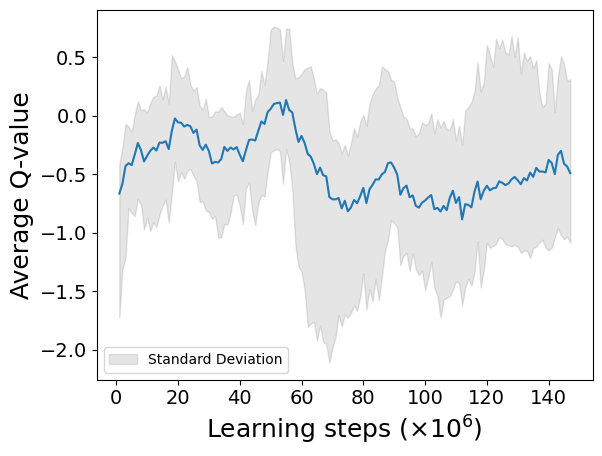

2024-07-26 23:30:58.930300: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:46:03.142239: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:07:41.862542: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:20:21.963873: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:22:03.761145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:28:33.483182: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:43:07.231177: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:43:24.866538: W tensorflow/core/data/root_dataset.cc:24

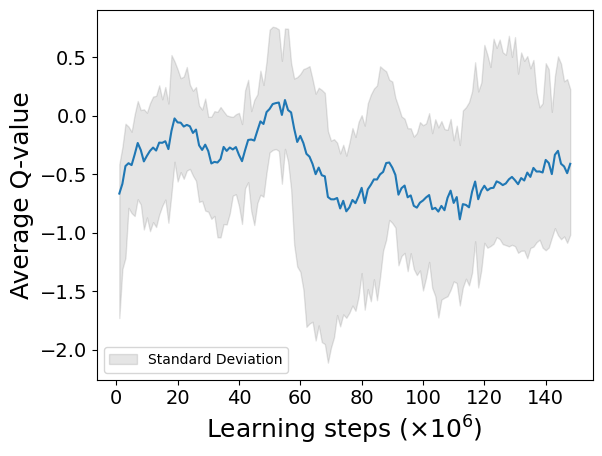


 time for simulate one day : 6368.7

average moving queuetime :  73.9 110.1
average stay queuetime :  148.8 221.7
average total queuetime :  222.7 331.8
average chargecount :  1.5 1.5
average ordercount :  41.9 41.9
day : 1


2024-07-27 00:50:47.033490: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:01:56.417736: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:10:24.185371: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:22:34.811207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:30:24.751271: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:43:49.601320: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


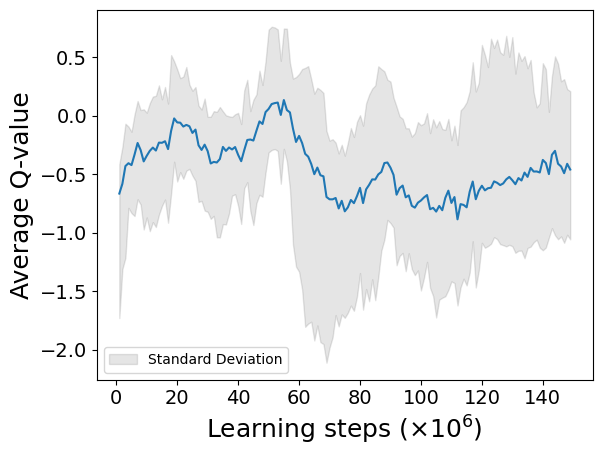

2024-07-27 02:10:06.331130: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 02:19:28.960390: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 02:19:56.394574: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 02:22:10.060734: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 02:22:48.251184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6339.5

average moving queuetime :  72.6 120.4
average stay queuetime :  233.8 521.0
average total queuetime :  306.3 641.4
average chargecount :  1.6 1.7
average ordercount :  41.8 41.6
day : 2


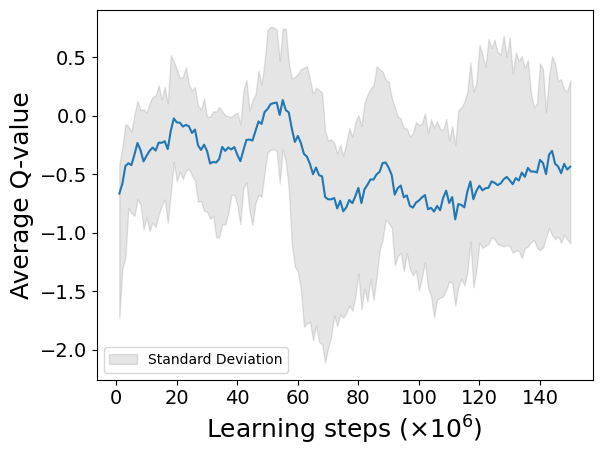

2024-07-27 03:30:25.070013: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:43:56.883452: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:50:21.034592: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:16:30.837650: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:20:13.699050: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6516.3

average moving queuetime :  66.1 94.9
average stay queuetime :  155.7 23.7
average total queuetime :  221.7 118.6
average chargecount :  1.6 1.7
average ordercount :  41.9 42.1
day : 3


2024-07-27 04:26:45.528219: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 05:02:30.010252: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


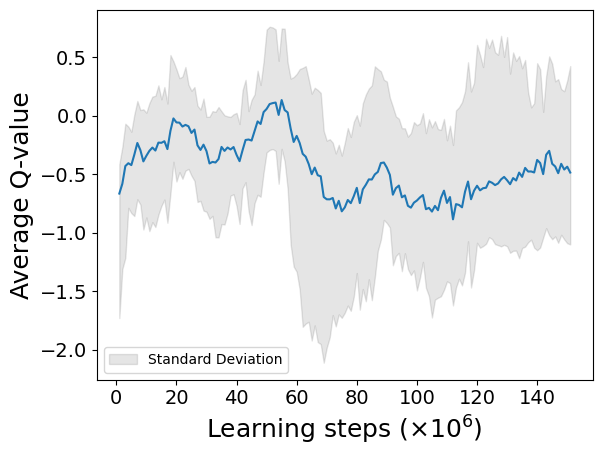

2024-07-27 05:11:40.121931: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 05:20:08.139238: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 05:28:06.741147: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 05:29:59.971198: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


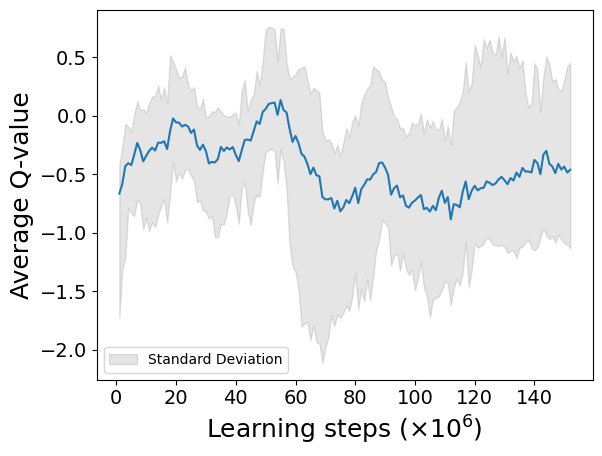


 time for simulate one day : 7505.2

average moving queuetime :  68.0 131.2
average stay queuetime :  142.5 191.5
average total queuetime :  210.5 322.8
average chargecount :  1.7 1.8
average ordercount :  41.9 42.0
[47, 13, 1, 5, 28, 46, 54, 46, 46, 58, 58, 45]
[59, 14, 29, 55, 41, 30, 44, 38, 57, 68, 49, 22]
[74, 22, 27, 42, 56, 39, 52, 42, 36, 57, 50, 27]
[54, 39, 44, 40, 45, 42, 35, 45, 56, 58, 50, 31]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.889957221785205
code start to now : 740140.8
episode_reward :  654.5866229014623
fit_count :  1520520
TD max = 2.0112105966567997 TD min = 0.00010014245510104872
model updated

episode 38
day : 0


2024-07-27 06:34:36.166913: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:06:01.655599: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:07:36.532783: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:33:58.215229: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:37:08.053955: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:56:41.049249: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


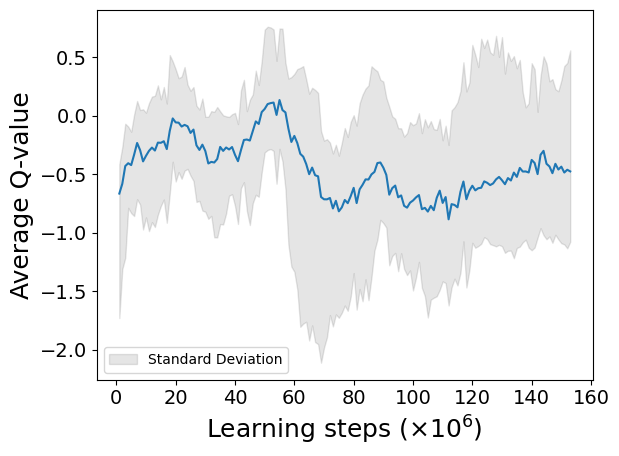

2024-07-27 08:17:40.849248: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:18:40.645862: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:20:10.941212: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:26:49.274652: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:26:54.362797: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7432.8

average moving queuetime :  78.8 118.4
average stay queuetime :  255.9 384.7
average total queuetime :  334.6 503.1
average chargecount :  1.5 1.5
average ordercount :  41.9 41.9
day : 1


2024-07-27 08:38:21.405340: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 09:05:36.032524: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


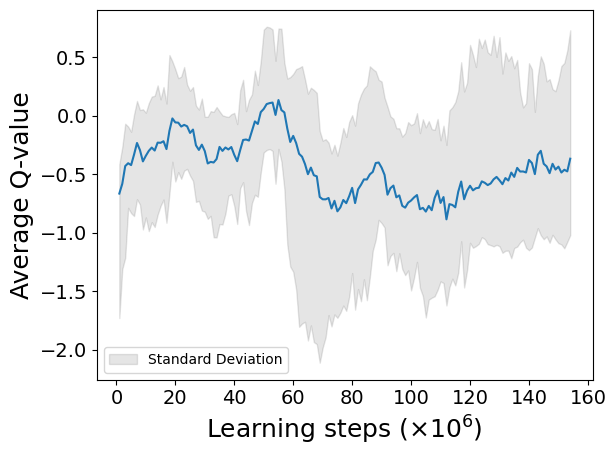

2024-07-27 09:54:20.051118: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6334.7

average moving queuetime :  77.5 131.1
average stay queuetime :  409.7 934.6
average total queuetime :  487.2 1065.7
average chargecount :  1.6 1.7
average ordercount :  41.5 41.0
day : 2


2024-07-27 10:23:08.628652: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 10:30:48.571152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


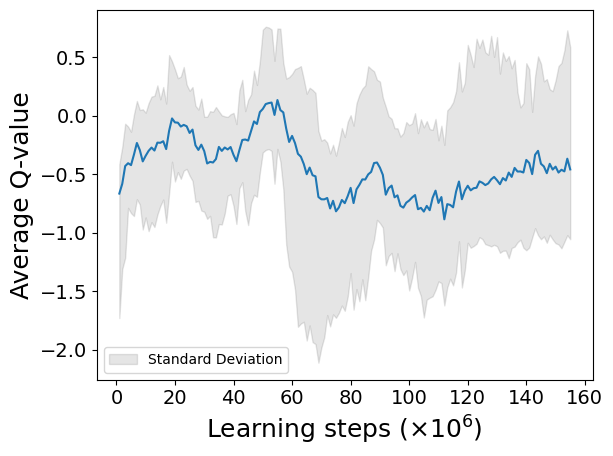

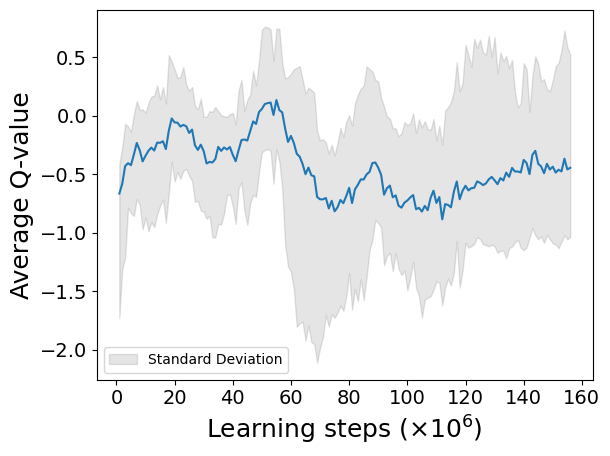


 time for simulate one day : 6739.0

average moving queuetime :  70.9 95.3
average stay queuetime :  274.9 16.7
average total queuetime :  345.8 112.0
average chargecount :  1.6 1.6
average ordercount :  41.6 41.8
day : 3


2024-07-27 12:14:51.821250: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 12:24:27.000816: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 13:20:13.376772: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 13:37:31.321125: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 13:37:35.335462: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


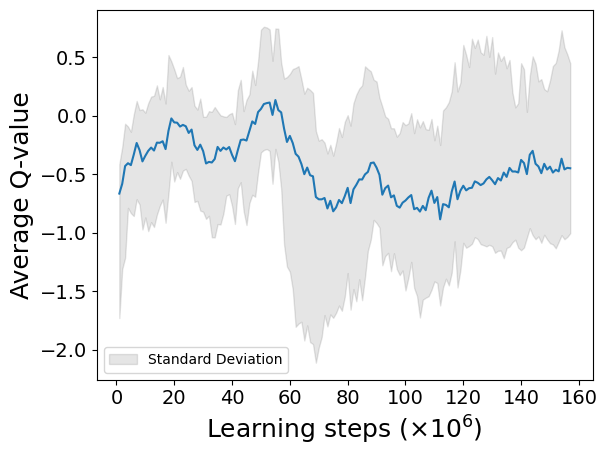


 time for simulate one day : 6908.0

average moving queuetime :  71.7 125.8
average stay queuetime :  237.9 225.4
average total queuetime :  309.6 351.2
average chargecount :  1.6 1.7
average ordercount :  41.7 41.8
[43, 14, 3, 4, 41, 35, 61, 40, 44, 60, 58, 48]
[49, 23, 29, 44, 60, 26, 40, 30, 70, 75, 47, 22]
[33, 44, 27, 33, 46, 63, 34, 49, 41, 51, 50, 21]
[36, 50, 48, 44, 38, 28, 45, 54, 46, 67, 38, 17]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.8822524452204235
code start to now : 767573.3
episode_reward :  444.4715465821482
fit_count :  1573603
TD max = 2.8455270124435423 TD min = 0.00010014245510104872
model updated

episode 39
day : 0


2024-07-27 15:00:41.048184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


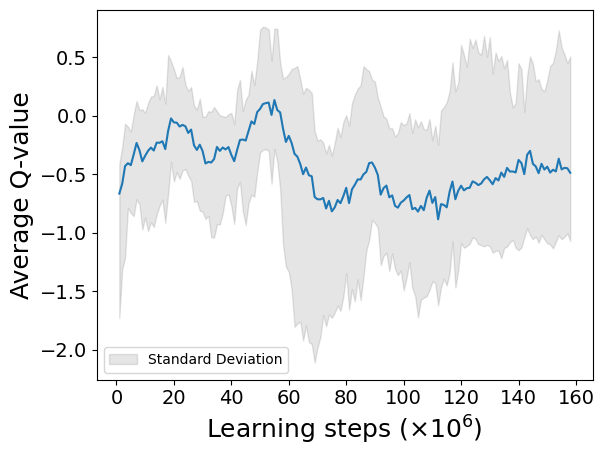

2024-07-27 15:08:48.758743: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6762.4

average moving queuetime :  75.3 113.4
average stay queuetime :  385.4 580.7
average total queuetime :  460.7 694.1
average chargecount :  1.5 1.5
average ordercount :  41.7 41.7
day : 1


2024-07-27 16:08:13.731309: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 16:22:57.402404: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


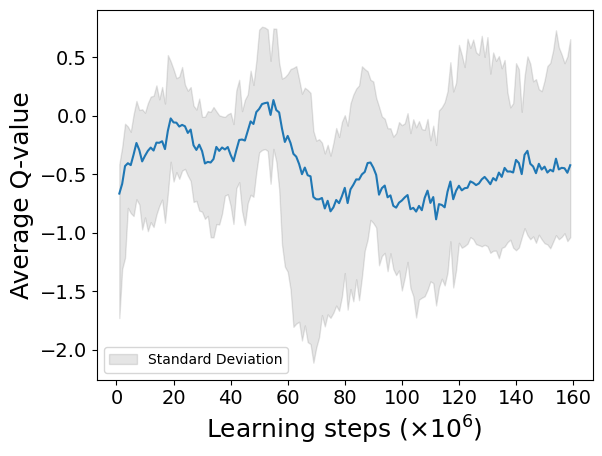

2024-07-27 16:32:12.495061: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:07:30.175964: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:10:46.301224: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:15:24.473924: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:17:47.525319: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:19:34.101259: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:20:42.551001: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:31:41.372562: W tensorflow/core/data/root_dataset.cc:24

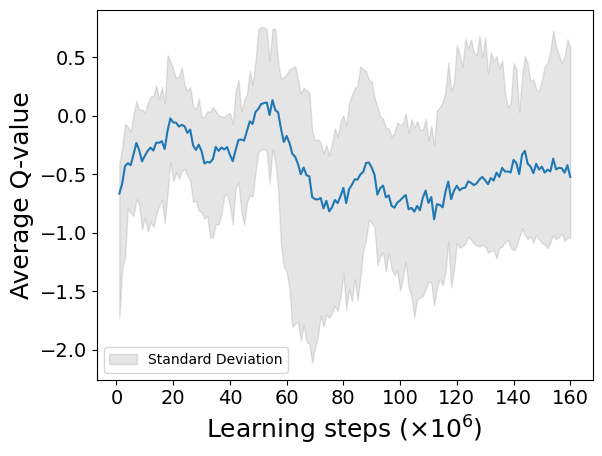


 time for simulate one day : 6597.2

average moving queuetime :  69.5 104.5
average stay queuetime :  200.0 46.1
average total queuetime :  269.6 150.5
average chargecount :  1.6 1.6
average ordercount :  41.9 42.1
day : 2


2024-07-27 17:57:32.192017: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 18:21:24.625244: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 18:30:02.991236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 18:42:12.701810: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:03:11.321270: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:09:21.321167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:09:53.446943: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


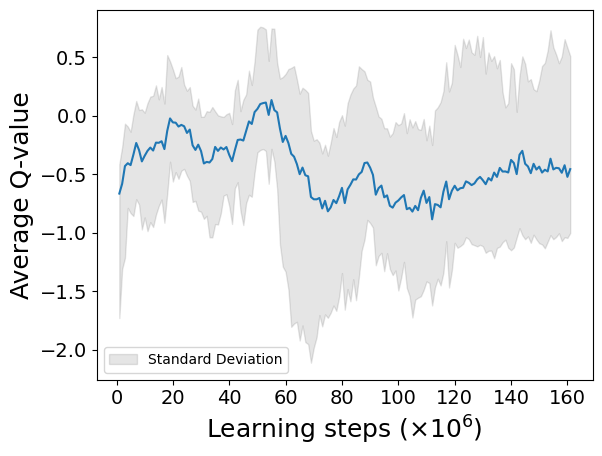

2024-07-27 19:18:43.095642: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 19:25:14.299485: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6410.3

average moving queuetime :  69.2 122.4
average stay queuetime :  162.9 174.9
average total queuetime :  232.1 297.3
average chargecount :  1.6 1.8
average ordercount :  42.0 42.1
day : 3


2024-07-27 19:38:40.131135: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:00:24.680121: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:11:06.124113: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:18:29.119954: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


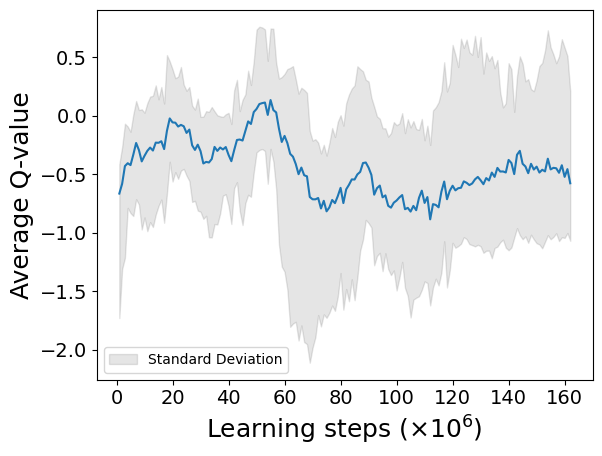

2024-07-27 20:35:13.521192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:38:06.935585: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:52:34.239429: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:53:12.855499: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:53:20.381197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 21:06:11.620317: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 21:14:03.159678: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 21:17:13.440391: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6442.0

average moving queuetime :  68.3 113.9
average stay queuetime :  153.4 217.8
average total queuetime :  221.7 331.7
average chargecount :  1.7 1.7
average ordercount :  42.0 42.1
[37, 18, 12, 7, 26, 60, 35, 42, 48, 64, 68, 35]
[43, 27, 43, 34, 33, 28, 53, 51, 48, 58, 45, 25]
[60, 40, 37, 53, 33, 34, 51, 38, 47, 61, 60, 22]
[44, 38, 30, 48, 54, 36, 32, 45, 42, 58, 58, 33]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.913427970427291
code start to now : 793802.2
episode_reward :  686.0983118143126
fit_count :  1627117
TD max = 2.8455270124435423 TD min = 0.00010024318695057702
model updated

episode 40
day : 0


2024-07-27 21:43:06.565895: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 21:45:55.710756: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


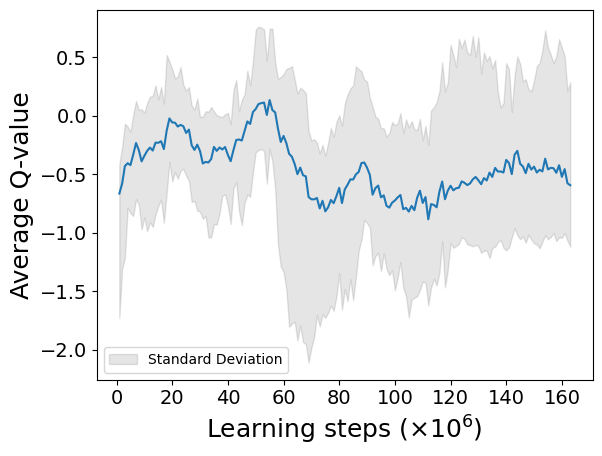

2024-07-27 21:53:27.132285: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:01:07.731218: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:06:51.281170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:27:38.252430: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:41:46.454587: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:47:05.684318: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:56:43.141916: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


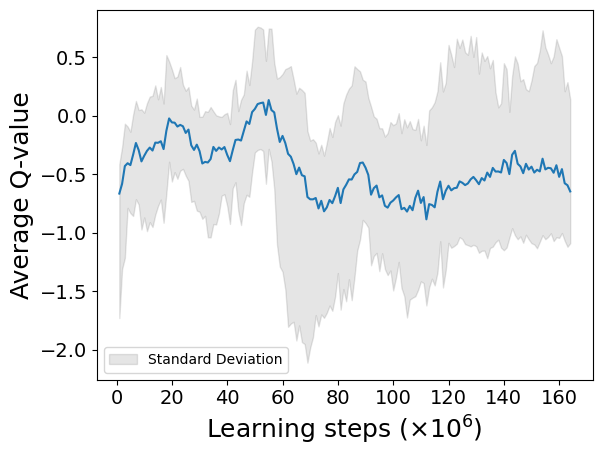


 time for simulate one day : 6430.9

average moving queuetime :  67.3 115.5
average stay queuetime :  105.5 181.1
average total queuetime :  172.8 296.6
average chargecount :  1.7 1.7
average ordercount :  41.8 41.8
day : 1


2024-07-27 23:23:02.380567: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:29:11.710687: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:30:19.000630: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:48:10.931206: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:01:23.315913: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:04:34.130790: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:06:31.807610: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:15:32.451338: W tensorflow/core/data/root_dataset.cc:24

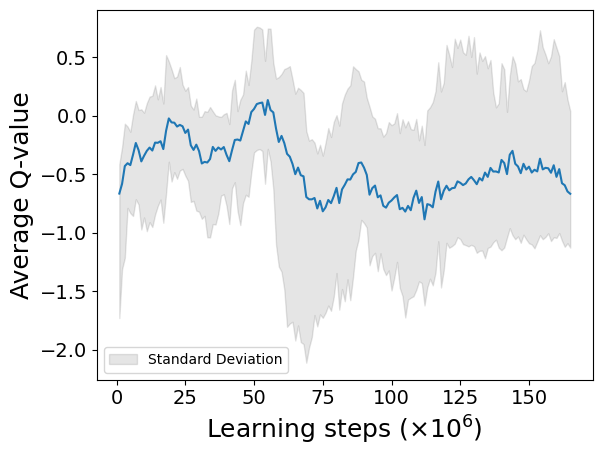


 time for simulate one day : 6337.5

average moving queuetime :  70.2 130.8
average stay queuetime :  206.0 541.4
average total queuetime :  276.3 672.2
average chargecount :  1.8 1.8
average ordercount :  41.8 41.9
day : 2


2024-07-28 01:45:41.451184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


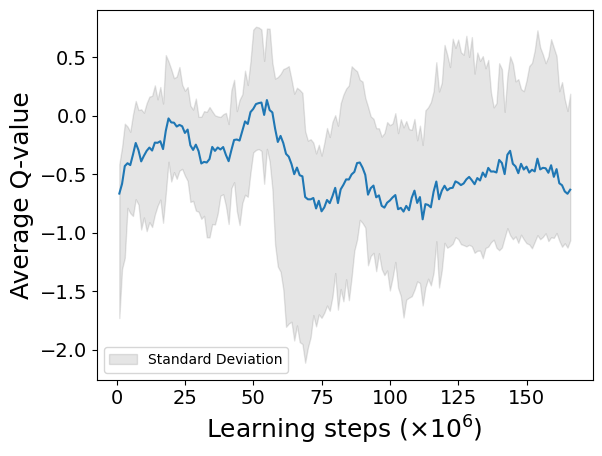

2024-07-28 02:16:09.077493: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6323.7

average moving queuetime :  70.3 114.9
average stay queuetime :  169.1 146.9
average total queuetime :  239.4 261.8
average chargecount :  1.7 1.6
average ordercount :  41.8 41.9
day : 3


2024-07-28 02:49:09.797830: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 03:03:17.278972: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


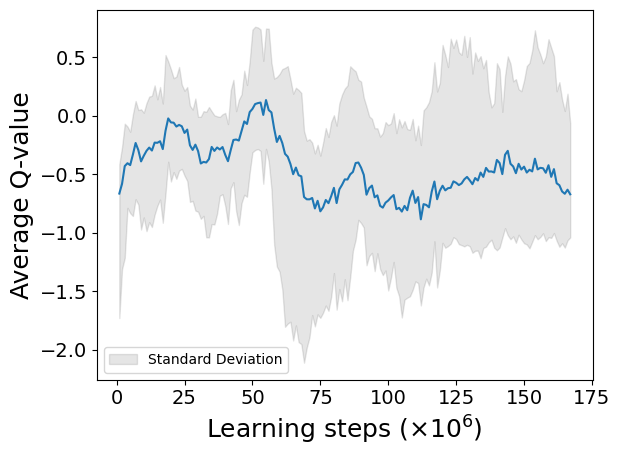

2024-07-28 03:47:18.874096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 03:58:06.874608: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:02:52.800040: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:03:52.993596: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:09:46.481200: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:26:48.801317: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


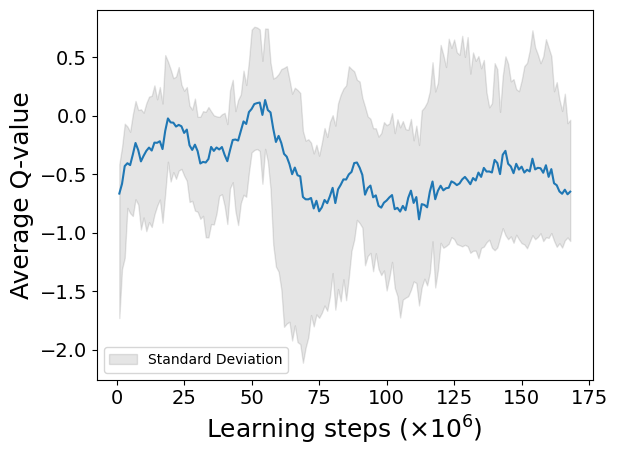


 time for simulate one day : 6546.2

average moving queuetime :  67.9 109.6
average stay queuetime :  140.8 106.2
average total queuetime :  208.7 215.7
average chargecount :  1.7 1.8
average ordercount :  41.9 42.0
[64, 35, 24, 26, 45, 51, 31, 54, 41, 52, 66, 26]
[79, 17, 17, 53, 53, 43, 28, 32, 40, 74, 59, 42]
[30, 39, 29, 40, 34, 37, 45, 52, 53, 53, 52, 26]
[53, 32, 50, 48, 24, 61, 36, 38, 47, 54, 54, 40]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.928592712481368
code start to now : 819457.9
episode_reward :  718.3517757089536
fit_count :  1680584
TD max = 1.9911832631587982 TD min = 0.00010031232833852535
model updated

episode 41
day : 0


2024-07-28 04:32:19.961187: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:35:31.362911: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:59:09.211193: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:06:57.150701: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:10:01.407009: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:28:08.831525: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:44:43.941140: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:56:56.181109: W tensorflow/core/data/root_dataset.cc:24

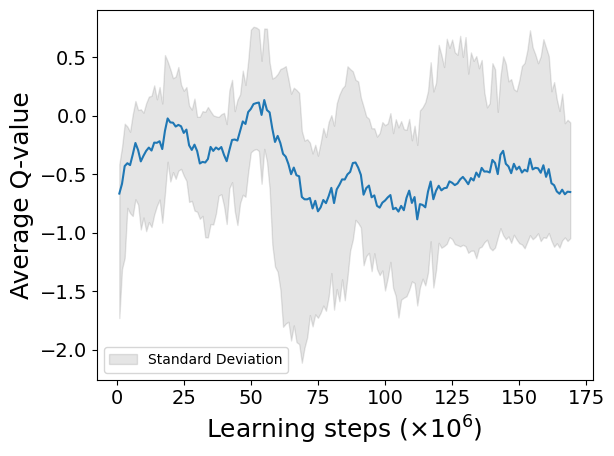

2024-07-28 06:15:29.848860: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 06:15:34.255685: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 06:32:34.681782: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7440.0

average moving queuetime :  81.5 116.8
average stay queuetime :  614.9 881.4
average total queuetime :  696.4 998.2
average chargecount :  1.4 1.4
average ordercount :  41.2 41.2
day : 1


2024-07-28 06:41:26.968797: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:00:38.035447: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:27:10.426115: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


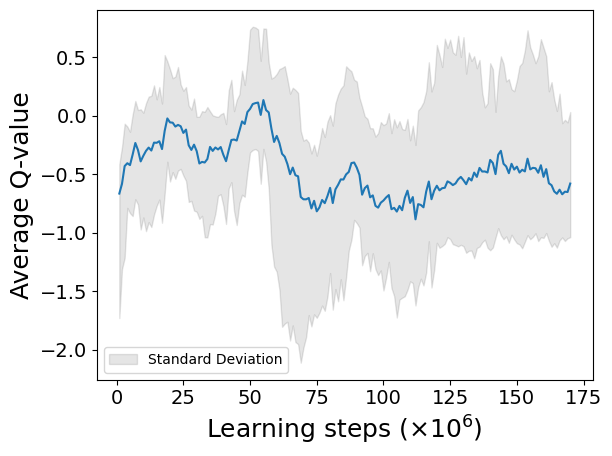

2024-07-28 07:47:58.130012: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 08:17:11.845130: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6562.3

average moving queuetime :  72.8 112.0
average stay queuetime :  368.2 276.0
average total queuetime :  441.0 388.1
average chargecount :  1.6 1.7
average ordercount :  41.5 41.8
day : 2


2024-07-28 08:34:47.021276: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


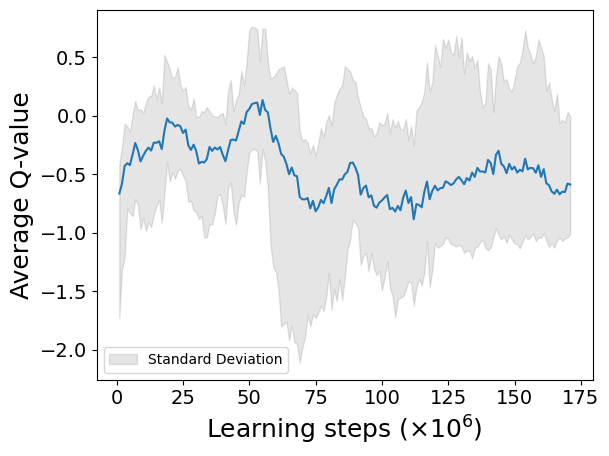

2024-07-28 09:24:19.769582: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 09:24:52.791138: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:00:10.029375: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


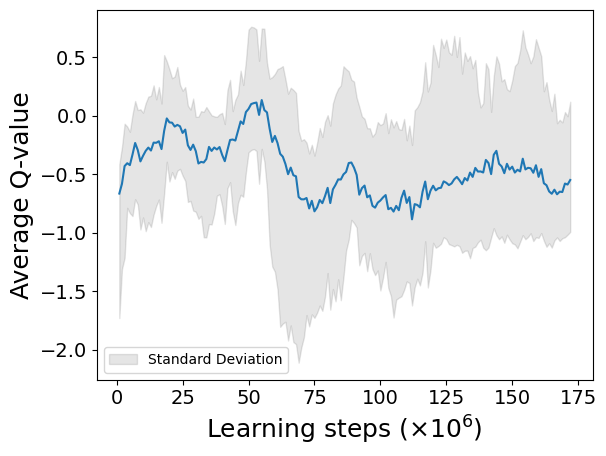


 time for simulate one day : 6406.2

average moving queuetime :  72.2 128.3
average stay queuetime :  325.2 451.2
average total queuetime :  397.4 579.5
average chargecount :  1.6 1.8
average ordercount :  41.7 42.0
day : 3


2024-07-28 10:18:13.091318: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:32:25.640637: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:20:46.941270: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


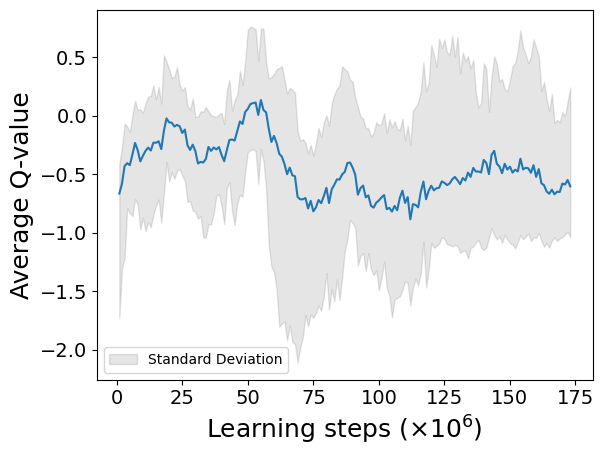

2024-07-28 11:37:14.730596: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:38:07.039671: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:43:00.229965: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6343.6

average moving queuetime :  71.9 122.6
average stay queuetime :  284.1 286.1
average total queuetime :  356.0 408.8
average chargecount :  1.7 1.7
average ordercount :  41.7 41.9
[42, 17, 4, 12, 30, 20, 45, 53, 63, 74, 52, 18]
[58, 29, 25, 53, 35, 41, 51, 34, 54, 64, 45, 24]
[46, 36, 59, 39, 53, 26, 57, 15, 48, 65, 65, 32]
[73, 15, 28, 51, 46, 29, 40, 44, 40, 75, 49, 27]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.934824087452241
code start to now : 846228.0
episode_reward :  391.6027450667188
fit_count :  1733783
TD max = 2.605871592432663 TD min = 0.00010059843063349164
model updated

episode 42
day : 0


2024-07-28 12:12:41.248630: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 12:13:00.201132: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 12:20:02.318327: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 12:26:28.524388: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


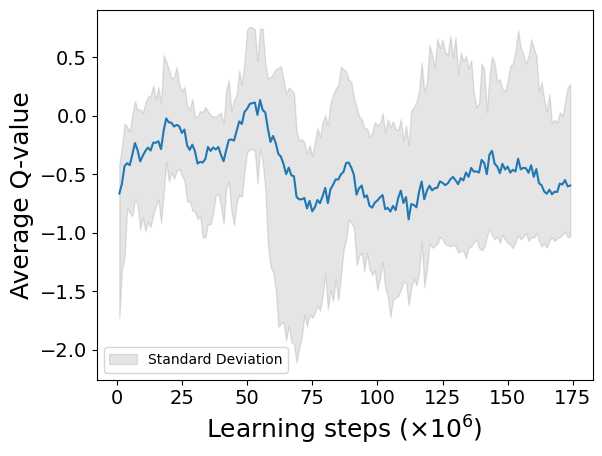

2024-07-28 13:04:58.828768: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:05:38.210025: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:10:00.625934: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:25:36.160099: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:25:39.434401: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6372.7

average moving queuetime :  96.6 142.6
average stay queuetime :  283.6 418.8
average total queuetime :  380.2 561.4
average chargecount :  1.5 1.5
average ordercount :  41.8 41.8
day : 1


2024-07-28 13:58:54.274694: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 14:01:20.060924: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


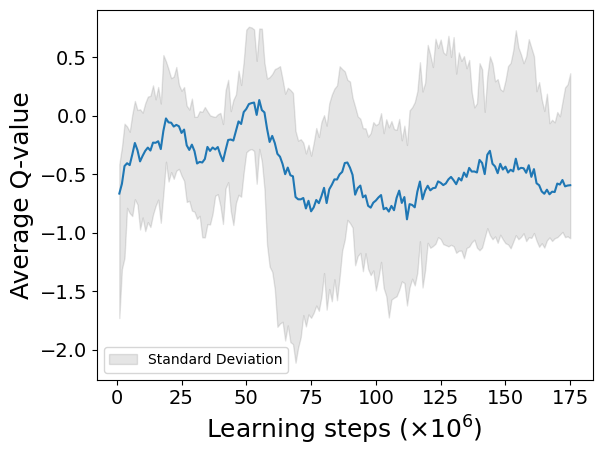

2024-07-28 14:34:00.708334: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 14:57:17.080590: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 15:11:51.261145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 15:28:02.385303: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


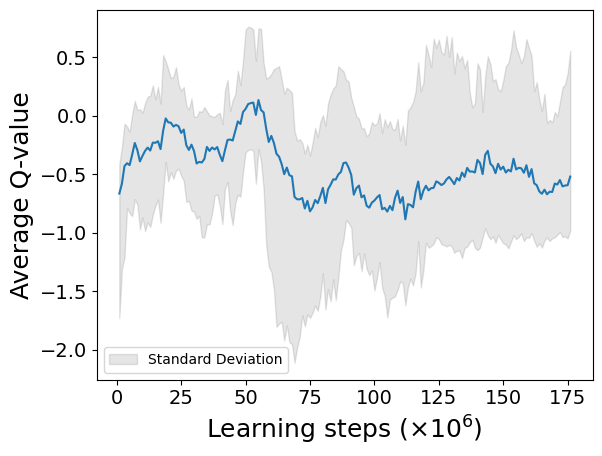


 time for simulate one day : 6439.8

average moving queuetime :  82.5 126.8
average stay queuetime :  168.2 130.5
average total queuetime :  250.6 257.3
average chargecount :  1.6 1.8
average ordercount :  42.0 42.1
day : 2


2024-07-28 15:44:19.496079: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 15:54:44.141184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:09:14.608016: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:20:49.021170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:45:13.424531: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


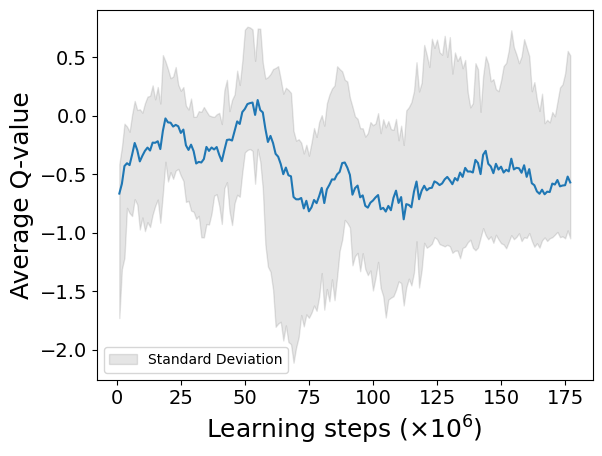

2024-07-28 17:04:25.447648: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 17:10:19.831162: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6479.0

average moving queuetime :  77.5 122.9
average stay queuetime :  140.3 160.9
average total queuetime :  217.7 283.7
average chargecount :  1.7 1.8
average ordercount :  42.0 42.0
day : 3


2024-07-28 17:22:53.716214: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 17:36:53.658809: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 17:38:36.295921: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 17:58:50.347828: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


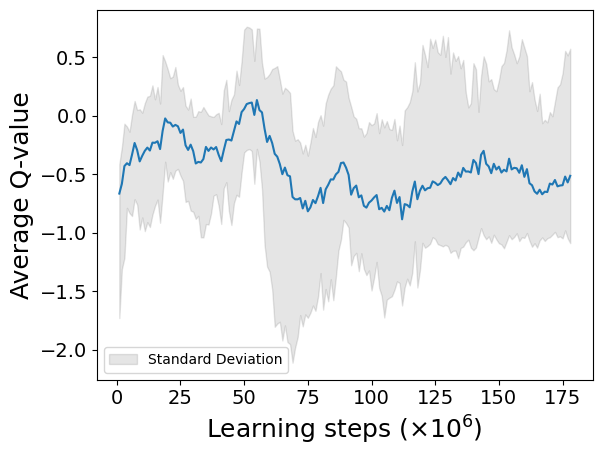

2024-07-28 18:22:51.333527: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 18:36:37.286772: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 18:57:04.178890: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 18:57:14.349079: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6399.1

average moving queuetime :  74.9 122.6
average stay queuetime :  125.2 150.7
average total queuetime :  200.1 273.3
average chargecount :  1.7 1.8
average ordercount :  42.0 41.9
[56, 4, 4, 2, 25, 32, 65, 53, 45, 59, 51, 47]
[62, 30, 46, 22, 25, 54, 52, 44, 58, 50, 55, 39]
[60, 31, 38, 42, 36, 39, 55, 41, 60, 61, 47, 29]
[67, 31, 34, 55, 37, 38, 54, 25, 61, 60, 45, 37]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.903660998226841
code start to now : 871935.8
episode_reward :  628.9005156267631
fit_count :  1787363
TD max = 2.422530940270424 TD min = 0.00010059843063349164
model updated

episode 43
day : 0


2024-07-28 19:17:38.336265: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


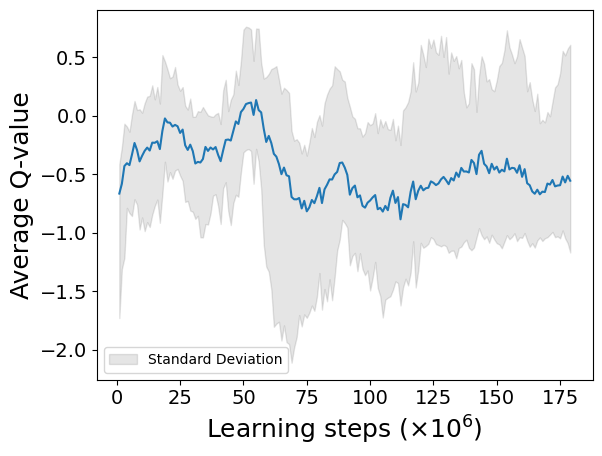

2024-07-28 19:33:17.773569: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 19:38:11.477410: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 20:42:19.076273: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


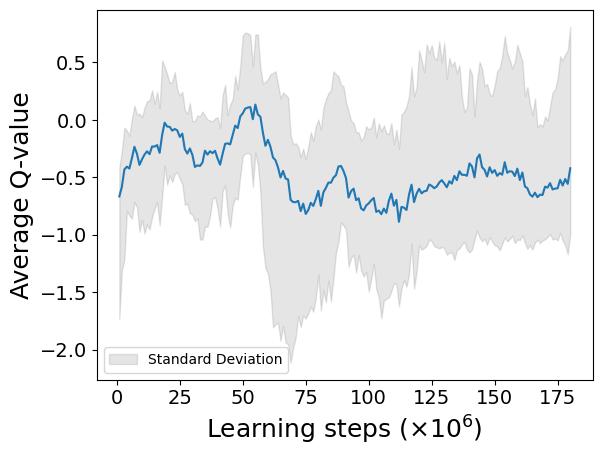


 time for simulate one day : 6484.6

average moving queuetime :  69.1 101.3
average stay queuetime :  105.3 154.4
average total queuetime :  174.4 255.7
average chargecount :  1.5 1.5
average ordercount :  42.0 42.0
day : 1


2024-07-28 20:57:19.229557: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:06:42.680415: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:16:29.489470: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:54:22.045521: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:56:21.430128: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


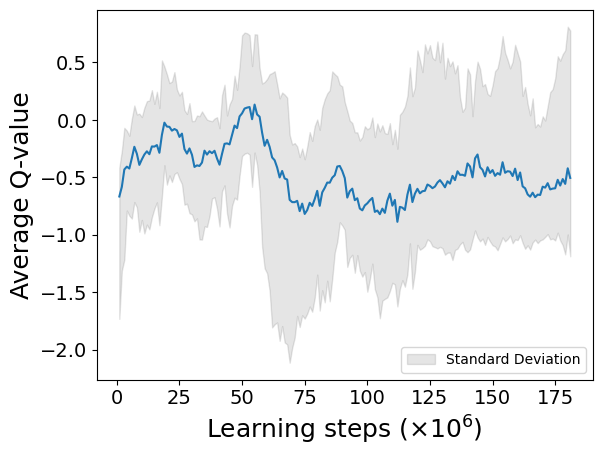

2024-07-28 22:12:35.165639: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 22:39:58.879899: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6429.0

average moving queuetime :  64.4 110.2
average stay queuetime :  112.9 216.8
average total queuetime :  177.3 327.0
average chargecount :  1.6 1.8
average ordercount :  41.9 41.8
day : 2


2024-07-28 22:52:01.303152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 22:59:11.609115: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:11:06.106729: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:13:54.659709: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:26:27.471285: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


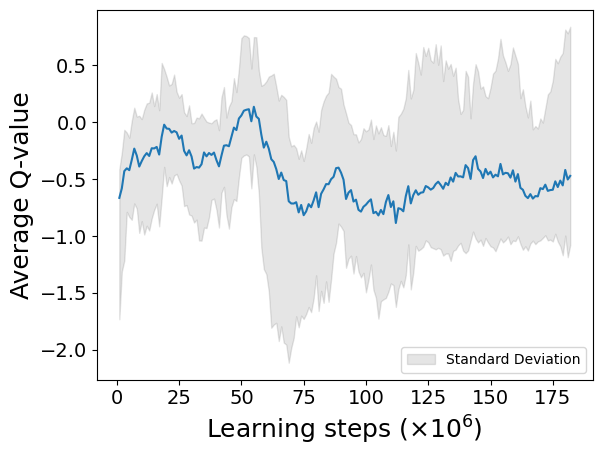

2024-07-28 23:34:26.059659: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:35:12.148159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:36:29.864870: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:41:01.447677: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:42:50.851194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:49:07.718957: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:49:13.739368: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6429.0

average moving queuetime :  65.2 120.3
average stay queuetime :  90.3 88.6
average total queuetime :  155.5 208.9
average chargecount :  1.7 1.8
average ordercount :  42.0 42.1
day : 3


2024-07-29 00:32:40.771122: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 00:40:08.391191: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


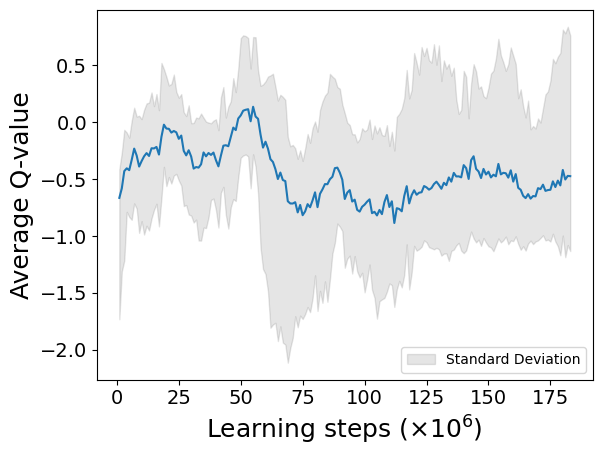

2024-07-29 00:50:16.404762: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:23:05.977979: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:27:19.470010: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:51:19.344483: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 01:55:58.397384: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


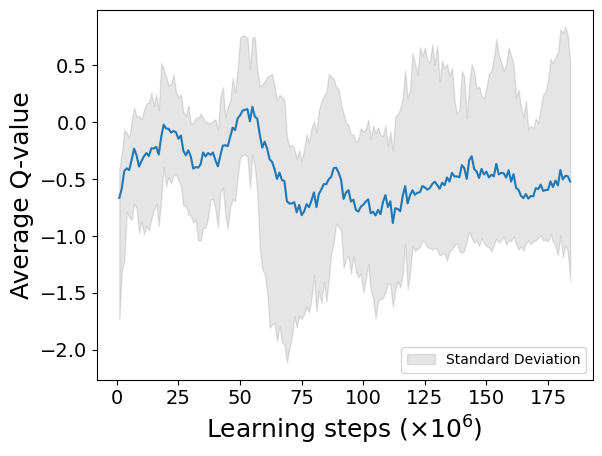


 time for simulate one day : 6508.4

average moving queuetime :  67.5 131.9
average stay queuetime :  97.3 208.6
average total queuetime :  164.8 340.5
average chargecount :  1.7 1.8
average ordercount :  42.0 42.1
[55, 4, 2, 10, 35, 39, 65, 34, 51, 60, 52, 33]
[61, 35, 33, 50, 49, 30, 48, 43, 48, 67, 52, 30]
[74, 19, 43, 38, 47, 28, 65, 35, 54, 63, 52, 23]
[40, 42, 49, 41, 46, 29, 51, 41, 43, 69, 42, 41]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.864564556958715
code start to now : 897803.8
episode_reward :  729.0230748460418
fit_count :  1840984
TD max = 2.2878505230903627 TD min = 0.0001003480911254794
model updated

episode 44
day : 0


2024-07-29 02:34:06.128505: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 03:14:18.971172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 03:19:51.370346: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


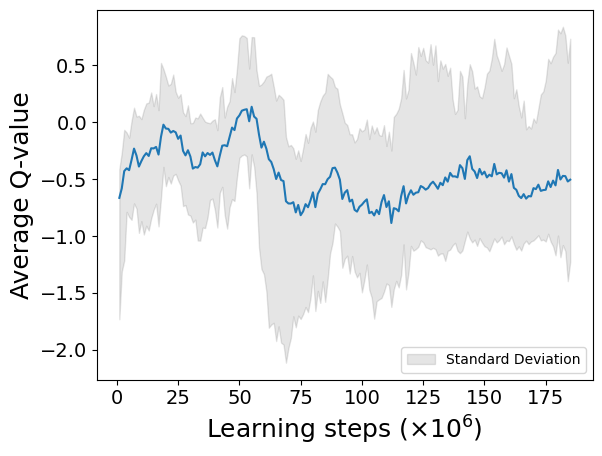

2024-07-29 03:52:00.719500: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:16:42.299612: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7569.5

average moving queuetime :  91.0 131.9
average stay queuetime :  137.5 199.3
average total queuetime :  228.5 331.3
average chargecount :  1.4 1.4
average ordercount :  42.0 42.0
day : 1


2024-07-29 04:24:41.846440: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:38:49.701153: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:39:45.641184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:05:54.571196: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:08:19.247280: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:10:08.787027: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


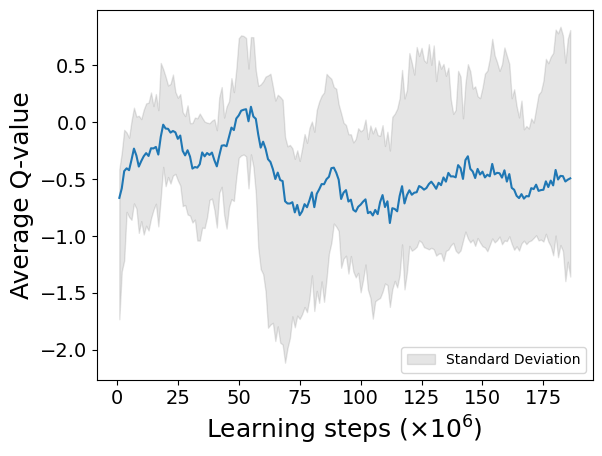

2024-07-29 05:19:20.841182: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:23:42.071338: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:35:55.625708: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:39:57.057895: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:57:53.137883: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 06:03:51.891194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6376.7

average moving queuetime :  75.5 106.5
average stay queuetime :  124.7 194.9
average total queuetime :  200.2 301.4
average chargecount :  1.6 1.7
average ordercount :  42.0 42.0
day : 2


2024-07-29 06:14:17.622344: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


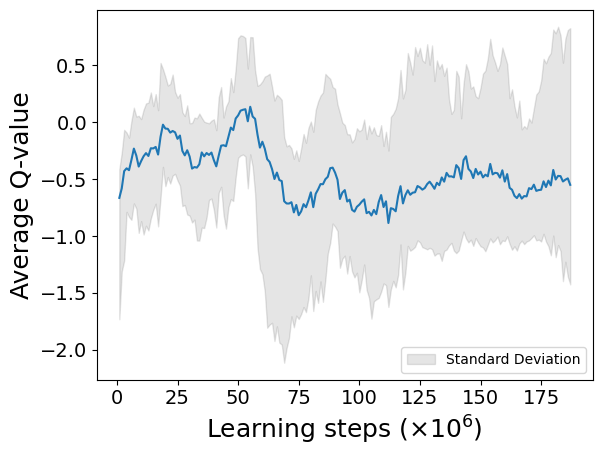

2024-07-29 06:32:07.281192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 06:38:26.901163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 06:50:04.502053: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 06:58:10.568147: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 07:31:19.899297: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 07:41:55.208661: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


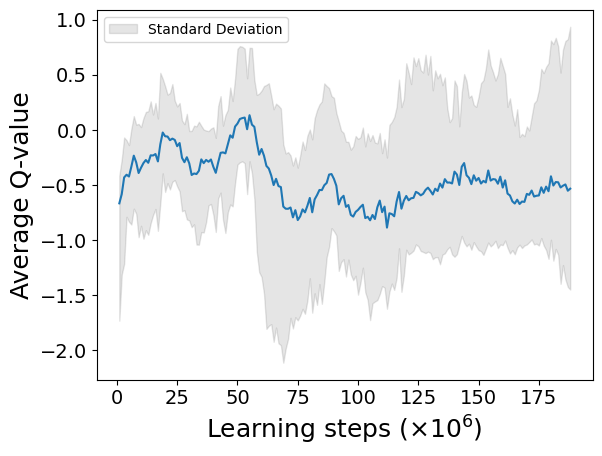

2024-07-29 07:53:38.131297: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 07:54:02.511973: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6493.6

average moving queuetime :  71.5 114.1
average stay queuetime :  113.7 166.8
average total queuetime :  185.2 280.9
average chargecount :  1.6 1.8
average ordercount :  42.0 42.0
day : 3


2024-07-29 08:21:12.828725: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:28:33.278944: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:40:26.791161: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:53:31.450885: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 09:01:25.908442: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


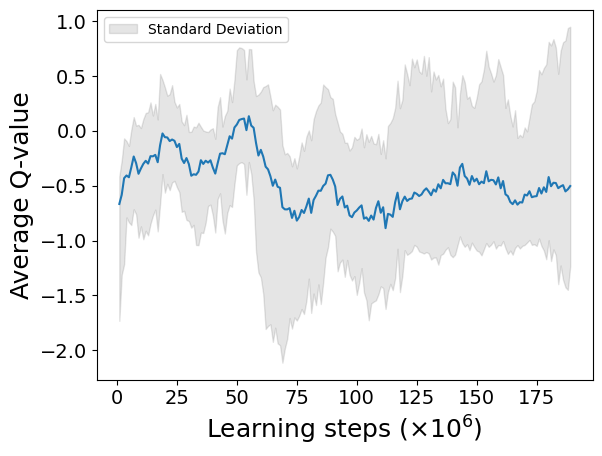

2024-07-29 09:17:16.291281: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 09:18:39.526969: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 09:25:16.688570: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 09:35:32.191123: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 09:38:16.240321: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 09:43:10.471332: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6479.3

average moving queuetime :  70.0 116.1
average stay queuetime :  85.2 9.9
average total queuetime :  155.2 126.0
average chargecount :  1.7 1.8
average ordercount :  42.1 42.3
[38, 18, 5, 4, 29, 35, 48, 57, 47, 60, 51, 43]
[41, 42, 34, 39, 34, 41, 55, 41, 42, 66, 47, 31]
[58, 24, 37, 47, 47, 37, 47, 30, 53, 61, 55, 36]
[51, 29, 38, 49, 29, 44, 46, 50, 50, 53, 49, 42]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.907957727270573
code start to now : 924739.6
episode_reward :  747.7117958561279
fit_count :  1894630
TD max = 2.231953303909302 TD min = 0.0001003480911254794
model updated

episode 45
day : 0


2024-07-29 09:49:22.129139: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 09:53:45.340982: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 10:03:49.198689: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 10:07:42.209501: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 10:17:25.381664: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 10:24:01.588630: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


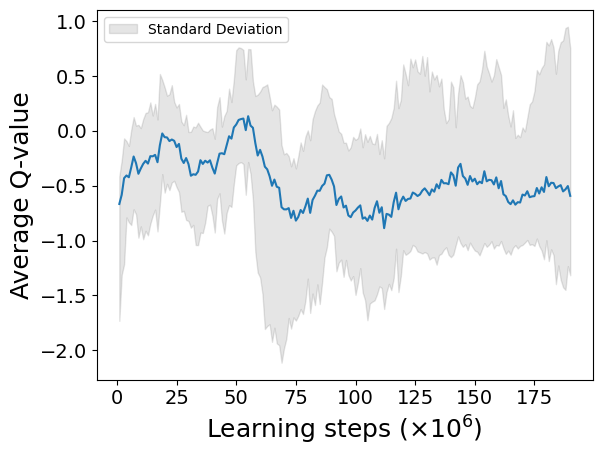

2024-07-29 10:53:25.640108: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 10:59:27.467430: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 11:09:02.837395: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 11:30:49.838986: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6469.5

average moving queuetime :  87.2 127.3
average stay queuetime :  159.5 232.9
average total queuetime :  246.7 360.1
average chargecount :  1.5 1.5
average ordercount :  41.8 41.8
day : 1


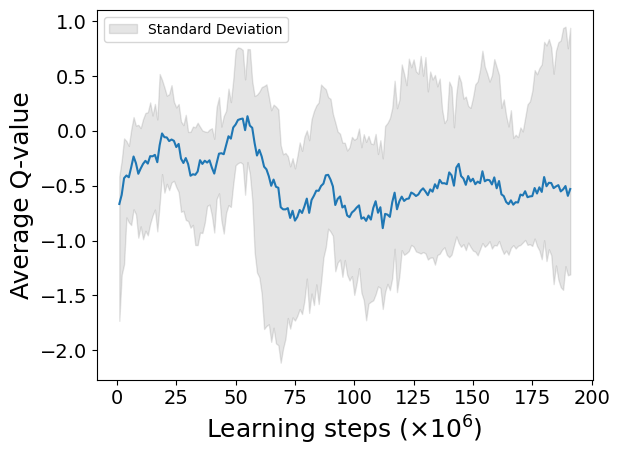

2024-07-29 12:04:08.472393: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:06:03.501132: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:07:01.054029: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:46:45.241184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


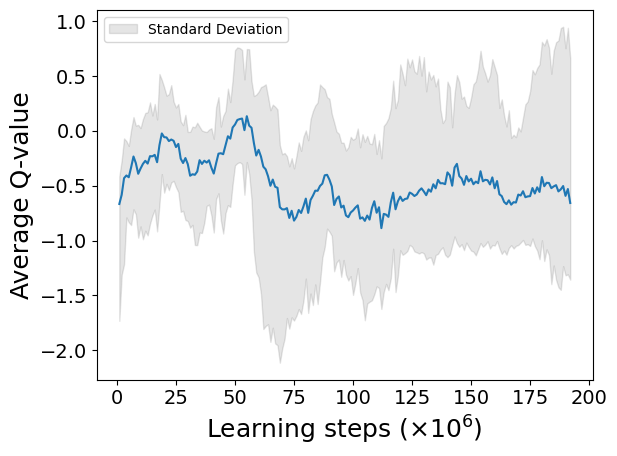


 time for simulate one day : 6409.4

average moving queuetime :  77.0 117.7
average stay queuetime :  168.2 302.0
average total queuetime :  245.2 419.7
average chargecount :  1.6 1.7
average ordercount :  41.8 41.8
day : 2


2024-07-29 13:33:08.930551: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 13:35:31.631580: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 13:36:59.860767: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 14:04:29.307449: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 14:08:43.541160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


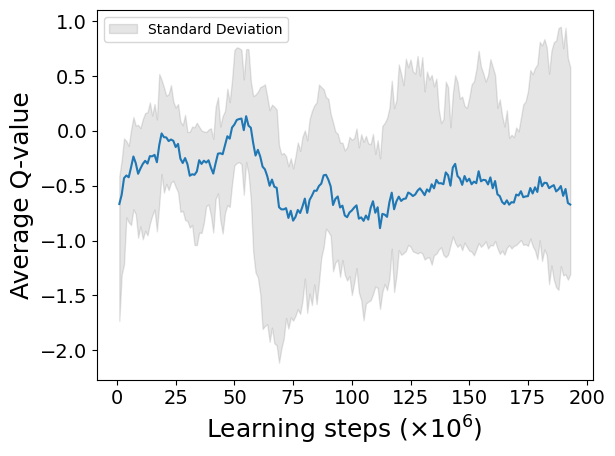

2024-07-29 14:36:26.436814: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 15:03:06.598815: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 15:06:23.611160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6304.6

average moving queuetime :  72.4 113.1
average stay queuetime :  177.3 342.1
average total queuetime :  249.7 455.2
average chargecount :  1.6 1.8
average ordercount :  41.8 41.7
day : 3


2024-07-29 15:11:54.580702: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 15:49:19.947211: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


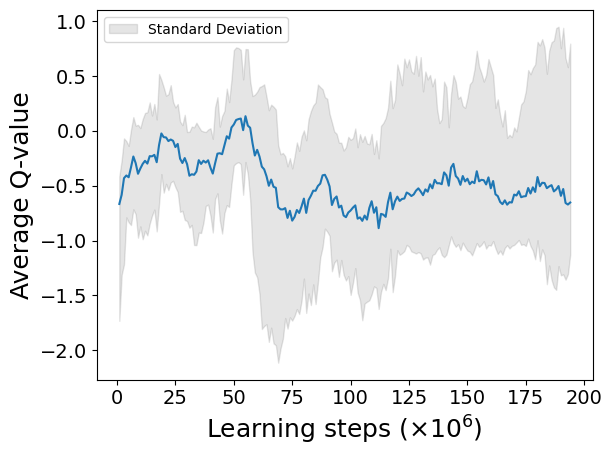

2024-07-29 15:58:10.691157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 16:00:05.091224: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 16:09:28.697675: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 16:10:33.966177: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 16:17:11.229694: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 16:25:21.945578: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 16:38:05.231160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6285.6

average moving queuetime :  72.1 120.1
average stay queuetime :  257.0 826.7
average total queuetime :  329.1 946.7
average chargecount :  1.7 1.7
average ordercount :  41.7 41.5
[57, 3, 2, 4, 32, 24, 67, 52, 38, 75, 46, 38]
[48, 36, 33, 47, 35, 42, 25, 55, 43, 69, 51, 32]
[43, 30, 46, 37, 51, 29, 62, 27, 48, 64, 55, 38]
[42, 27, 37, 43, 55, 26, 34, 32, 60, 75, 52, 22]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.9707164673189554
code start to now : 950226.6
episode_reward :  458.1466888719025
fit_count :  1947788
TD max = 3.180368473625183 TD min = 0.00010130891799932087
model updated

episode 46
day : 0


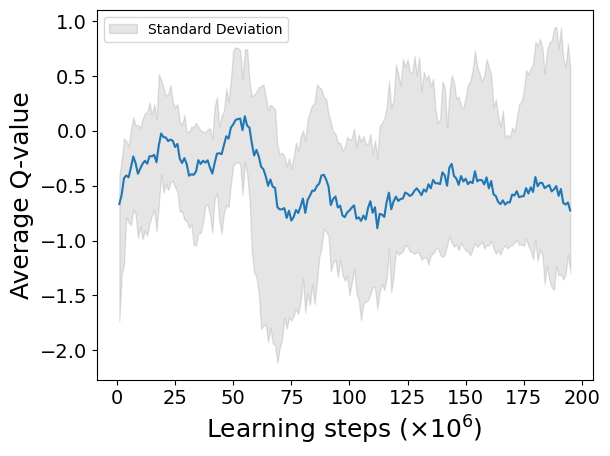

2024-07-29 17:31:51.156921: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 17:49:32.031317: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:22:59.399515: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:23:38.121109: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:24:00.982890: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


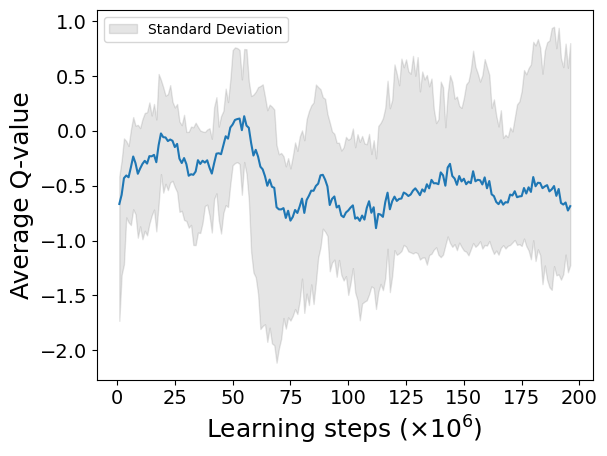

2024-07-29 18:35:44.179184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6334.4

average moving queuetime :  71.6 103.9
average stay queuetime :  76.5 110.9
average total queuetime :  148.1 214.7
average chargecount :  1.4 1.4
average ordercount :  42.2 42.2
day : 1


2024-07-29 18:47:00.663000: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:05:44.641350: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:08:02.181152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:25:15.806908: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:30:06.711170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:41:26.584259: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:48:57.931197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


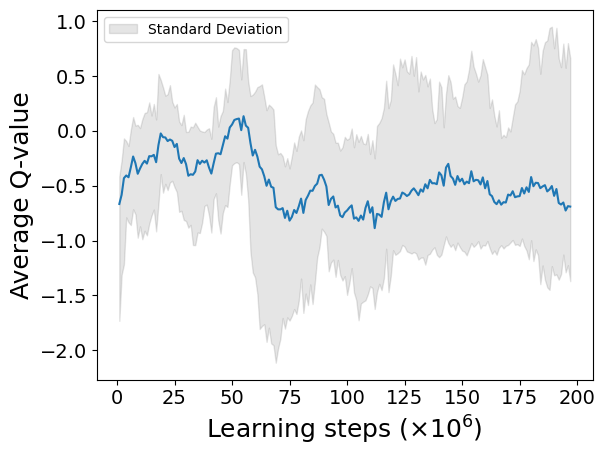

2024-07-29 20:00:23.498852: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 20:10:32.667574: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 20:21:00.481256: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6417.0

average moving queuetime :  69.1 122.1
average stay queuetime :  134.8 329.9
average total queuetime :  203.9 452.0
average chargecount :  1.6 1.8
average ordercount :  42.1 41.9
day : 2


2024-07-29 20:30:15.696904: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 20:56:38.541615: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 21:07:01.329298: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


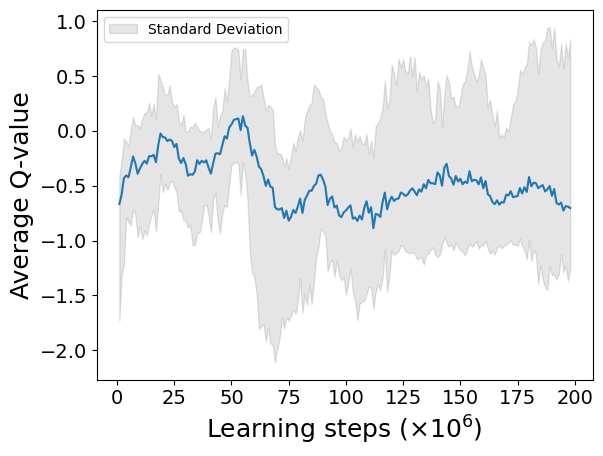

2024-07-29 21:10:44.912097: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 21:11:21.811244: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 21:15:53.722733: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 21:52:34.760100: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 21:57:21.806443: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6464.6

average moving queuetime :  67.6 111.1
average stay queuetime :  145.6 284.5
average total queuetime :  213.2 395.7
average chargecount :  1.7 1.7
average ordercount :  42.0 41.9
day : 3


2024-07-29 22:23:25.962911: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


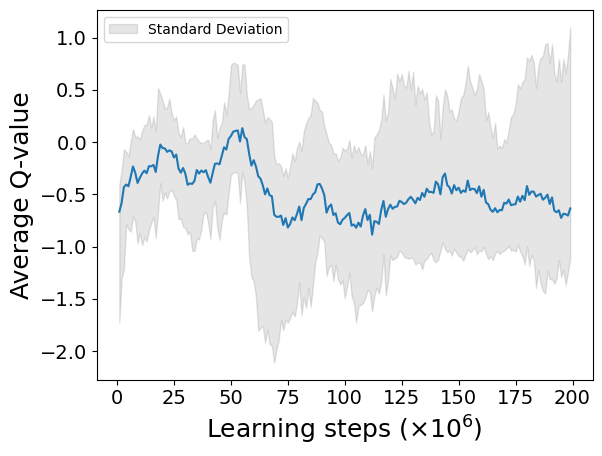

2024-07-29 23:11:18.093300: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 23:13:35.414190: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 23:17:10.779710: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 23:24:37.942342: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


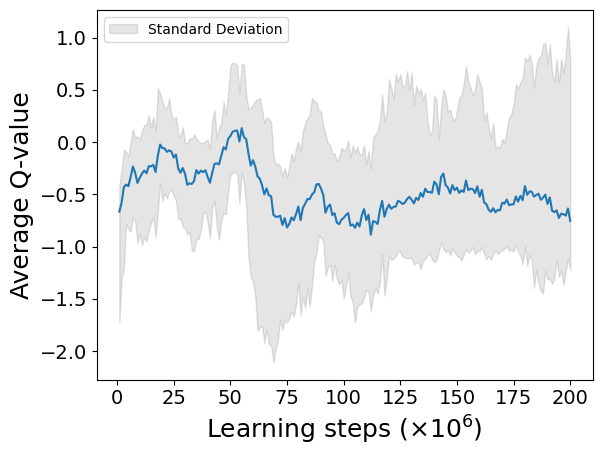


 time for simulate one day : 6442.9

average moving queuetime :  67.7 119.0
average stay queuetime :  178.5 477.5
average total queuetime :  246.1 596.5
average chargecount :  1.7 1.8
average ordercount :  41.9 41.7
[27, 23, 10, 14, 21, 42, 62, 45, 46, 53, 53, 39]
[89, 32, 23, 38, 51, 42, 45, 34, 41, 65, 62, 24]
[59, 19, 42, 41, 39, 44, 35, 34, 49, 60, 65, 27]
[61, 33, 32, 32, 51, 48, 45, 24, 40, 72, 55, 34]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.946279079878308
code start to now : 975902.6
episode_reward :  622.9380705039152
fit_count :  2001257
TD max = 2.0668749905586243 TD min = 0.00010012397766102624
model updated

episode 47
day : 0


2024-07-30 00:13:39.856981: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:14:11.826680: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:25:40.847162: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:26:35.397535: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:27:15.841178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:32:39.765246: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:35:29.026899: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:52:04.086987: W tensorflow/core/data/root_dataset.cc:24

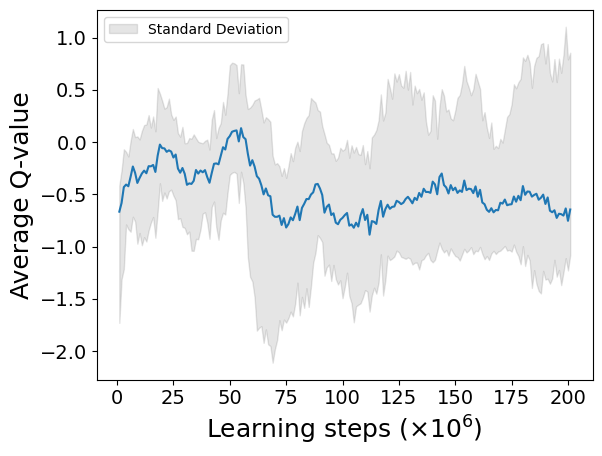


 time for simulate one day : 6242.0

average moving queuetime :  79.0 112.4
average stay queuetime :  418.0 595.0
average total queuetime :  497.0 707.4
average chargecount :  1.4 1.4
average ordercount :  41.7 41.7
day : 1


2024-07-30 01:56:38.270149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 02:03:55.331132: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


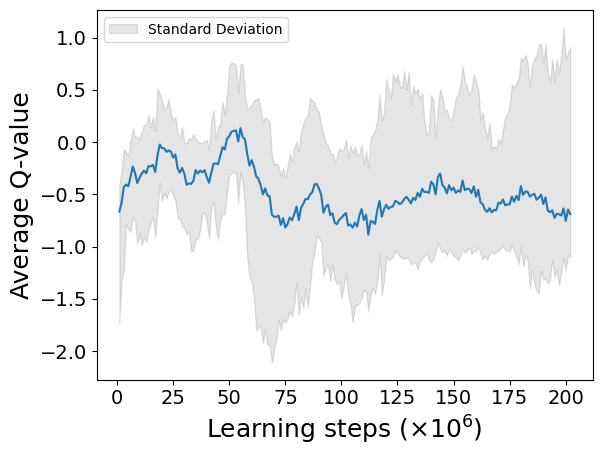

2024-07-30 02:52:05.917127: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:11:13.441241: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:13:02.931167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:13:21.957791: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6352.4

average moving queuetime :  72.1 112.4
average stay queuetime :  254.5 199.0
average total queuetime :  326.6 311.5
average chargecount :  1.6 1.7
average ordercount :  41.8 41.9
day : 2


2024-07-30 03:32:02.109284: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:32:03.958560: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:35:25.321240: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:43:51.373994: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:45:50.965252: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:46:22.862195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


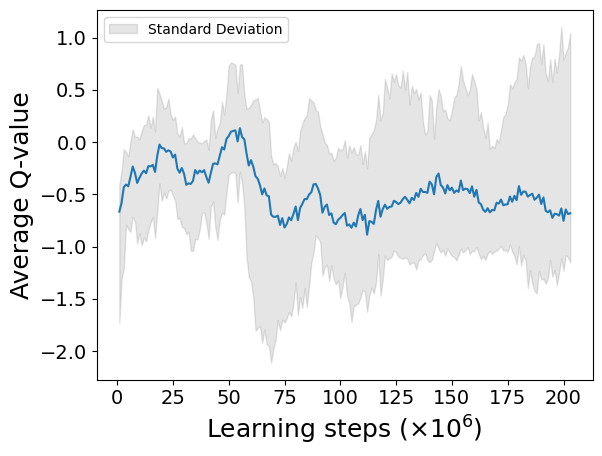

2024-07-30 03:57:46.429354: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:58:51.917397: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 04:24:28.501423: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 04:25:00.059174: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 05:01:29.499257: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


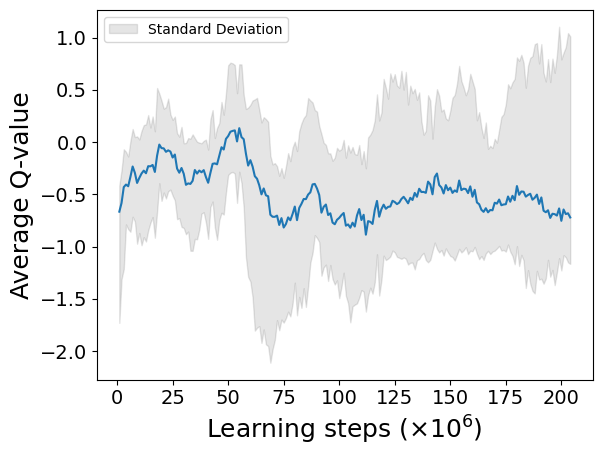


 time for simulate one day : 6389.3

average moving queuetime :  69.3 109.3
average stay queuetime :  193.5 139.5
average total queuetime :  262.8 248.8
average chargecount :  1.6 1.7
average ordercount :  41.8 41.7
day : 3


2024-07-30 05:19:26.321175: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 05:20:51.230694: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 05:23:33.567083: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 06:02:02.882358: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


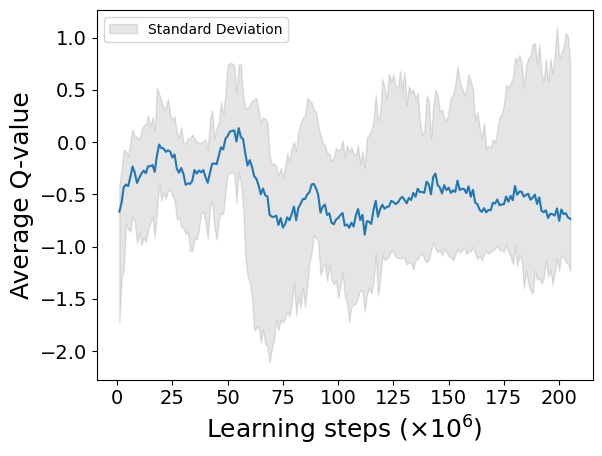

2024-07-30 06:36:55.700887: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 06:38:08.859511: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 06:44:14.696541: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 06:48:59.776095: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6348.3

average moving queuetime :  71.7 137.3
average stay queuetime :  186.1 289.5
average total queuetime :  257.8 426.8
average chargecount :  1.6 1.8
average ordercount :  41.8 41.6
[34, 20, 6, 12, 19, 39, 56, 40, 52, 68, 59, 22]
[29, 51, 38, 43, 22, 50, 53, 40, 40, 63, 59, 21]
[62, 26, 40, 51, 30, 32, 57, 41, 52, 58, 43, 19]
[45, 42, 46, 60, 20, 30, 53, 44, 48, 68, 47, 22]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.8543516540986955
code start to now : 1001251.6
episode_reward :  531.7822569350661
fit_count :  2054461
TD max = 2.3305778110980993 TD min = 0.00010004887580873359
model updated

episode 48
day : 0


2024-07-30 07:14:22.050513: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 07:45:22.787875: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


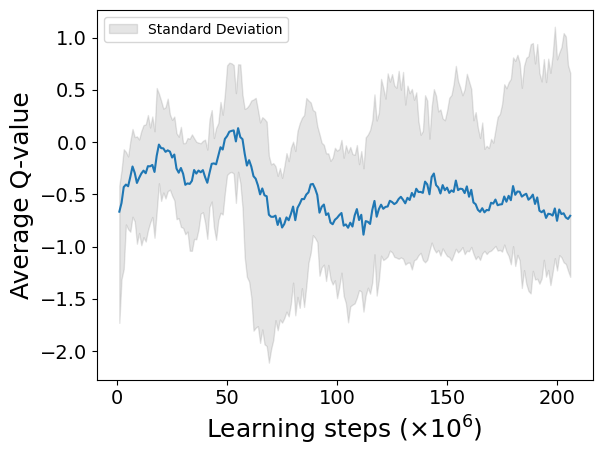

2024-07-30 07:50:05.750201: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:47:04.414071: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6306.4

average moving queuetime :  63.4 96.7
average stay queuetime :  171.1 261.3
average total queuetime :  234.5 358.0
average chargecount :  1.5 1.5
average ordercount :  41.8 41.8
day : 1


2024-07-30 08:55:45.446760: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 09:07:27.645534: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 09:20:45.266095: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


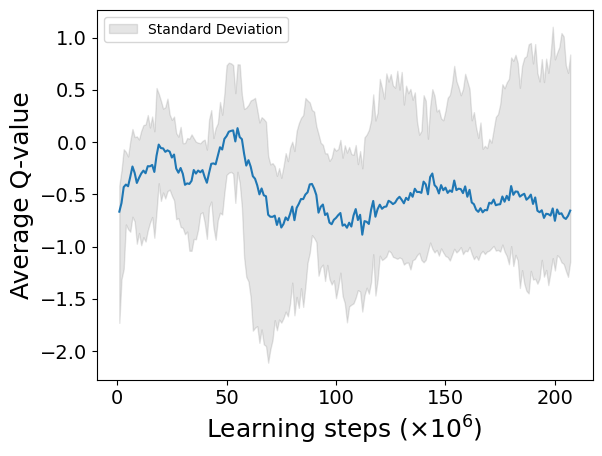

2024-07-30 09:30:20.319388: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 09:31:38.523636: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 09:36:51.529142: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 09:55:20.070725: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 10:06:36.540312: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


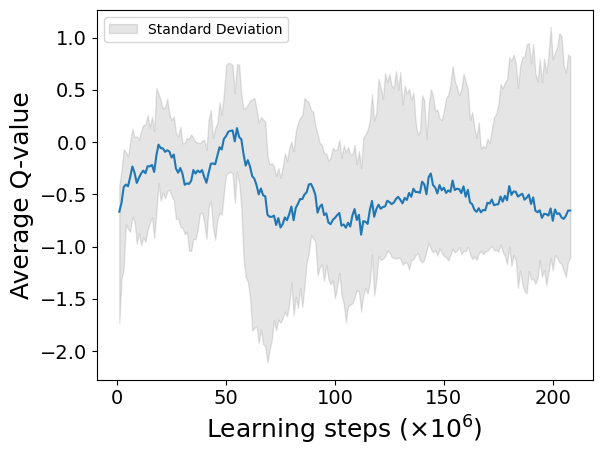


 time for simulate one day : 7548.1

average moving queuetime :  63.4 111.7
average stay queuetime :  143.1 209.2
average total queuetime :  206.6 320.9
average chargecount :  1.6 1.8
average ordercount :  42.0 42.2
day : 2


2024-07-30 11:06:57.790656: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 11:19:00.961236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 11:19:35.753355: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 11:42:17.969850: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 12:01:30.090948: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


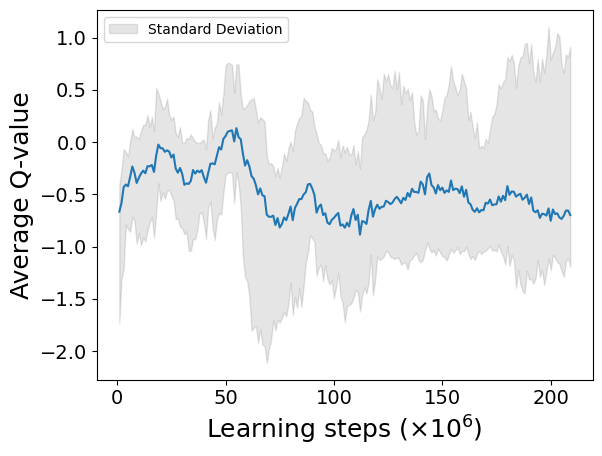

2024-07-30 12:06:28.568570: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 12:22:00.876924: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 12:36:45.401181: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6427.0

average moving queuetime :  63.3 112.2
average stay queuetime :  137.1 224.0
average total queuetime :  200.4 336.2
average chargecount :  1.7 1.8
average ordercount :  42.0 42.1
day : 3


2024-07-30 13:04:00.874972: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 13:07:41.562726: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 13:14:13.710324: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 13:26:25.569917: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


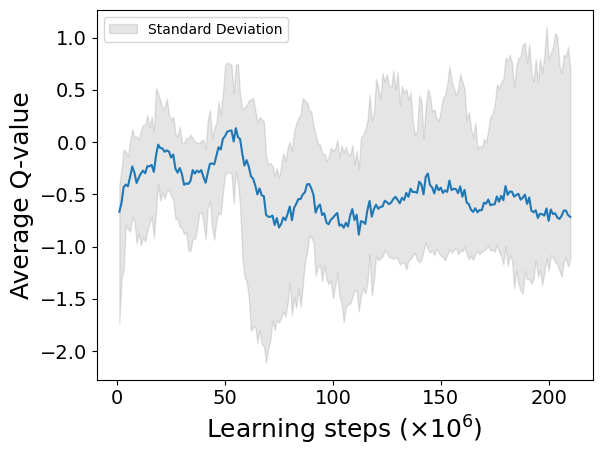

2024-07-30 14:02:00.188299: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7582.9

average moving queuetime :  63.1 107.5
average stay queuetime :  113.6 76.7
average total queuetime :  176.7 184.2
average chargecount :  1.7 1.7
average ordercount :  42.0 41.9
[51, 6, 3, 30, 62, 15, 58, 30, 53, 65, 53, 32]
[48, 40, 27, 44, 42, 52, 45, 40, 44, 59, 63, 24]
[71, 18, 32, 48, 48, 39, 45, 40, 46, 64, 57, 26]
[52, 31, 35, 26, 50, 59, 43, 38, 50, 54, 60, 18]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.883072388047892
code start to now : 1029132.8
episode_reward :  744.1434354353539
fit_count :  2108034
TD max = 2.3305778110980993 TD min = 0.00010004887580873359
model updated

episode 49
day : 0


2024-07-30 14:52:36.680538: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 14:54:36.339351: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 14:54:46.310715: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


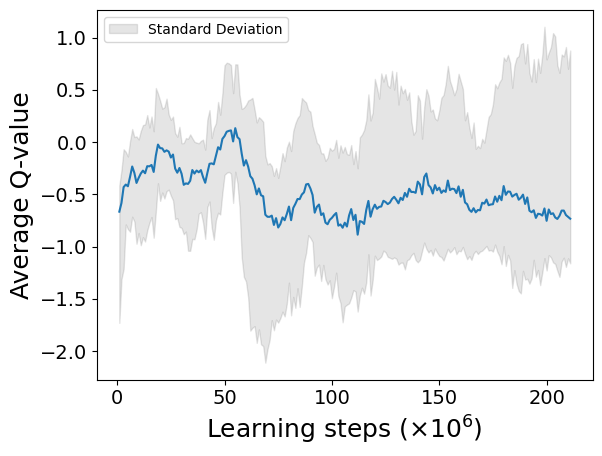

2024-07-30 15:40:29.764953: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 15:49:47.841140: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 15:58:45.087755: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 16:04:38.129234: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 16:08:09.508833: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 16:11:49.789335: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 16:13:19.868647: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


In [ ]:
star = tim.time()
for popul in range(100000):
    
#     fit_count = 0
    start = tim.time()
    print('\nepisode',popul)
    episode_reward = 0

    

    terminal = False
    tmp_terminal = False
    
    end_bike_n()
    bike_df = []
    for i in range(int(bike_n)):
        bike_df.append(pd.DataFrame(columns=['order_count', 'acc_dist', 'charge_count', 'queue_count', 'moving_queue_time', 'stay_queue_time','total_queue_time']))
    min_his_df = []
    soc_df = []
    #[self.key, bike_idx, self.queue[0][1], time - self.queue[0][1]]


    end_bike_n()

    day=0
    while terminal == False:
        sta = tim.time()
        
        print('day :',day)
        
        time = 0
        event_list=[]

        for i in range(len(bike)):
            event_list.append([0, bike[i], 'decide'])
        
        event_list = sorted(event_list)
        while len(event_list)>0:
#             print(len(event_list))

                
            
#             event_list = sorted(event_list)
#             print(event_list[0], event_list[0][1].key)
        

            time = event_list[0][0]
            if len(event_list[0])<4:
                getattr(event_list[0][1],event_list[0][2])()
            elif len(event_list[0])==4:
                getattr(event_list[0][1],event_list[0][2])(event_list[0][3])
            else:
                print('event_list length error')
            if terminal == True:
                break
#             time = event_list[0][0]

        print('\n time for simulate one day : %.1f'%(tim.time()-sta))
            

        end_day()
        tmp_df = copy.deepcopy(bike_df[0])
        for i in range(1,len(bike_df)):
            tmp_df +=bike_df[i]
        tmp_df = tmp_df/len(bike_df)
        tmp_chargecount = np.mean(tmp_df.iloc[:,2])
        tmp_queuetime1 = np.mean(tmp_df.iloc[:,4])
        tmp_queuetime2 = np.mean(tmp_df.iloc[:,5])
        tmp_queuetime3 = np.mean(tmp_df.iloc[:,6])
        tmp_ordercount = np.mean(tmp_df.iloc[:,0])
        print('\naverage moving queuetime : ',round(tmp_queuetime1/tmp_chargecount,1),round(tmp_df.iloc[-1,4],1))
        print('average stay queuetime : ',round(tmp_queuetime2/tmp_chargecount,1),round(tmp_df.iloc[-1,5],1))
        print('average total queuetime : ',round(tmp_queuetime3/tmp_chargecount,1),round(tmp_df.iloc[-1,6],1))
        print('average chargecount : ',round(tmp_chargecount,1),round(tmp_df.iloc[-1,2],1))
        print('average ordercount : ',round(tmp_ordercount,1),round(tmp_df.iloc[-1,0],1))
        del event_list
        if day == int(day_n):
            terminal = True
            tmp_terminal = True
        day += 1
            

    with open(str(int(bike_n))+'bike'+str(int(day_n))+'days.pickle', 'wb') as f:
        pickle.dump(bike_df, f)
    with open(str(int(bike_n))+'min_his'+str(int(day_n))+'days.pickle', 'wb') as f:
        pickle.dump(min_his_df, f)
#     with open(r'C:\Users\ysp\Dropbox\python_code\zentropy\algo5\\'+str(bike_n)+'soc_his'+str(day_n)+'days.pickle', 'wb') as f:
#         pickle.dump(soc_df, f)
    for i in range(len(min_his_df)):
        tmp_data = min_his_df[i]
        count = [0,0,0,0,0,0,0,0,0,0,0,0]
        for j in range(len(tmp_data)):
            for k in range(len(tmp_data[j])):
                if int(tmp_data[j][k][3]//3600) >11:
                    count[-1] +=1
                else:
                    count[int(tmp_data[j][k][3]//3600)] += 1
        print(count)
    print([4,13,12,10,8,7,7,10,16,16,9,4])       
    cycle_sum = []
    for i in range(len(battery)):
        cycle_sum.append(battery[i].cycle)
    print('cycle : ',np.mean(cycle_sum))
    stop = tim.time()  
    print('code start to now : %.1f'%(stop - star))
    print('episode_reward : ', episode_reward)
    print('fit_count : ',fit_count)
    print('TD max =', np.max(TD_error_list), 'TD min =', np.min(TD_error_list))
    exploration_rate = 0.1-fit_count/10000000
    TD_max = np.max(TD_error_list[:int(9*len(TD_error_list)/10)])
    max_w_i = (len(D_memory)*TD_max/np.sum(TD_error_list))**(-beta)
    
    if episode_reward > best_episode_reward:
        best_episode_reward = episode_reward
#         model.save('best_model(230).h5')
        model.save_weights("CDQN4EM_G(300)(w).h5")
        print('best model updated')
        if episode_reward > 300:
            day_n+=0.25
#             bike_n+=0.5
    if day_n >30:
        day_n = 30
#     if bike_n >230:
#         bike_n=230
        
    
#     fit_count += 1
#         model2 = load_model('best_model.h5')
#         model2.compile(optimizer='rmsprop',loss=['mse'])
    if fit_count > 1000000:
        print('model updated')
        model2.set_weights(model.get_weights())

#     with open('D_often.pickle', 'wb') as f:
#         pickle.dump(D_often, f)
#     with open('D_sparse.pickle', 'wb') as f:
#         pickle.dump(D_sparse, f)
    

In [ ]:
day_n = 3

In [ ]:
event_list

In [ ]:
bike

In [ ]:
event_list

In [ ]:
TD_max/np.sum(TD_error_list)

In [ ]:
len(TD_index)

In [ ]:
len(TD_error_list)

In [ ]:
for i in range(len(TD_error_list)):
    print(TD_error_list[i])

In [ ]:
len(TD_error_list)

In [ ]:
random.sample([1,2,3,4], counts=[30,10,1,1], k=3)

In [ ]:
for i in range(10):
    TD_index = np.arange(0,len(TD_error_list))
    choice = random.choices(TD_index, weights = TD_error_list)[0]
    print(choice)
    train = D_memory[choice]

    tmp=[]
    tmp.append(np.array([train[0][0:34]]))
    tmp.append(np.array([train[0][34:154]]))
    tmp.append(np.array([train[0][154:184]]))
    mask = masking(train[0])
    print(mask)
    tmp.append(np.array([mask]))
    with tf.device('/device:CPU:0'):
        predicted1 = model.predict_on_batch(tmp).copy()
    print('battery: ',train[0][2],'action: ',train[1],'reward: ', train[2])
    print(predicted1)
    print(train[0][34:64])

In [ ]:
TD_index = np.arange(0,len(TD_error_list))
choice = random.choices(TD_index, weights = TD_error_list)[0]
print(choice)
train = D_memory[choice]

tmp=[]
tmp.append(np.array([train[3][0:64]]))
tmp.append(np.array([train[3][64:154]]))
tmp.append(np.array([train[3][154:184]]))

In [ ]:
train[3][2]

In [ ]:
train[3][35]

In [ ]:
mask = np.ones(31)
if train[3][2] < 0.05:
    mask[30] = 0
for i in range(30):
    if train[3][34+i] > 1:
        mask[i] = 0

In [ ]:
mask

In [ ]:
tmp

In [ ]:
len(TD_error_list)

In [ ]:
len(TD_index)

In [ ]:
model = load_model('current_model.h5')
model.compile(optimizer = 'rmsprop', loss='mse', metrics=['mae','mse'])

## 이어하기

In [ ]:
model = load_model('current_model.h5')
model.compile(optimizer='rmsprop',loss=['mse','mse'])

In [ ]:


star = tim.time()
for popul in range(100000):
    start = tim.time()
    print('\nepisode',popul)

    

    terminal = False
    
    end_bike_n()
    bike_df = []
    for i in range(bike_n):
        bike_df.append(pd.DataFrame(columns=['order_count', 'acc_dist', 'charge_count', 'queue_count', 'queue_time'], index = np.arange(0,day_n)).fillna(0))
    min_his_df = []
    soc_df = []
    #[self.key, bike_idx, self.queue[0][1], time - self.queue[0][1]]


    end_bike_n()

    day=0
    while terminal == False:
        sta = tim.time()
        
        print('day :',day)
        day += 1
        time = 0
        event_list=[]

        for i in range(len(bike)):
            event_list.append([0, bike[i], 'decide'])
        model.save('current_model.h5')
 
        model2 = model
        while time<43200:
            event_list = sorted(event_list)
        

            time = event_list[0][0]
            if len(event_list[0])<4:
                getattr(event_list[0][1],event_list[0][2])()
            elif len(event_list[0])==4:
                getattr(event_list[0][1],event_list[0][2])(event_list[0][3])
            else:
                print('event_list length error')
            if terminal == True:
                break
        print('\n time for simulate one day : ',tim.time()-sta)
            

        end_day()
        del event_list
        if day == day_n:
            terminal = True
            
    tmp_df = bike_df[0]
    for i in range(1,len(bike_df)):
        tmp_df +=bike_df[i]
    tmp_df = tmp_df/len(bike_df)
    tmp_chargecount = np.mean(tmp_df.iloc[:,2])
    tmp_queuetime = np.mean(tmp_df.iloc[:,4])
    print('average queuetime : ',tmp_queuetime)
    print('average chargecount : ',tmp_chargecount)

    with open(str(bike_n)+'bike'+str(day_n)+'days.pickle', 'wb') as f:
        pickle.dump(bike_df, f)
    with open(str(bike_n)+'min_his'+str(day_n)+'days.pickle', 'wb') as f:
        pickle.dump(min_his_df, f)
#     with open(r'C:\Users\ysp\Dropbox\python_code\zentropy\algo5\\'+str(bike_n)+'soc_his'+str(day_n)+'days.pickle', 'wb') as f:
#         pickle.dump(soc_df, f)
        
    cycle_sum = []
    for i in range(len(battery)):
        cycle_sum.append(battery[i].cycle)
    print('cycle : ',np.mean(cycle_sum))
    stop = tim.time()  
    print('code start to terminal : %.1f'%(stop - star))





In [ ]:
from keras.models import load_model

In [ ]:
model.summary()